In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("deepakat002/yolo-object-detection-data-bone-fracture")

print("Path to dataset files:", path)

100%|██████████| 41.6M/41.6M [00:00<00:00, 80.0MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/deepakat002/yolo-object-detection-data-bone-fracture/versions/1


In [2]:
import os

# List the contents of the directory using os.listdir
contents = os.listdir(path)

# Print the contents
print(contents)

['data.yaml', 'data']


In [3]:
import os

# Correct way to list files in a subdirectory
subdirectory_path = os.path.join(path, 'data')  # Combine path with subdirectory name
contents = os.listdir(subdirectory_path)  # Call listdir with the combined path

# Print the contents
print(contents)

['training', 'test']


In [15]:
#create paths for val and train data
train_path = os.path.join(subdirectory_path,'training')
test_path = os.path.join(subdirectory_path,'test')

In [37]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("pkdarabi/bone-fracture-detection-computer-vision-project")

print("Path to dataset files:", path)

100%|██████████| 84.1M/84.1M [00:00<00:00, 117MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2


In [38]:
import os

# List the contents of the directory using os.listdir
contents = os.listdir(path)

# Print the contents
print(contents)

['BoneFractureYolo8', 'bone fracture detection.v4-v4.yolov8']


In [41]:
import os

# Correct way to list files in a subdirectory
subdirectory_path = os.path.join(path, 'BoneFractureYolo8')  # Combine path with subdirectory name
contents = os.listdir(subdirectory_path)  # Call listdir with the combined path

# Print the contents
print(contents)

['train', 'data.yaml', 'README.dataset.txt', 'valid', 'test']


In [42]:
import os


bone_fracture_path = os.path.join(path, 'BoneFractureYolo8')  # Path to BoneFractureYolo8
train_path = os.path.join(bone_fracture_path, 'train')  # Path to train inside BoneFractureYolo8

# Print the path to the 'train' directory
print("Path to train:", train_path)

# Check if the path exists
if os.path.exists(train_path):
    print("Train directory found!")
else:
    print("Train directory not found. Please check the directory structure.")

Path to train: /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/train
Train directory found!


In [44]:
import os

# Correct way to list files in a subdirectory
subdirectory_path = os.path.join(path, 'BoneFractureYolo8')  # Combine path with subdirectory name
contents = os.listdir(subdirectory_path)  # Call listdir with the combined path

# Print the contents
print(contents)

['train', 'data.yaml', 'README.dataset.txt', 'valid', 'test']


In [45]:
#create paths for test and train data
train_path = os.path.join(subdirectory_path, 'train', 'images')
test_path = os.path.join(subdirectory_path, 'test', 'images')


In [59]:
len(os.listdir(train_path))

3631

In [62]:
import os

# Define the root directory
root_dir = '/path/to/BoneFractureYolo8'

# Define the paths for images and labels for each dataset (train, test, valid)
train_images_path = os.path.join(subdirectory_path, 'train', 'images')
train_labels_path = os.path.join(subdirectory_path, 'train', 'labels')

test_images_path = os.path.join(subdirectory_path, 'test', 'images')
test_labels_path = os.path.join(subdirectory_path, 'test', 'labels')

valid_images_path = os.path.join(subdirectory_path, 'valid', 'labels')
valid_labels_path = os.path.join(subdirectory_path, 'valid', 'labels')

# Print the paths to check
print("length", len(train_images_path))
print("length", len(train_labels_path))
print("length", len(test_images_path))
print("length", len(test_labels_path))
print("length", len(valid_images_path))
print("length", len(valid_labels_path))


length 130
length 130
length 129
length 129
length 130
length 130


In [63]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from PIL import Image



# Define an ImageDataGenerator with data augmentation for images
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to load an image and its corresponding label
def load_image_and_label(image_path, label_path):
    # Load the image
    img = image.load_img(image_path, target_size=(224, 224))
    img = image.img_to_array(img)

    # Load the label (assuming YOLO format - a single label file per image)
    label = np.loadtxt(label_path)
    return img, label

# Create a custom data generator to augment both images and labels
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, label_paths, batch_size, image_size, augmentations):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.batch_size = batch_size
        self.image_size = image_size
        self.augmentations = augmentations
        self.indices = np.arange(len(self.image_paths))

    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def on_epoch_end(self):
        # Shuffle indices at the end of each epoch
        np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        images = []
        labels = []
        for idx in batch_indices:
            image_path = self.image_paths[idx]
            label_path = self.label_paths[idx]
            img, label = load_image_and_label(image_path, label_path)
            images.append(img)
            labels.append(label)

        images = np.array(images)
        labels = np.array(labels)

        # Apply augmentations
        augmented_images, augmented_labels = self.augmentations.flow(images, labels, batch_size=self.batch_size).next()

        return augmented_images, augmented_labels

# Get list of image and label paths
image_paths = [os.path.join(train_images_path, f) for f in os.listdir(train_images_path)]
label_paths = [os.path.join(train_labels_path, f) for f in os.listdir(train_labels_path)]

# Create the custom data generator
train_generator = CustomDataGenerator(
    image_paths=image_paths,
    label_paths=label_paths,
    batch_size=32,
    image_size=(224, 224),
    augmentations=train_datagen
)

# Example: Train the model using the generator
# model.fit(train_generator, epochs=10, steps_per_epoch=len(train_generator))


In [64]:
# Check the length of the generator (number of batches per epoch)
print(f"Number of batches per epoch: {len(train_generator)}")


Number of batches per epoch: 113


In [65]:
len(os.listdir(train_path))

3631

In [67]:
# Get the number of labels in the entire dataset
num_labels = len(train_generator) * train_generator.batch_size
print(f"Total number of labels in the dataset: {num_labels}")


Total number of labels in the dataset: 3616


In [68]:
import os

# Path to the train images directory
train_images_path = os.path.join(subdirectory_path, 'train', 'images')

# Count the number of image files in the directory (assuming images are in JPG, PNG format)
num_images = len([f for f in os.listdir(train_images_path) if f.endswith('.jpg') or f.endswith('.png')])
print(f"Total number of images in the training dataset: {num_images}")


Total number of images in the training dataset: 3631


In [70]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import tensorflow as tf
from PIL import Image

# Define an ImageDataGenerator with data augmentation for images (for training)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Define an ImageDataGenerator for validation and test data (only rescaling)
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Function to load an image and its corresponding label
def load_image_and_label(image_path, label_path):
    # Load the image
    img = image.load_img(image_path, target_size=(224, 224))
    img = image.img_to_array(img)

    # Load the label (assuming YOLO format - a single label file per image)
    label = np.loadtxt(label_path)
    return img, label

# Create a custom data generator to augment both images and labels
class CustomDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, label_paths, batch_size, image_size, augmentations):
        self.image_paths = image_paths
        self.label_paths = label_paths
        self.batch_size = batch_size
        self.image_size = image_size
        self.augmentations = augmentations
        self.indices = np.arange(len(self.image_paths))

    def __len__(self):
        return int(np.floor(len(self.image_paths) / self.batch_size))

    def on_epoch_end(self):
        # Shuffle indices at the end of each epoch
        np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        images = []
        labels = []
        for idx in batch_indices:
            image_path = self.image_paths[idx]
            label_path = self.label_paths[idx]
            img, label = load_image_and_label(image_path, label_path)
            images.append(img)
            labels.append(label)

        images = np.array(images)
        labels = np.array(labels)

        # Apply augmentations
        augmented_images, augmented_labels = self.augmentations.flow(images, labels, batch_size=self.batch_size).next()

        return augmented_images, augmented_labels

# Get list of image and label paths
train_images_path = os.path.join(subdirectory_path, 'train', 'images')
train_labels_path = os.path.join(subdirectory_path, 'train', 'labels')
valid_images_path = os.path.join(subdirectory_path, 'valid', 'images')
valid_labels_path = os.path.join(subdirectory_path, 'valid', 'labels')
test_images_path = os.path.join(subdirectory_path, 'test', 'images')
test_labels_path = os.path.join(subdirectory_path, 'test', 'labels')

# Paths for training, validation, and test images and labels
train_image_paths = [os.path.join(train_images_path, f) for f in os.listdir(train_images_path)]
train_label_paths = [os.path.join(train_labels_path, f) for f in os.listdir(train_labels_path)]

valid_image_paths = [os.path.join(valid_images_path, f) for f in os.listdir(valid_images_path)]
valid_label_paths = [os.path.join(valid_labels_path, f) for f in os.listdir(valid_labels_path)]

test_image_paths = [os.path.join(test_images_path, f) for f in os.listdir(test_images_path)]
test_label_paths = [os.path.join(test_labels_path, f) for f in os.listdir(test_labels_path)]

# Create the custom data generator for training
train_generator = CustomDataGenerator(
    image_paths=train_image_paths,
    label_paths=train_label_paths,
    batch_size=32,
    image_size=(224, 224),
    augmentations=train_datagen
)

# Create the custom data generator for validation (no augmentation, just rescaling)
valid_generator = CustomDataGenerator(
    image_paths=valid_image_paths,
    label_paths=valid_label_paths,
    batch_size=32,
    image_size=(224, 224),
    augmentations=valid_datagen  # Only rescaling
)

# Create the custom data generator for test (no augmentation, just rescaling)
test_generator = CustomDataGenerator(
    image_paths=test_image_paths,
    label_paths=test_label_paths,
    batch_size=32,
    image_size=(224, 224),
    augmentations=test_datagen  # Only rescaling
)




In [72]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.7/898.7 kB 24.1 MB/s eta 0:00:00


In [74]:
from ultralytics import YOLO
import os

# Load YOLOv8 model - use a pre-trained model for transfer learning
model = YOLO("yolov8n.pt")  # You can choose "yolov8n.pt", "yolov8s.pt", "yolov8m.pt", etc.

# Train the model on your dataset
model.train(
    data=os.path.join(subdirectory_path, 'data.yaml'),  # Path to the YAML file
    epochs=50,  # Number of epochs (adjust based on your needs)
    batch=16,  # Batch size (adjust based on your hardware)
    imgsz=224,  # Image size (adjust based on your needs)
    device=0  # GPU device ID (use -1 for CPU)
)

# After training, you can evaluate the model
results = model.val()  # Evaluate the trained model on the validation data
print(results)


Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fal

100%|██████████| 755k/755k [00:00<00:00, 22.7MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 98.5MB/s]


AMP: checks passed ✅


train: Scanning /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/train/labels... 3631 images, 1827 backgrounds, 0 corrupt: 100%|██████████| 3631/3631 [00:02<00:00, 1739.59it/s]

train: New cache created: /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.22 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/valid/labels... 348 images, 175 backgrounds, 0 corrupt: 100%|██████████| 348/348 [00:00<00:00, 592.52it/s]

val: New cache created: /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 224 train, 224 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.386G       3.55      5.019      2.022         19        224: 100%|██████████| 227/227 [00:37<00:00,  6.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:04<00:00,  2.58it/s]

                   all        348        204       0.67     0.0174    0.00566    0.00186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.357G      3.095      4.014       1.67         11        224: 100%|██████████| 227/227 [00:38<00:00,  5.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.43it/s]

                   all        348        204      0.205     0.0477     0.0187    0.00629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.354G      2.983      3.641       1.61         15        224: 100%|██████████| 227/227 [00:35<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.55it/s]

                   all        348        204      0.182      0.139     0.0218    0.00624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.357G      2.922      3.482      1.598         19        224: 100%|██████████| 227/227 [00:33<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  6.77it/s]


                   all        348        204      0.404     0.0971     0.0416     0.0151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.354G      2.875      3.293      1.554         20        224: 100%|██████████| 227/227 [00:35<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.65it/s]


                   all        348        204      0.247      0.127     0.0749     0.0224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.354G      2.828      3.191      1.535         15        224: 100%|██████████| 227/227 [00:35<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.33it/s]

                   all        348        204      0.288     0.0654     0.0679     0.0223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.352G      2.777      3.044      1.514         17        224: 100%|██████████| 227/227 [00:37<00:00,  6.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.53it/s]

                   all        348        204      0.101      0.141     0.0733     0.0305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.354G      2.729      2.951      1.496         13        224: 100%|██████████| 227/227 [00:34<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.39it/s]

                   all        348        204      0.159      0.131     0.0838     0.0291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.352G      2.674      2.807      1.477         25        224: 100%|██████████| 227/227 [00:34<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  5.84it/s]


                   all        348        204      0.324       0.16      0.112     0.0334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.352G      2.654       2.81      1.465         23        224: 100%|██████████| 227/227 [00:34<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.43it/s]

                   all        348        204      0.169      0.141      0.112     0.0414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.354G      2.633      2.772      1.447          8        224: 100%|██████████| 227/227 [00:34<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.57it/s]

                   all        348        204      0.185      0.198      0.123     0.0423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.352G      2.613      2.698      1.435         11        224: 100%|██████████| 227/227 [00:36<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.49it/s]

                   all        348        204      0.325      0.154      0.129     0.0428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.354G      2.543      2.592      1.437         14        224: 100%|██████████| 227/227 [00:34<00:00,  6.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.50it/s]

                   all        348        204      0.246      0.203      0.175     0.0577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.354G      2.584      2.589      1.429         16        224: 100%|██████████| 227/227 [00:33<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.28it/s]


                   all        348        204      0.181       0.19      0.142     0.0506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.354G      2.523      2.562      1.418         13        224: 100%|██████████| 227/227 [00:34<00:00,  6.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.71it/s]

                   all        348        204      0.211      0.176      0.124     0.0398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.354G      2.492      2.526      1.397         16        224: 100%|██████████| 227/227 [00:34<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.51it/s]

                   all        348        204      0.257      0.206      0.173     0.0556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.352G      2.456      2.463      1.393         18        224: 100%|██████████| 227/227 [00:35<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.47it/s]

                   all        348        204      0.229      0.232      0.176     0.0588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.352G      2.473      2.414      1.376          9        224: 100%|██████████| 227/227 [00:34<00:00,  6.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.70it/s]

                   all        348        204      0.155      0.165      0.141     0.0497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.352G        2.4      2.348      1.383         16        224: 100%|██████████| 227/227 [00:34<00:00,  6.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.28it/s]


                   all        348        204      0.246      0.247      0.186     0.0624

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.352G      2.363      2.304      1.344         17        224: 100%|██████████| 227/227 [00:33<00:00,  6.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  5.13it/s]

                   all        348        204      0.205       0.28      0.184     0.0702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.352G      2.383      2.264      1.344         18        224: 100%|██████████| 227/227 [00:33<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        348        204      0.296      0.278      0.186     0.0683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.352G      2.346      2.226      1.343         17        224: 100%|██████████| 227/227 [00:37<00:00,  6.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.70it/s]

                   all        348        204      0.233       0.24      0.195     0.0639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.352G      2.325      2.199       1.35         22        224: 100%|██████████| 227/227 [00:34<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.74it/s]

                   all        348        204      0.424      0.172      0.204     0.0779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.352G      2.276      2.124      1.307         16        224: 100%|██████████| 227/227 [00:33<00:00,  6.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.60it/s]

                   all        348        204      0.266       0.17      0.139     0.0502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.352G       2.31      2.172      1.325         23        224: 100%|██████████| 227/227 [00:34<00:00,  6.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.53it/s]

                   all        348        204      0.325      0.235        0.2     0.0613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.352G      2.255      2.068      1.308         10        224: 100%|██████████| 227/227 [00:34<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  6.03it/s]

                   all        348        204      0.264      0.202      0.187     0.0636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.352G      2.279      2.087      1.309         12        224: 100%|██████████| 227/227 [00:37<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.68it/s]


                   all        348        204      0.331      0.214      0.188     0.0664

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.352G      2.232       2.04      1.295         15        224: 100%|██████████| 227/227 [00:34<00:00,  6.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  6.78it/s]

                   all        348        204       0.29      0.278      0.225     0.0801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.352G       2.21      2.012      1.294         10        224: 100%|██████████| 227/227 [00:33<00:00,  6.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.53it/s]

                   all        348        204      0.308      0.234      0.219     0.0784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.352G       2.22      1.978      1.284         22        224: 100%|██████████| 227/227 [00:34<00:00,  6.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.46it/s]

                   all        348        204      0.259       0.25      0.199     0.0661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.352G      2.166      1.927      1.285         18        224: 100%|██████████| 227/227 [00:34<00:00,  6.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.55it/s]

                   all        348        204      0.299      0.236      0.218     0.0751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.352G      2.166      1.911      1.266         21        224: 100%|██████████| 227/227 [00:36<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.53it/s]

                   all        348        204      0.292      0.301      0.217     0.0713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.352G      2.126      1.867      1.261         17        224: 100%|██████████| 227/227 [00:34<00:00,  6.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.87it/s]

                   all        348        204      0.277      0.258      0.224     0.0786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.352G      2.116      1.833      1.253         11        224: 100%|██████████| 227/227 [00:35<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.59it/s]

                   all        348        204      0.325      0.286       0.23      0.082



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.352G      2.099        1.8      1.239         13        224: 100%|██████████| 227/227 [00:34<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.81it/s]

                   all        348        204       0.26      0.271      0.213      0.073



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.352G      2.061      1.765      1.235         24        224: 100%|██████████| 227/227 [00:33<00:00,  6.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.74it/s]

                   all        348        204      0.291      0.261      0.215     0.0793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.352G      2.035      1.771      1.224         20        224: 100%|██████████| 227/227 [00:35<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.20it/s]

                   all        348        204      0.262      0.263      0.214     0.0755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.352G      2.036      1.754      1.229         15        224: 100%|██████████| 227/227 [00:35<00:00,  6.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:02<00:00,  4.90it/s]

                   all        348        204       0.29      0.307      0.219     0.0758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.352G      2.034       1.75      1.225         18        224: 100%|██████████| 227/227 [00:34<00:00,  6.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  5.61it/s]

                   all        348        204      0.378      0.231      0.221     0.0778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.352G      1.996       1.68      1.206         20        224: 100%|██████████| 227/227 [00:34<00:00,  6.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.70it/s]

                   all        348        204      0.328      0.259      0.229      0.079


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.352G      1.922      1.534      1.224          9        224: 100%|██████████| 227/227 [00:33<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.55it/s]

                   all        348        204       0.37      0.267      0.224     0.0831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.352G      1.872      1.489      1.199          9        224: 100%|██████████| 227/227 [00:31<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  6.55it/s]


                   all        348        204      0.351      0.306      0.233      0.083

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.352G      1.882      1.468      1.194          8        224: 100%|██████████| 227/227 [00:33<00:00,  6.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.47it/s]

                   all        348        204      0.322      0.227      0.199     0.0775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.352G      1.842       1.42      1.183          6        224: 100%|██████████| 227/227 [00:32<00:00,  6.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.56it/s]

                   all        348        204      0.292      0.295      0.231     0.0827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      0.35G      1.803      1.382      1.175          8        224: 100%|██████████| 227/227 [00:32<00:00,  6.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.74it/s]

                   all        348        204       0.34      0.253      0.223      0.079



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.352G      1.789      1.368      1.157          7        224: 100%|██████████| 227/227 [00:32<00:00,  7.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.79it/s]

                   all        348        204      0.327      0.268      0.227     0.0805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.352G      1.787      1.371      1.162          8        224: 100%|██████████| 227/227 [00:32<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.57it/s]

                   all        348        204      0.365      0.252      0.219     0.0766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.352G      1.728      1.303      1.139         13        224: 100%|██████████| 227/227 [00:34<00:00,  6.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.63it/s]

                   all        348        204      0.391      0.255      0.227      0.081



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      0.35G       1.73      1.296      1.138         11        224: 100%|██████████| 227/227 [00:31<00:00,  7.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.61it/s]

                   all        348        204      0.359      0.245      0.227     0.0845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      0.35G      1.715      1.283      1.131          7        224: 100%|██████████| 227/227 [00:31<00:00,  7.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  7.72it/s]

                   all        348        204      0.363      0.249      0.228     0.0818



50 epochs completed in 0.515 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:01<00:00,  5.67it/s]


                   all        348        204      0.357      0.246      0.226     0.0835
        elbow positive         28         29       0.19      0.103     0.0752     0.0157
      fingers positive         41         48      0.301      0.188      0.129     0.0344
      forearm fracture         37         43      0.616      0.372       0.31      0.131
               humerus         31         36       0.59       0.52      0.603      0.243
     shoulder fracture         19         20      0.167       0.15      0.156     0.0533
        wrist positive         17         28      0.279      0.143      0.086     0.0229
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train
Ultralytics 8.3.49 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/valid/labels.cache... 348 images, 175 backgrounds, 0 corrupt: 100%|██████████| 348/348 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [00:03<00:00,  6.47it/s]


                   all        348        204      0.357      0.246      0.228     0.0846
        elbow positive         28         29      0.191      0.103     0.0723     0.0155
      fingers positive         41         48      0.312      0.188      0.131     0.0345
      forearm fracture         37         43      0.608      0.372      0.312      0.133
               humerus         31         36      0.591      0.523      0.598      0.243
     shoulder fracture         19         20      0.161       0.15      0.155     0.0577
        wrist positive         17         28      0.275      0.143     0.0978     0.0242
Speed: 0.1ms preprocess, 4.0ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 4, 5, 6])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f44239686a0>
curves: ['Precision-Rec

In [80]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [81]:
# Check the directory structure of the current working directory
!ls /content/runs/train/


ls: cannot access '/content/runs/train/': No such file or directory


In [82]:
!find /content -name "*.pt"


/content/runs/detect/train/weights/best.pt
/content/runs/detect/train/weights/last.pt
/content/yolov8n.pt
/content/yolo11n.pt


In [83]:
from ultralytics import YOLO

# Load the trained model (use the path to either best.pt or last.pt)
model = YOLO("/content/runs/detect/train/weights/best.pt")



image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_663_png.rf.460908c550b08162d5553b1073c8495c.jpg: 224x192 (no detections), 39.7ms
Speed: 1.1ms preprocess, 39.7ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 192)


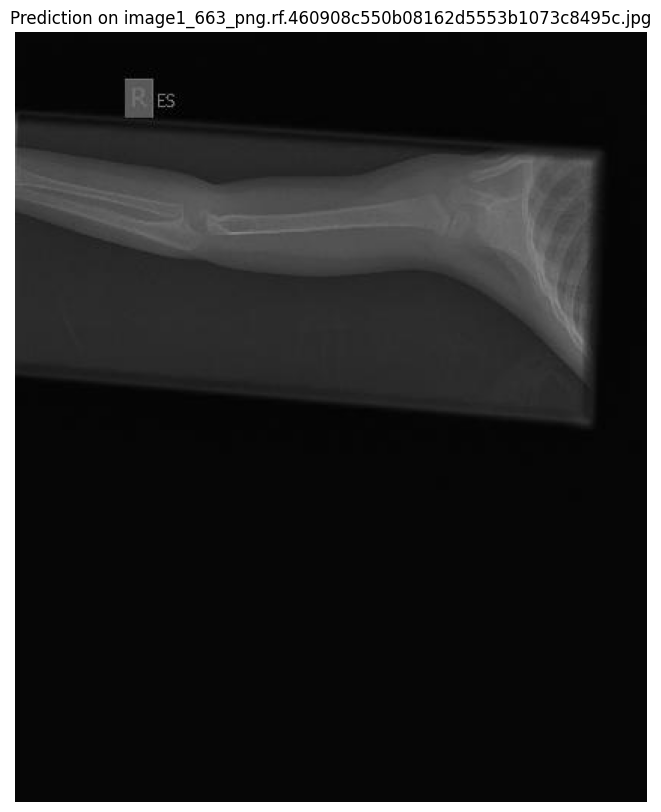


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3073_png.rf.241285b7d595353800440e6d2b9b91f0.jpg: 224x160 (no detections), 49.5ms
Speed: 0.8ms preprocess, 49.5ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 160)


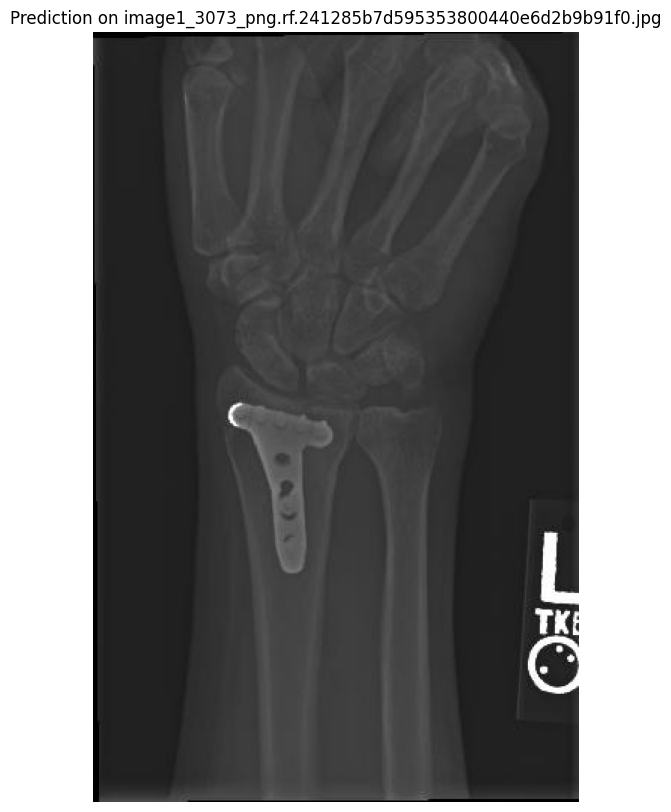


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3739_png.rf.378cc67dc76f5d423a65e397d699fa37.jpg: 224x64 (no detections), 49.8ms
Speed: 0.8ms preprocess, 49.8ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 64)


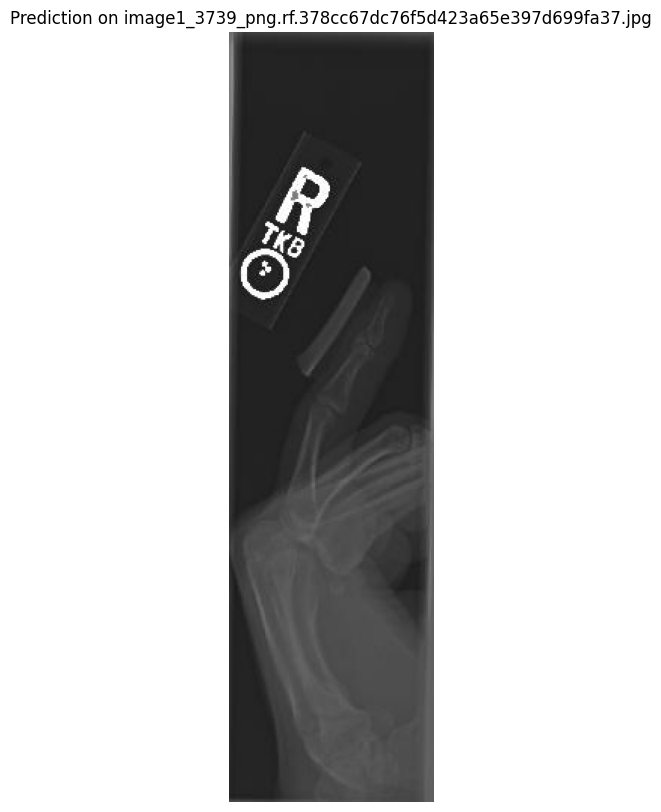


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_448_png.rf.70f487675effb06da9c6c334b5fe29cc.jpg: 224x192 (no detections), 11.5ms
Speed: 1.0ms preprocess, 11.5ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


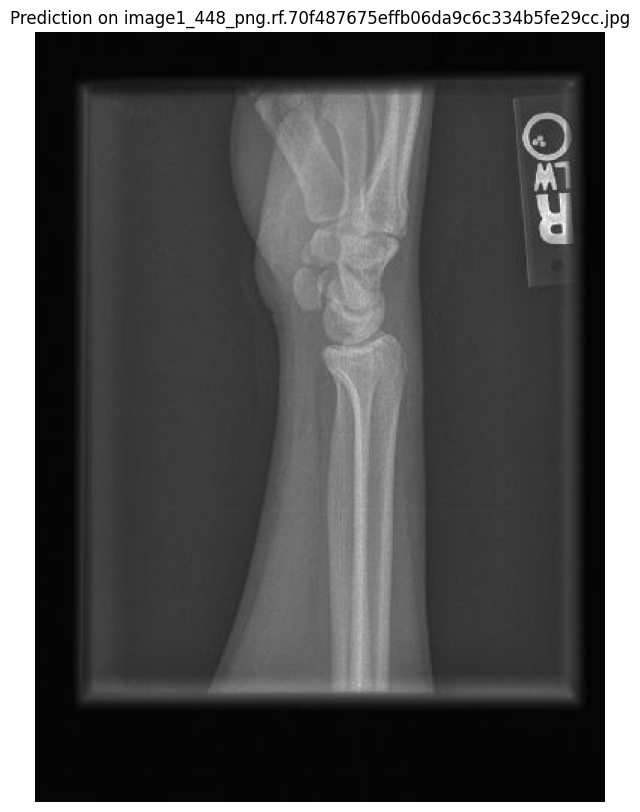


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_673_png.rf.fbe0dea2deaf75d49f079ca7d33abe14.jpg: 224x160 (no detections), 11.3ms
Speed: 0.9ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 160)


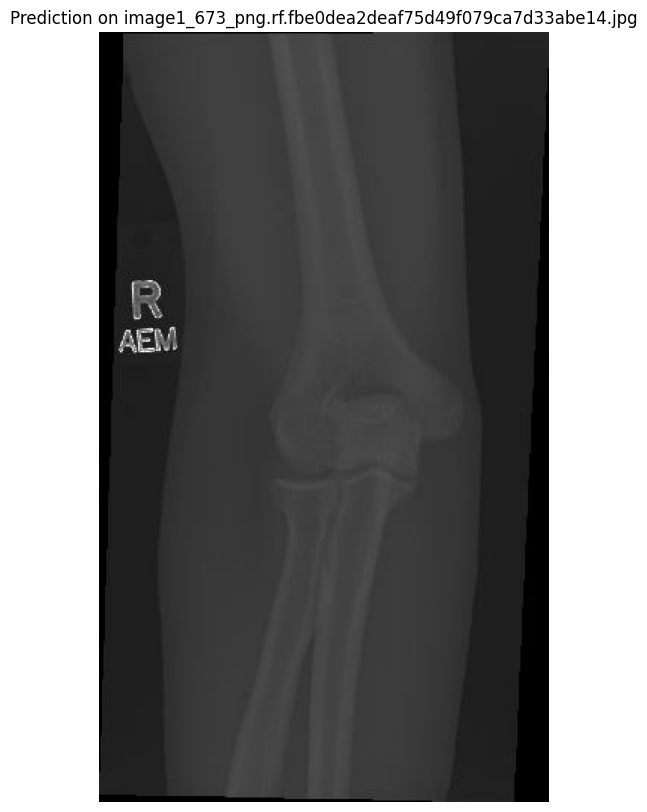


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3054_png.rf.4be16ac99458914b4a34d0892e5f7ff0.jpg: 224x192 (no detections), 11.7ms
Speed: 1.1ms preprocess, 11.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


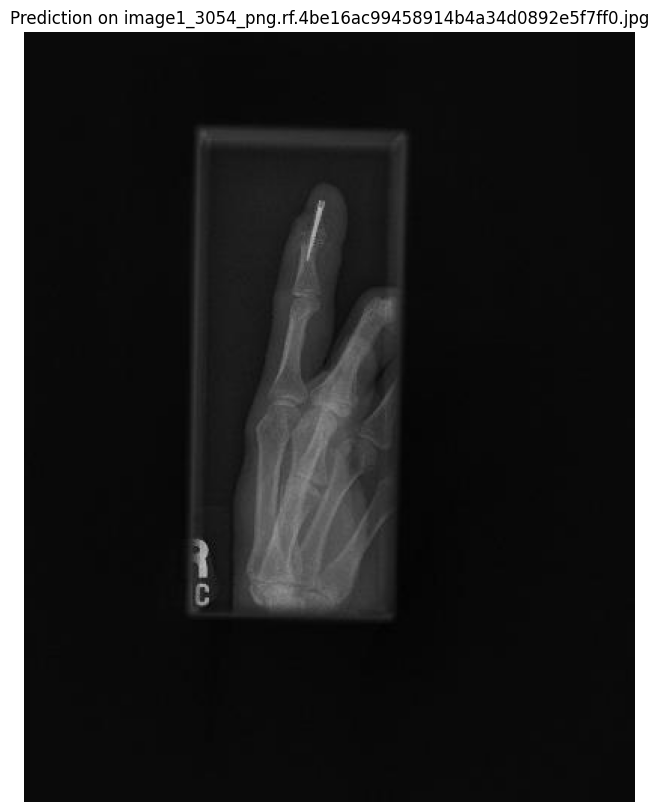


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_137_png.rf.996f3c880689913494b8c7baae7a6f0d.jpg: 224x224 (no detections), 12.8ms
Speed: 1.3ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


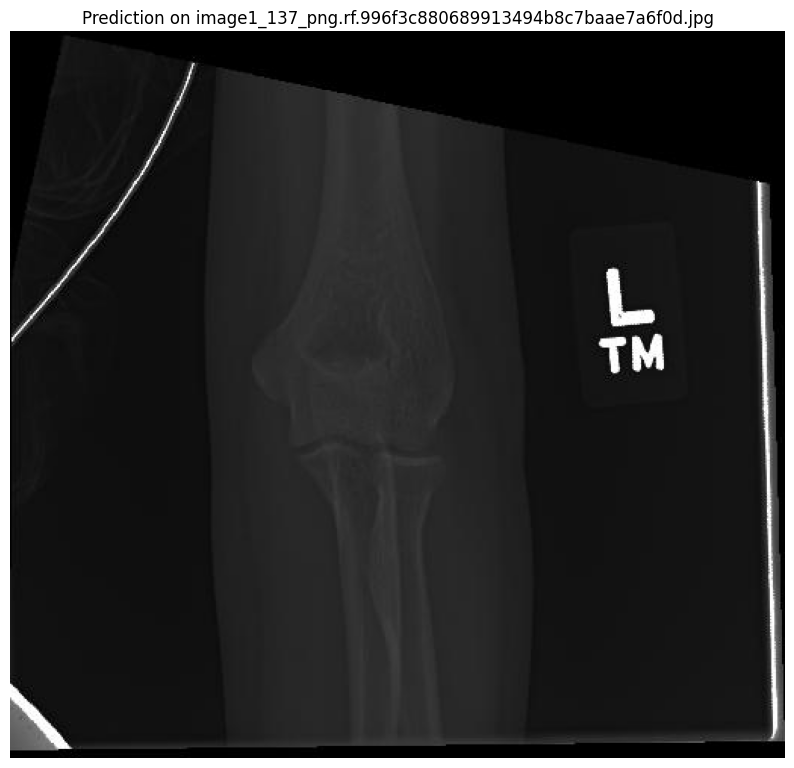


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_375_png.rf.309ea11b65edee9329ae91a338bcefe9.jpg: 224x96 (no detections), 51.3ms
Speed: 1.0ms preprocess, 51.3ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 96)


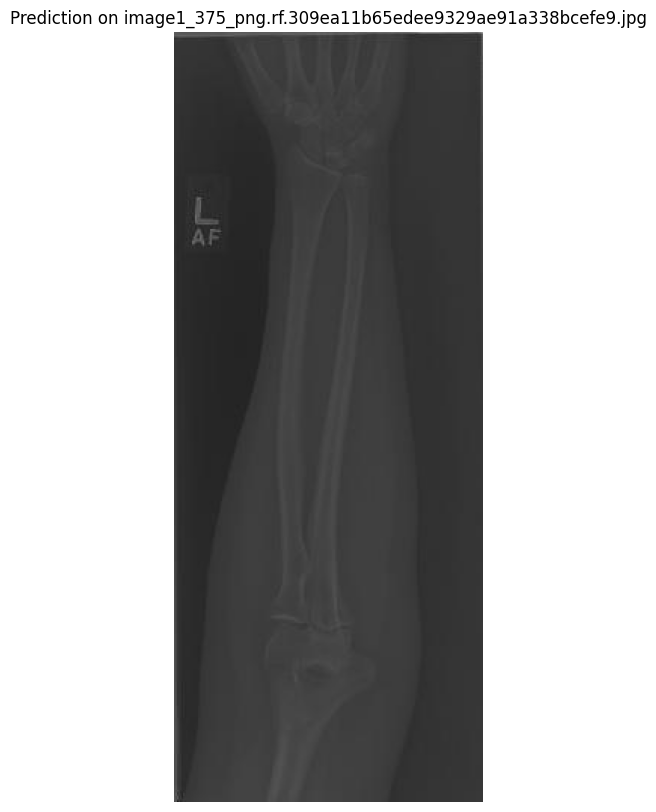


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_1540_png.rf.46ec2cd9f9775a6e815e5062658d9fb0.jpg: 224x192 (no detections), 11.0ms
Speed: 1.5ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


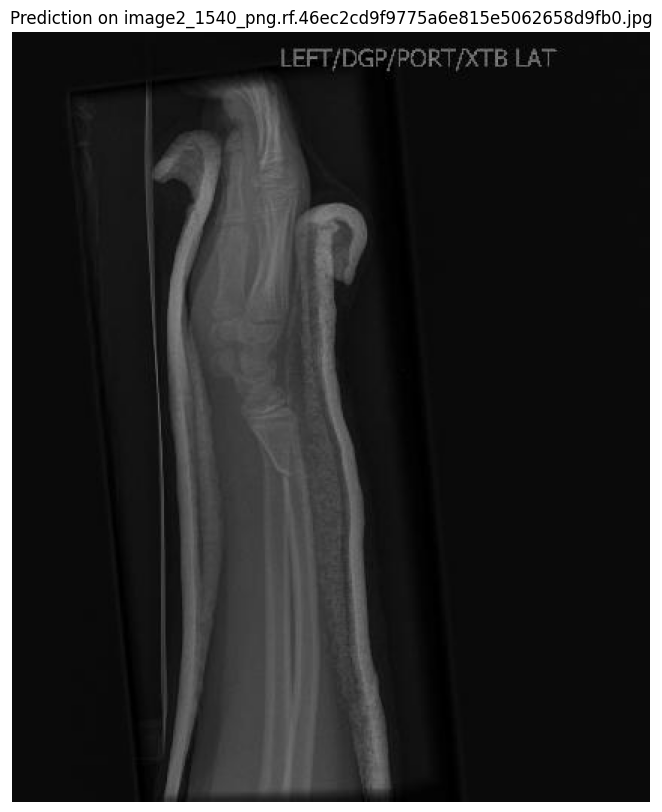


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_68_png.rf.9e3dfa26e497af0a8f676a9686fd0e20.jpg: 224x192 (no detections), 15.5ms
Speed: 1.2ms preprocess, 15.5ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


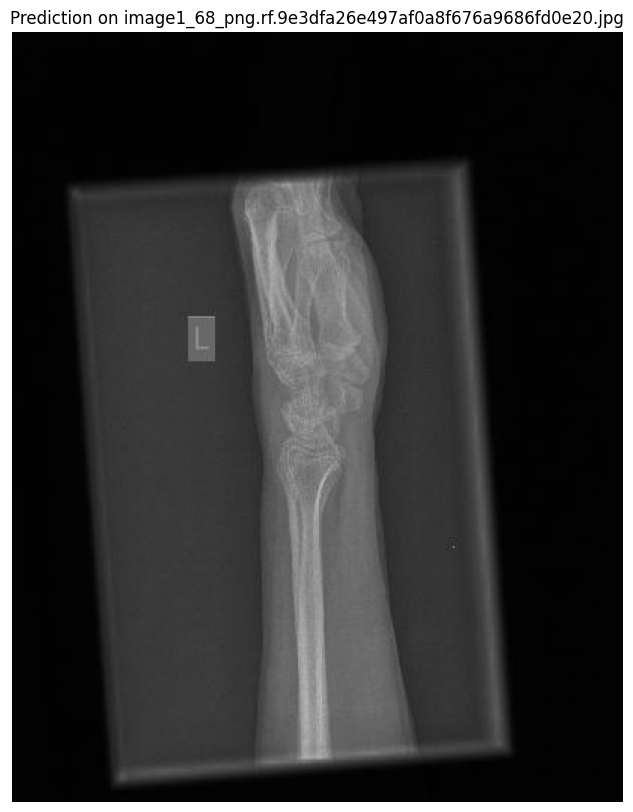


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3565_png.rf.52153ba946f07810b3c16f62d202db16.jpg: 160x224 (no detections), 52.2ms
Speed: 0.9ms preprocess, 52.2ms inference, 0.6ms postprocess per image at shape (1, 3, 160, 224)


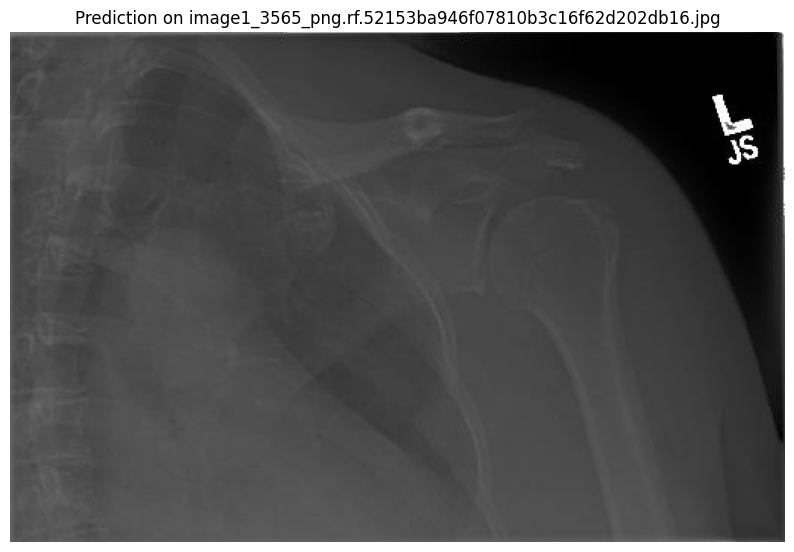


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4300_png.rf.d4626ae6c3183d2419faae148cd72283.jpg: 224x160 (no detections), 11.0ms
Speed: 1.2ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 160)


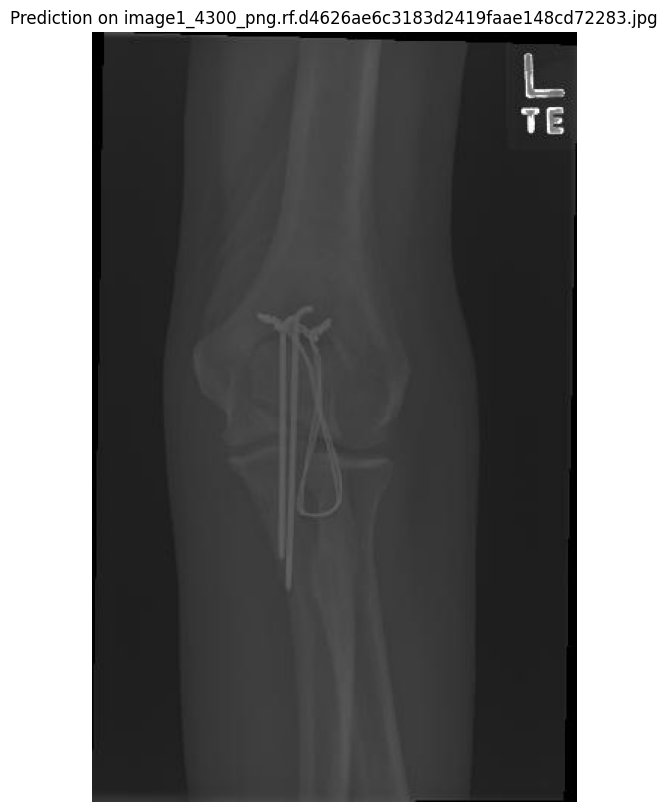


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_496_png.rf.be69c35487b2531b272b242febfdebb1.jpg: 224x224 (no detections), 10.9ms
Speed: 1.3ms preprocess, 10.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


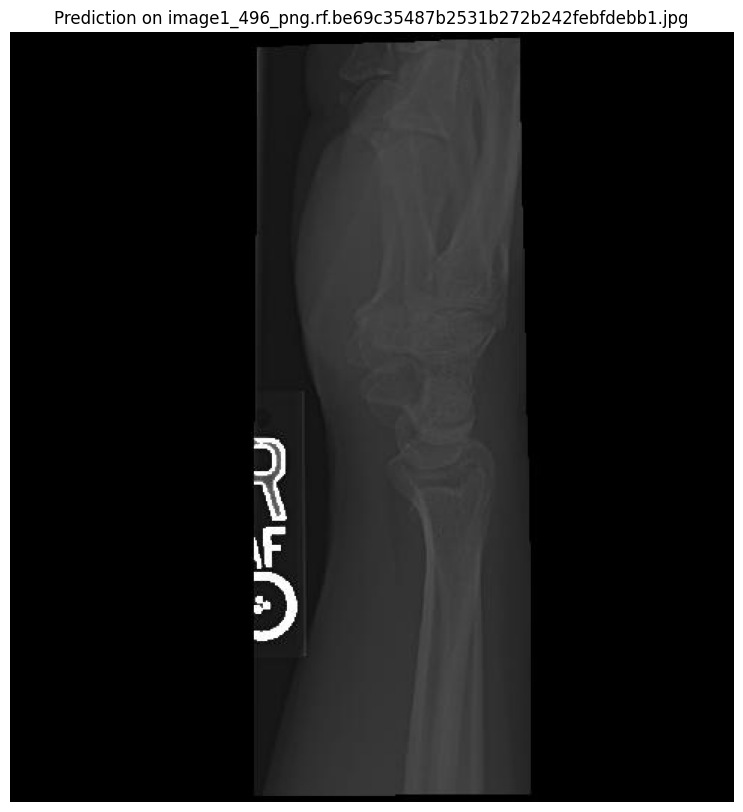


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_450_png.rf.c1640af9f113b3690185c7b22e1d76ec.jpg: 224x192 (no detections), 10.6ms
Speed: 1.3ms preprocess, 10.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


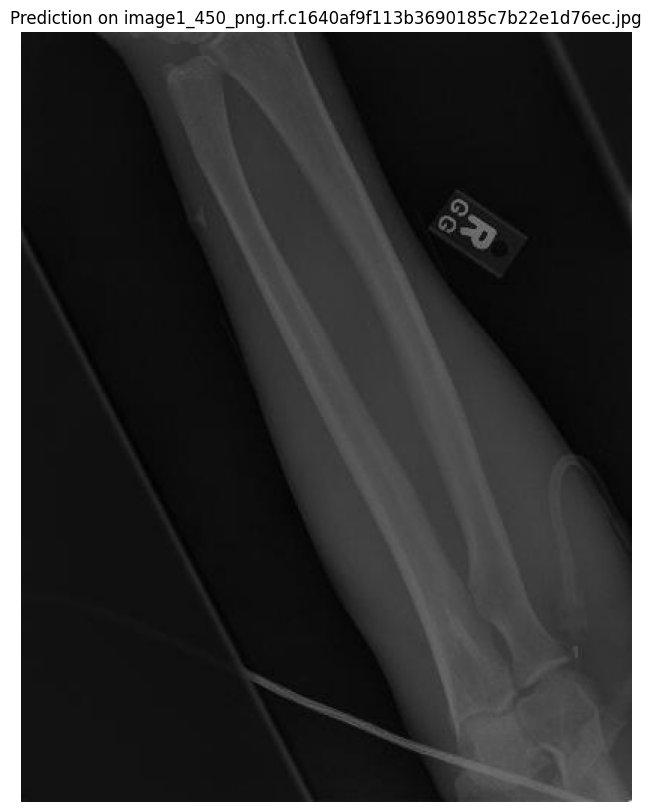


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1233_png.rf.4e2b7dc04a17f7f3a33a343e8f7ee67e.jpg: 192x224 (no detections), 51.1ms
Speed: 1.2ms preprocess, 51.1ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


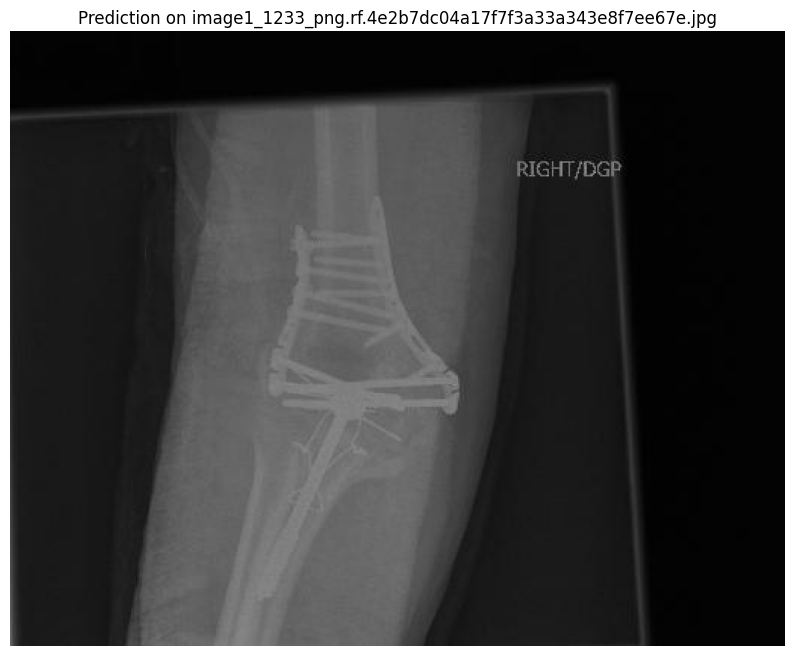


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_355_png.rf.ae0f59ff3c26334cf587c5e76cc18b67.jpg: 224x192 (no detections), 11.3ms
Speed: 1.0ms preprocess, 11.3ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


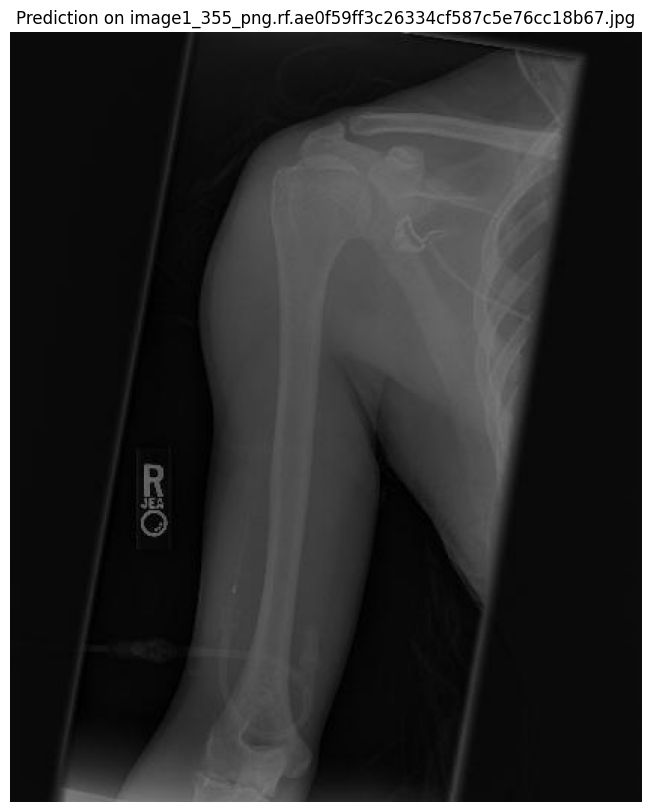


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_1421_png.rf.b623cea6c9617fcf2f09843434e25218.jpg: 160x224 1 forearm fracture, 10.3ms
Speed: 1.2ms preprocess, 10.3ms inference, 2.8ms postprocess per image at shape (1, 3, 160, 224)


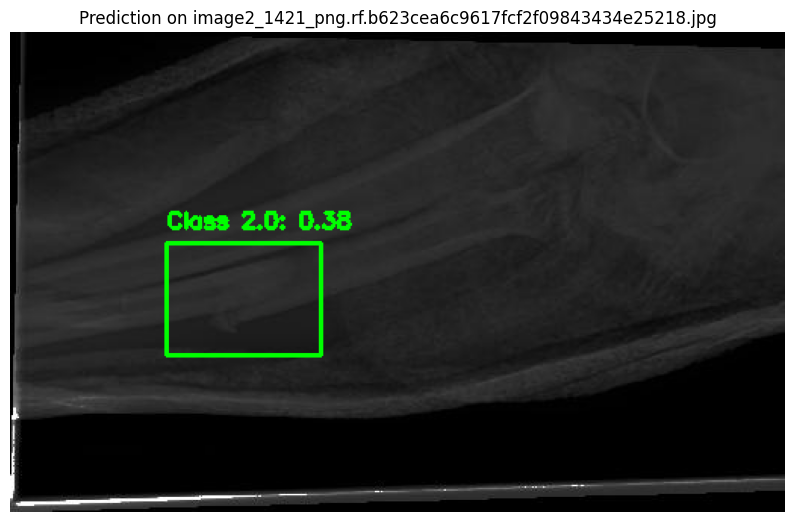


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_651_png.rf.c3391a5ae823bf5de28ed36b3f23f93a.jpg: 224x160 (no detections), 10.5ms
Speed: 1.1ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 160)


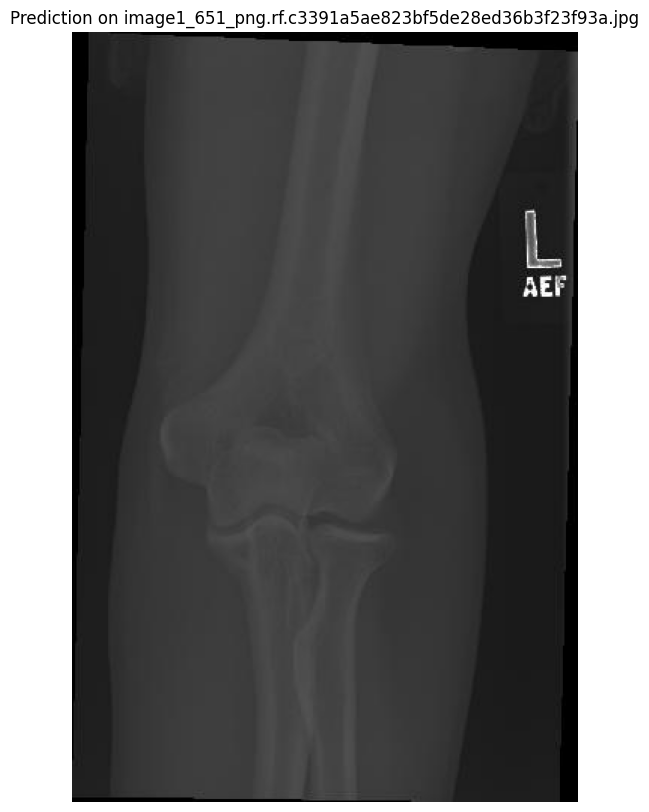


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1311_png.rf.27646e931562cc3823c79f79472b8749.jpg: 192x224 (no detections), 12.2ms
Speed: 1.0ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


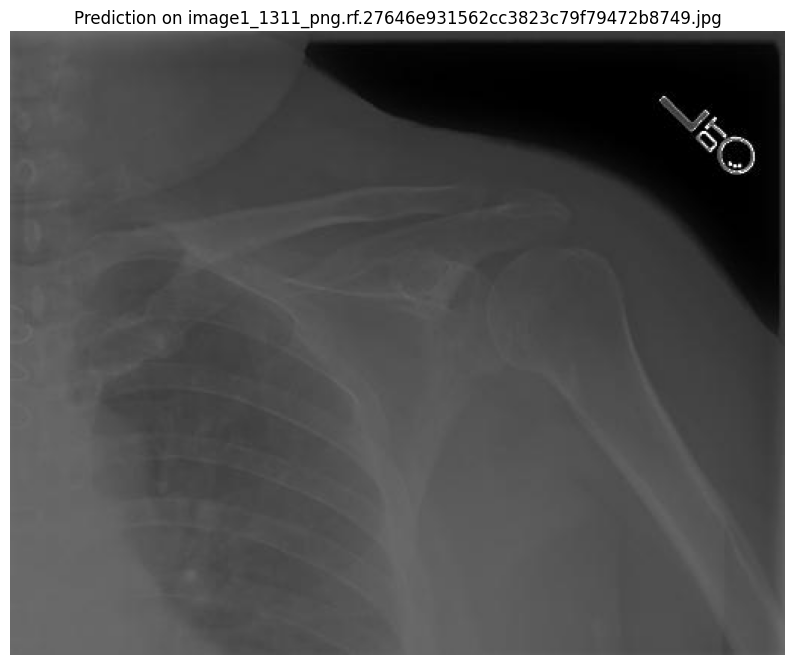


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4521_png.rf.9d460c80d2b830fc35b17c628a6d6290.jpg: 224x64 (no detections), 12.2ms
Speed: 0.7ms preprocess, 12.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 64)


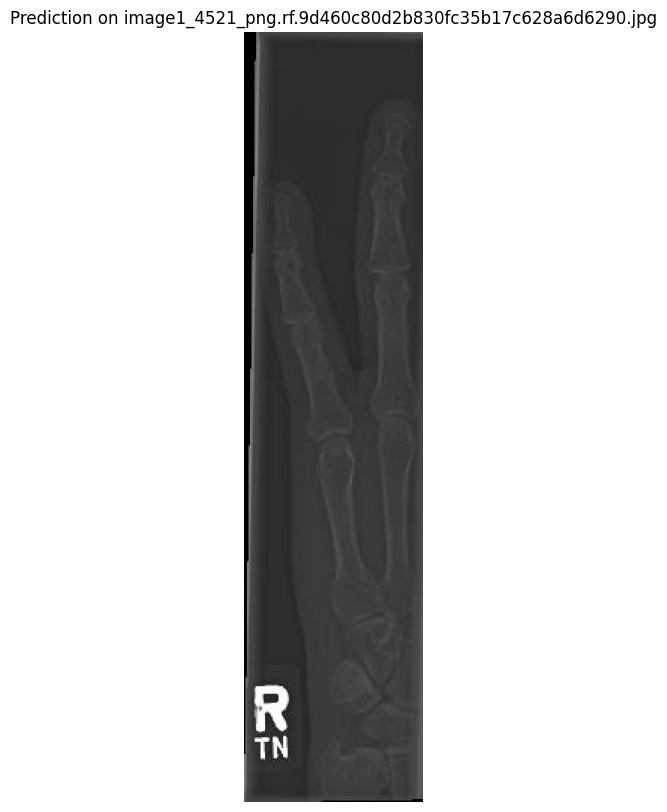


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_268_png.rf.00406f976b1bd6c978e828d2c5085683.jpg: 224x192 (no detections), 10.9ms
Speed: 1.1ms preprocess, 10.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


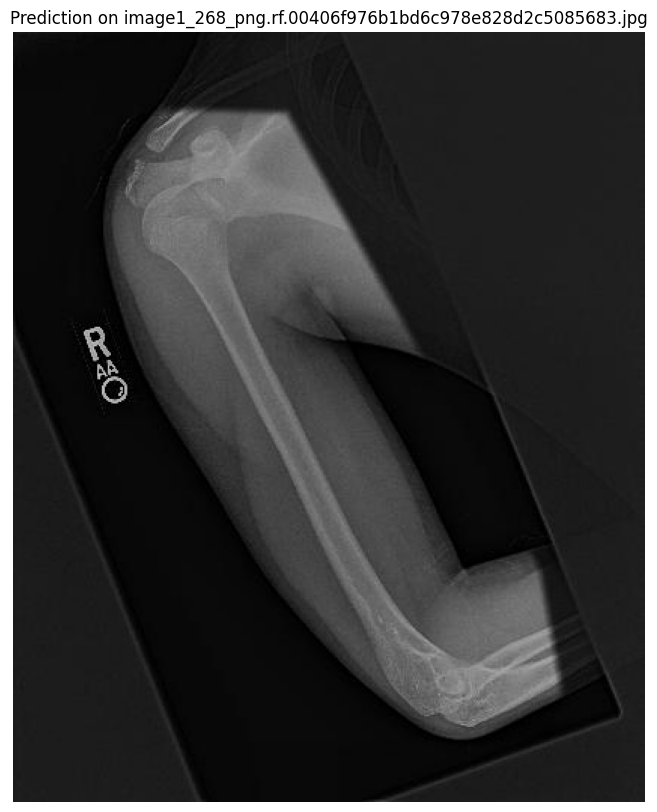


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_454_png.rf.3dd6c4b175031818178433bd945d2af9.jpg: 224x192 (no detections), 13.9ms
Speed: 2.2ms preprocess, 13.9ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 192)


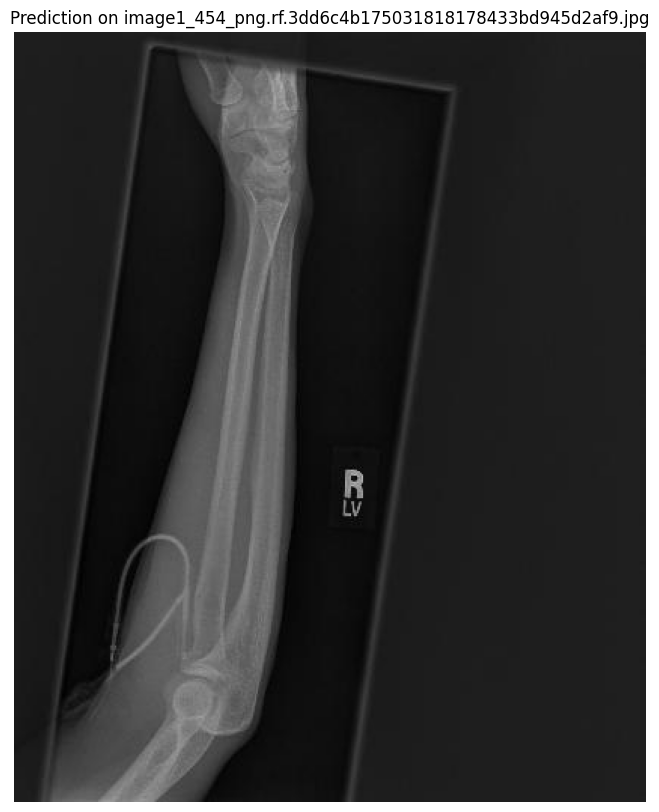


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_745_png.rf.4e5bc3fc5e483e6cc01963dd3d591550.jpg: 224x192 (no detections), 10.2ms
Speed: 1.1ms preprocess, 10.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


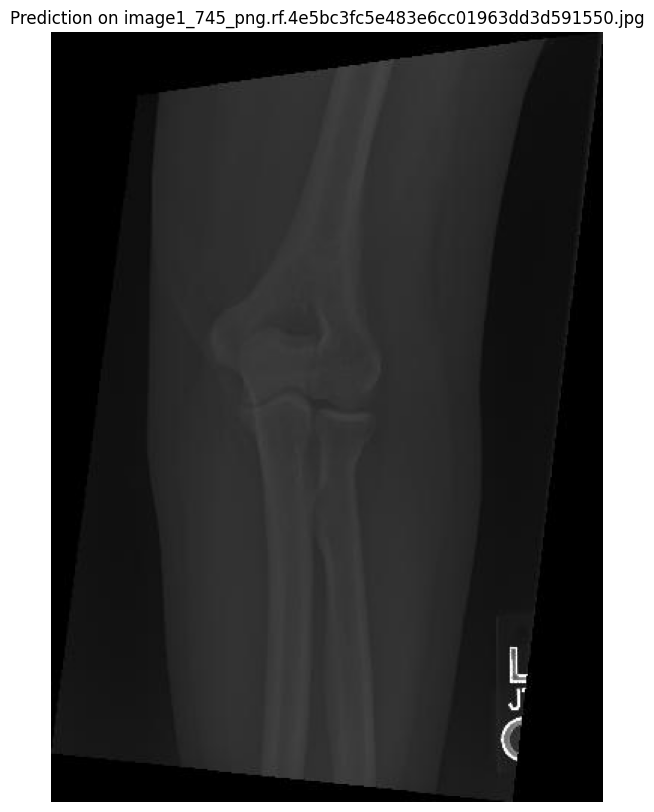


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_391_png.rf.0b615525b5dec73ed6871c657bfded04.jpg: 224x160 (no detections), 10.0ms
Speed: 1.1ms preprocess, 10.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 160)


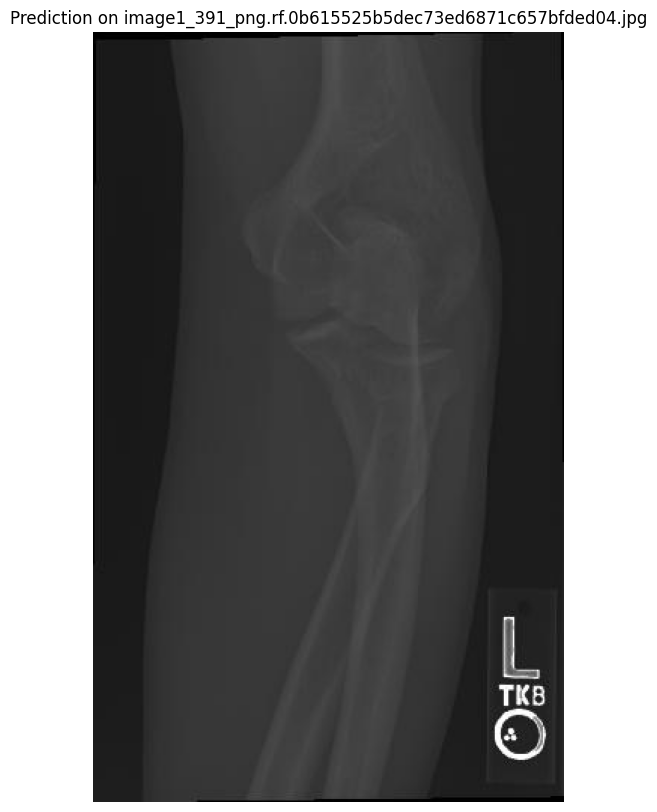


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_437_png.rf.fc6edfb87d799f751a64d540952739cc.jpg: 224x128 (no detections), 50.5ms
Speed: 0.8ms preprocess, 50.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 128)


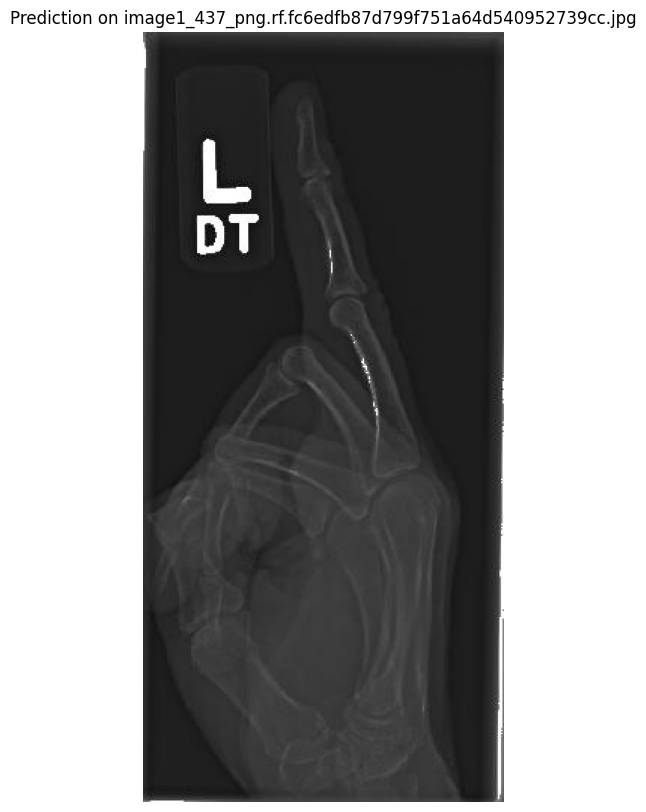


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_1718_png.rf.3320525501293fd17921dbca2ec70ebf.jpg: 192x224 1 forearm fracture, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 1.7ms postprocess per image at shape (1, 3, 192, 224)


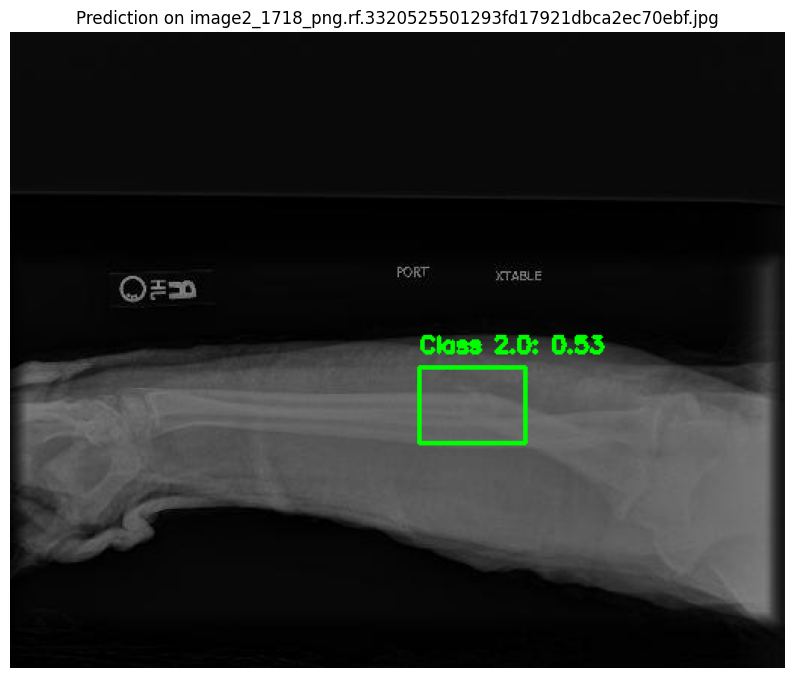


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4007_png.rf.5c5b46eb5afec1aecfd8ec0119476889.jpg: 224x64 (no detections), 13.0ms
Speed: 0.7ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 64)


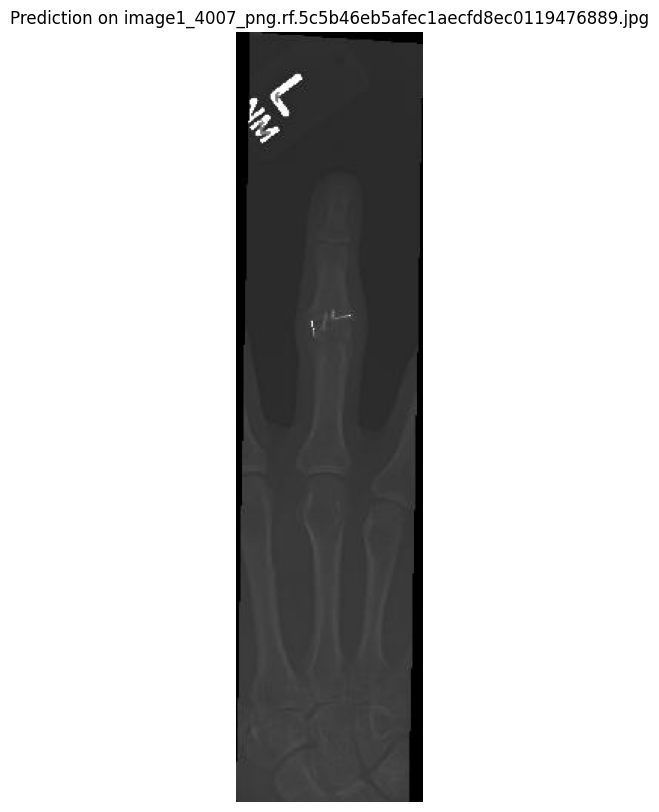


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1137_png.rf.fd851f5a4b2be36de41c54ec6a53c989.jpg: 192x224 (no detections), 14.6ms
Speed: 1.1ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


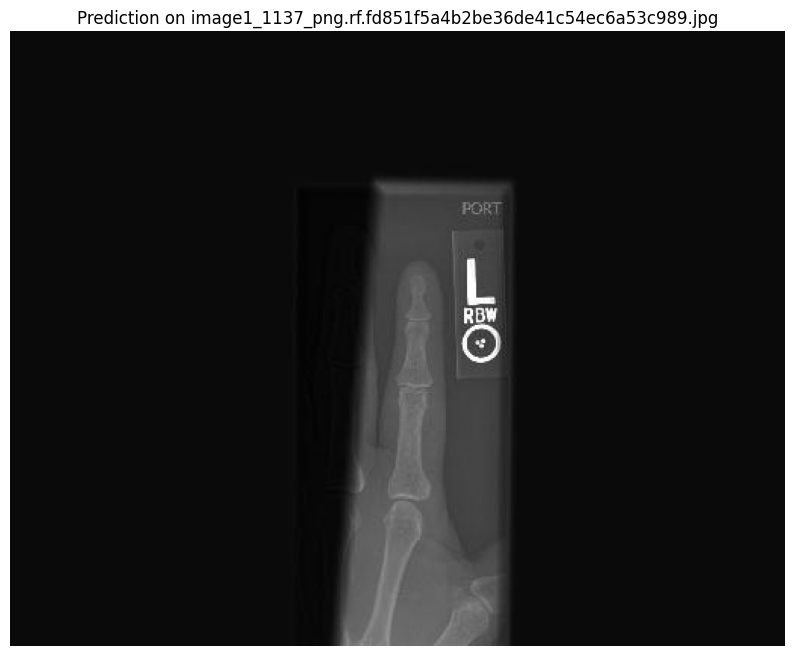


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1033_png.rf.4bbf6560a26646b1d3a1ab600aa19251.jpg: 192x224 (no detections), 11.6ms
Speed: 1.0ms preprocess, 11.6ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


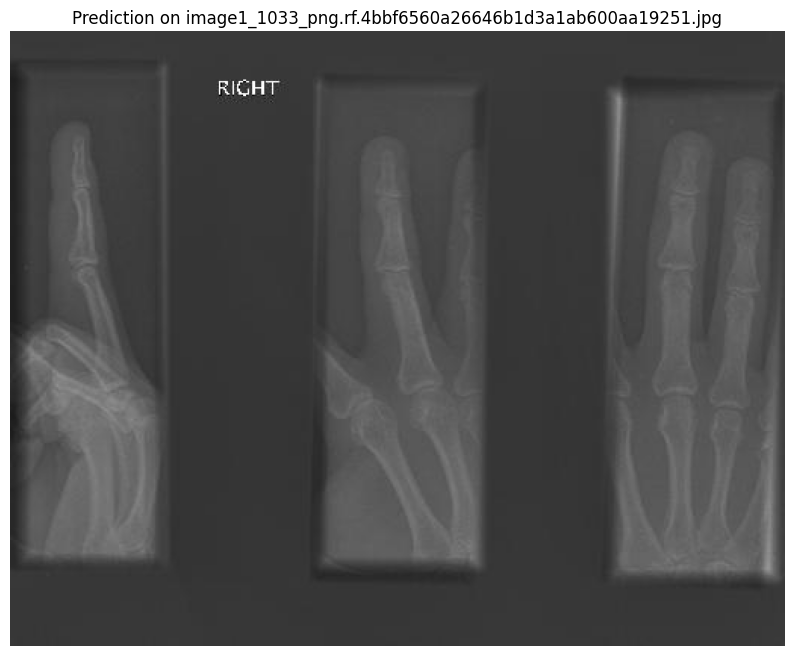


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_240_png.rf.c8b0cfb57aef2e4bc78d5a716909fd94.jpg: 224x192 (no detections), 10.7ms
Speed: 1.3ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


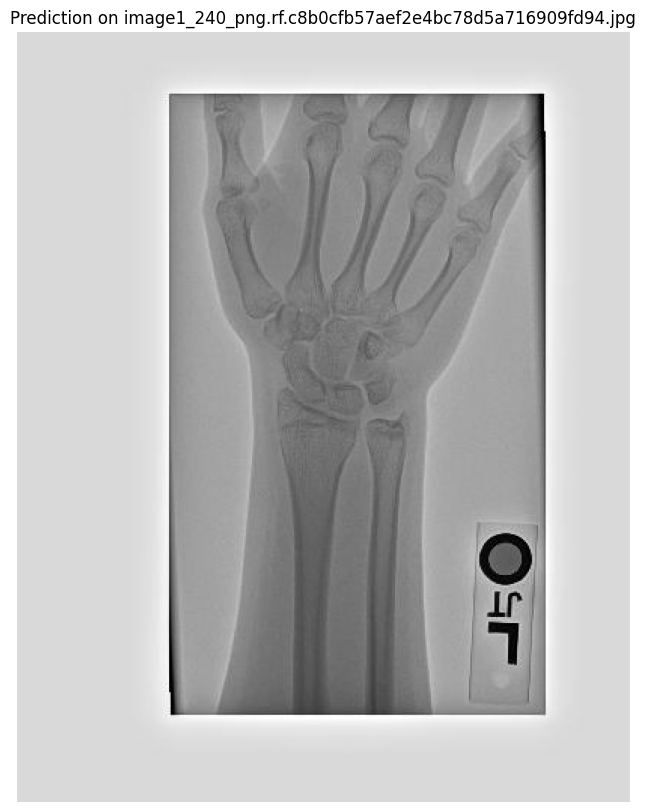


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1392_png.rf.692d8594c2ce39483af8c3c4fee91646.jpg: 224x96 (no detections), 19.2ms
Speed: 0.7ms preprocess, 19.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


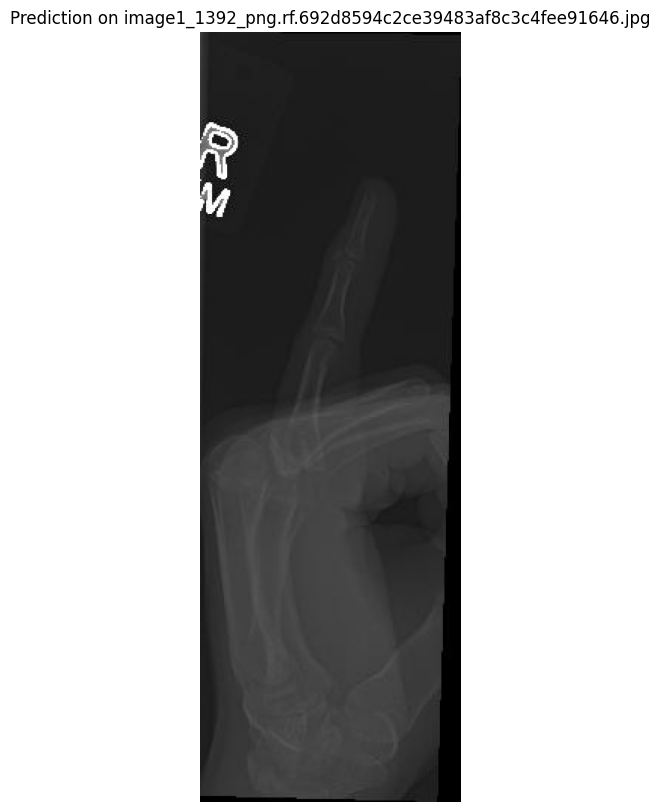


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_23_png.rf.da8bbef32848f32a8d5434e328b10428.jpg: 192x224 (no detections), 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


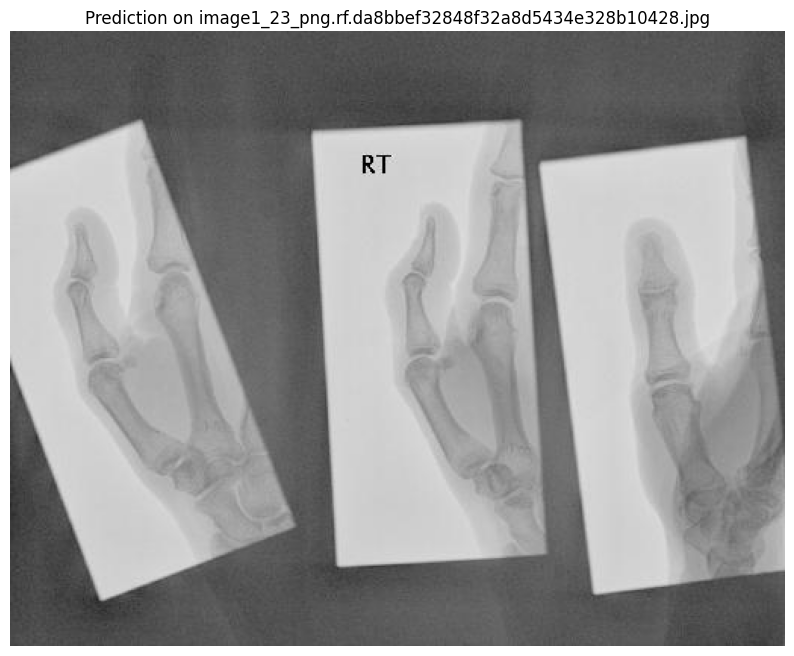


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_388_png.rf.b1fe6ed17e0c06f51058539841f1a51c.jpg: 224x192 (no detections), 17.6ms
Speed: 1.0ms preprocess, 17.6ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


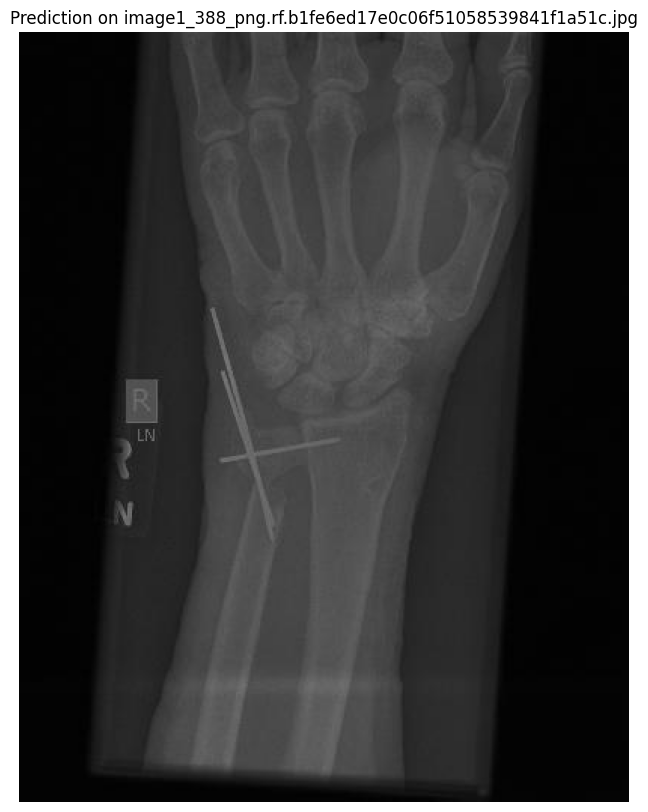


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_154_png.rf.bf5cc83ea60cb0fd21d1f21ab7055f9d.jpg: 224x192 (no detections), 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


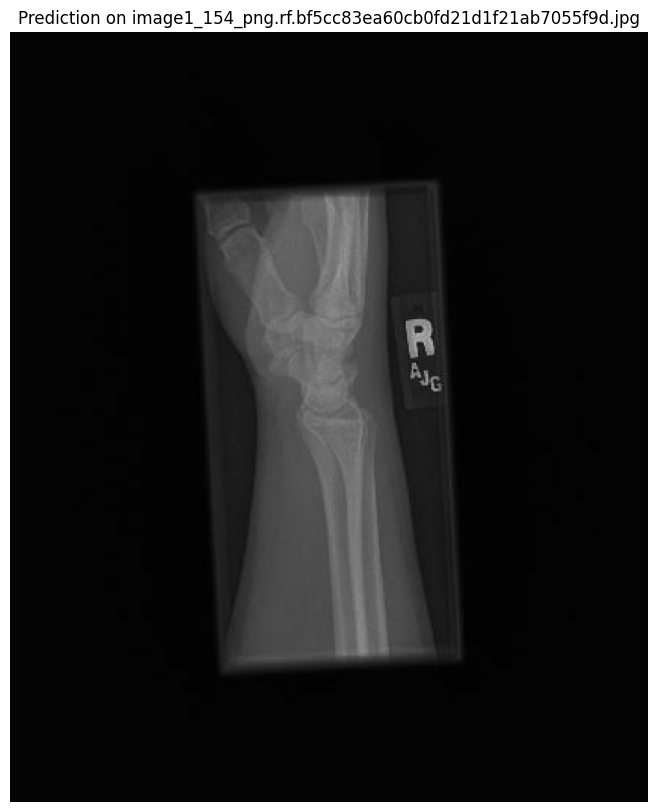


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_52_png.rf.b194877235d291ca9e2e8824392bf776.jpg: 224x192 1 humerus, 13.0ms
Speed: 1.4ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 192)


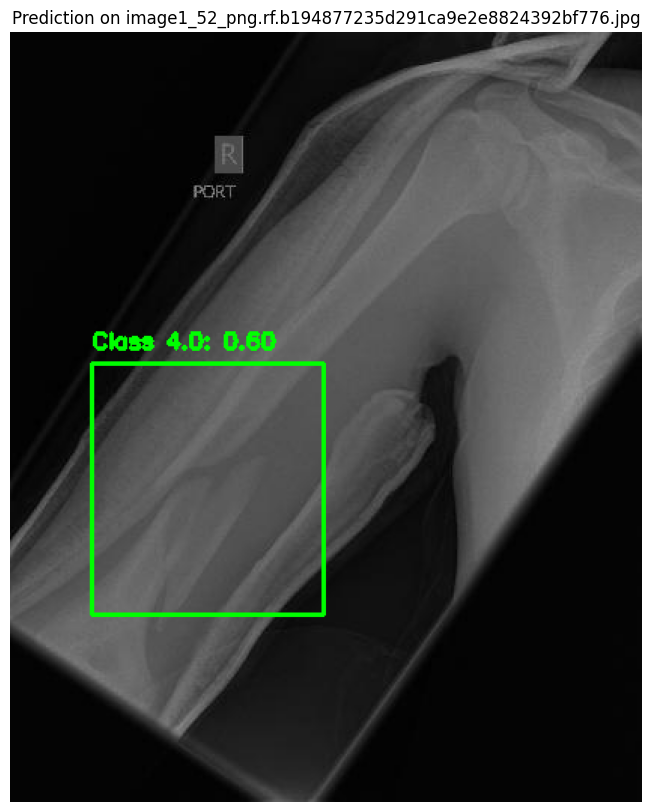


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_540_png.rf.0e3e26d67bb471fb263c983cdf758c46.jpg: 192x224 (no detections), 15.4ms
Speed: 1.0ms preprocess, 15.4ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


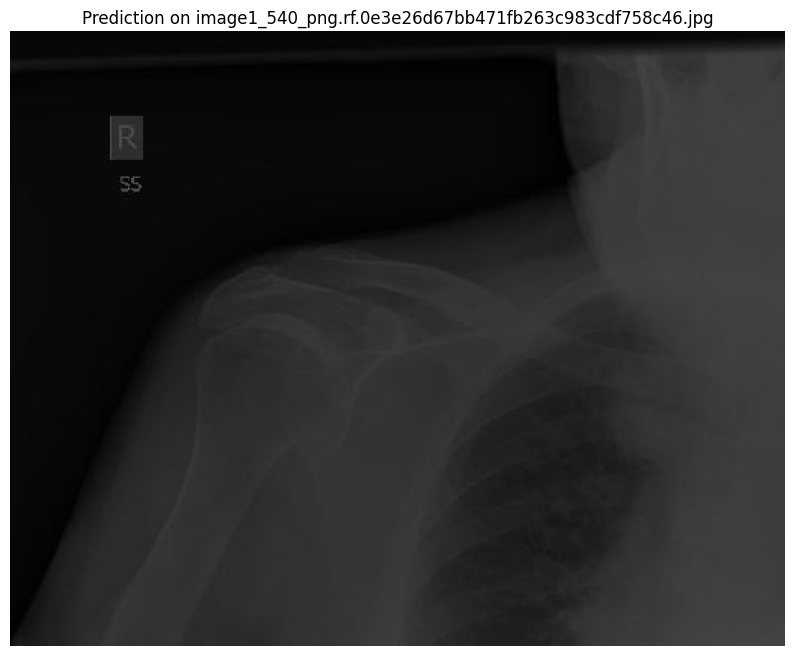


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_186_png.rf.e7ef27f31171ef062f867a9043ecb879.jpg: 224x128 1 fingers positive, 16.7ms
Speed: 0.8ms preprocess, 16.7ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 128)


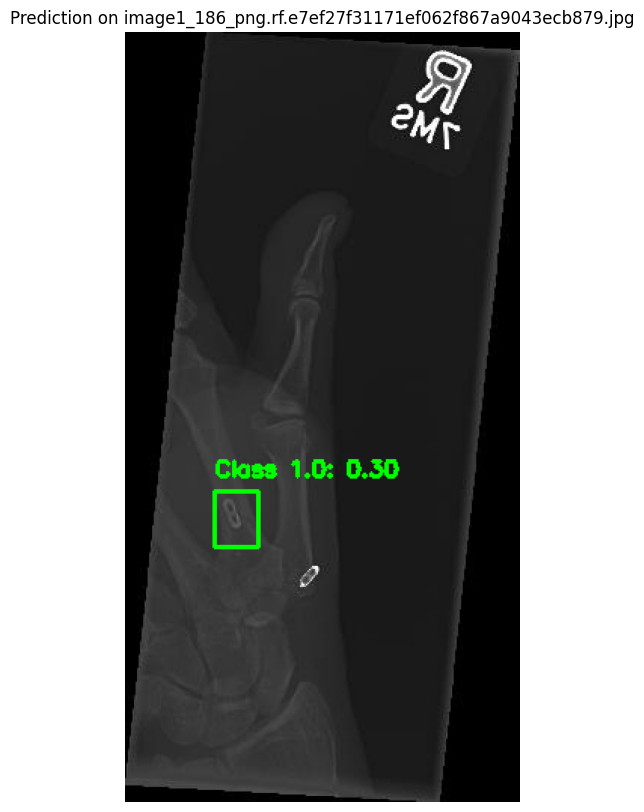


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4966_png.rf.27ae131adff1063f606ceecb0fddc7c2.jpg: 224x192 1 shoulder fracture, 15.5ms
Speed: 1.1ms preprocess, 15.5ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


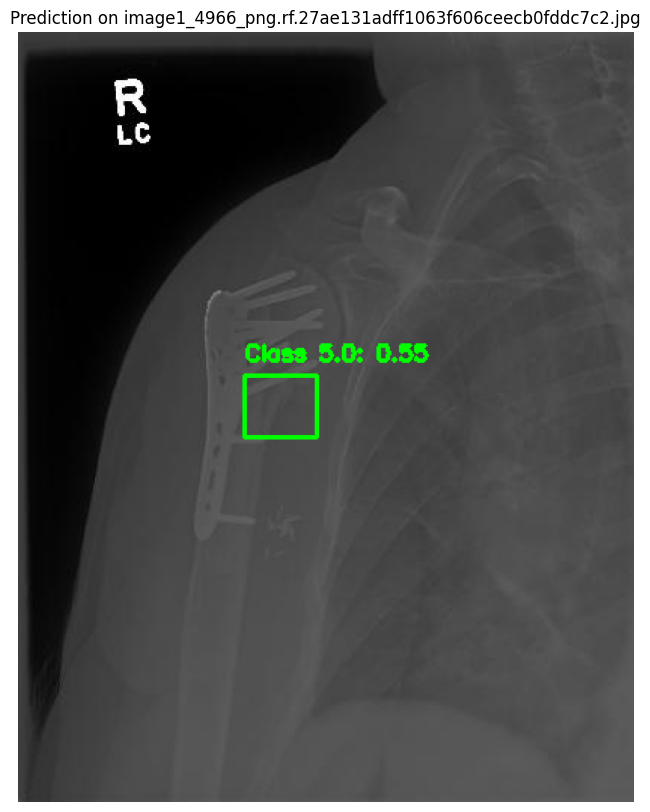


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_2694_png.rf.6390e595cb681c436da1dfa7b2c78dfd.jpg: 224x192 1 wrist positive, 14.7ms
Speed: 1.0ms preprocess, 14.7ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


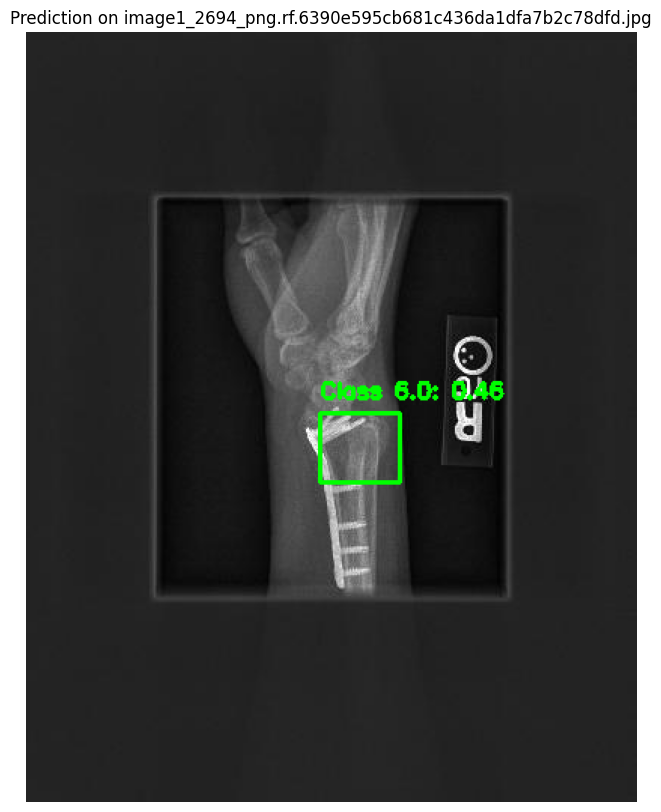


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_2263_png.rf.43688af1368a72ad0bc6719a5dcab20b.jpg: 224x224 (no detections), 11.3ms
Speed: 1.1ms preprocess, 11.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 224)


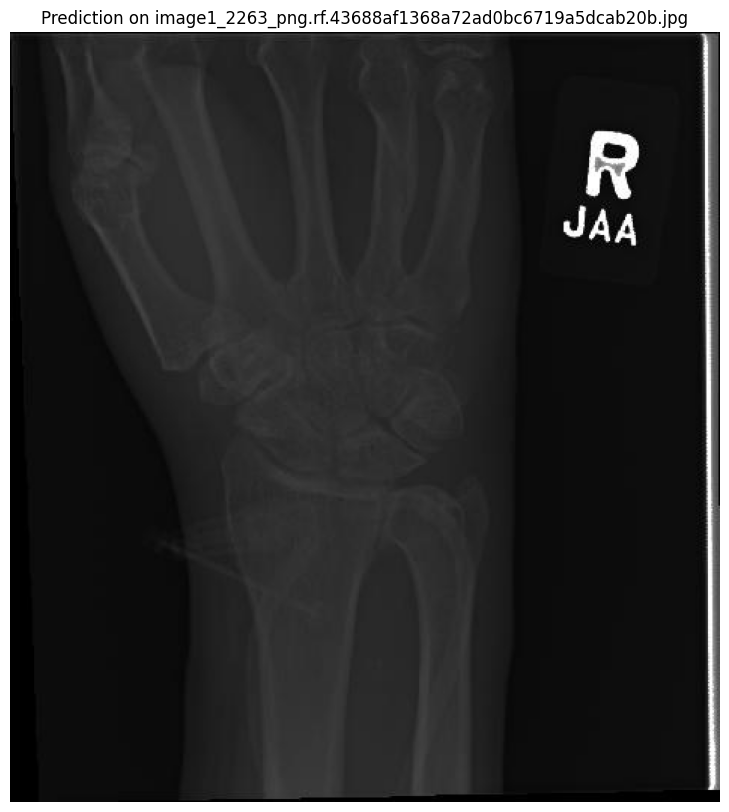


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_212_png.rf.2ffb29b8c57630c49b7ee34bce2c46f3.jpg: 224x224 (no detections), 12.5ms
Speed: 1.1ms preprocess, 12.5ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


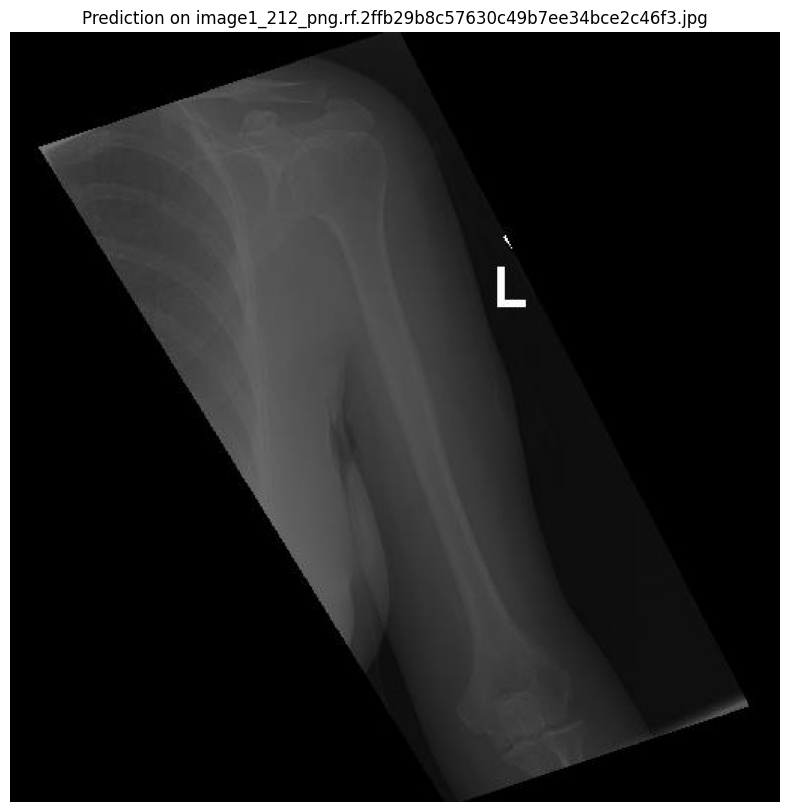


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_164_png.rf.ed315410a29883c298454af69f3ae895.jpg: 192x224 (no detections), 11.4ms
Speed: 1.0ms preprocess, 11.4ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


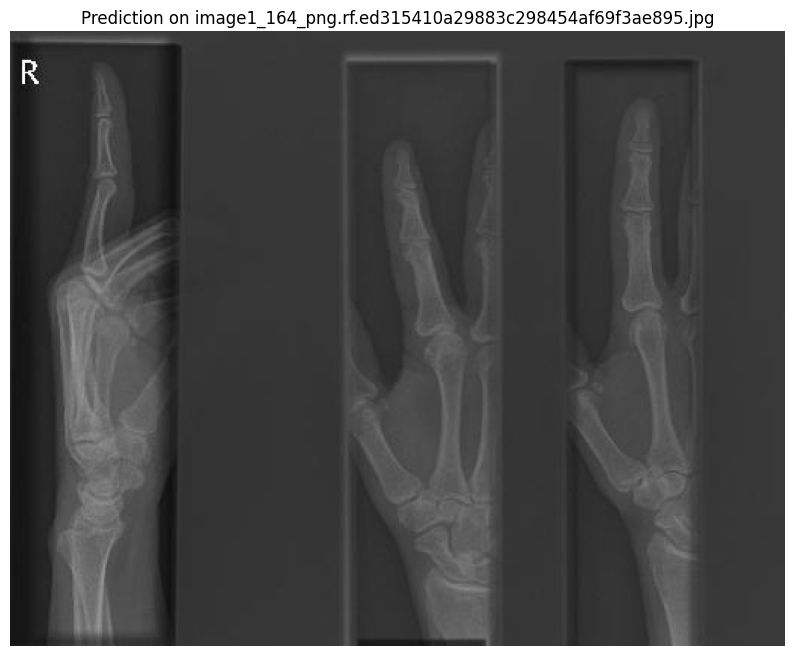


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_641_png.rf.ca0bfddb8b5ac5e97fa841e32c94ad9a.jpg: 160x224 (no detections), 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 160, 224)


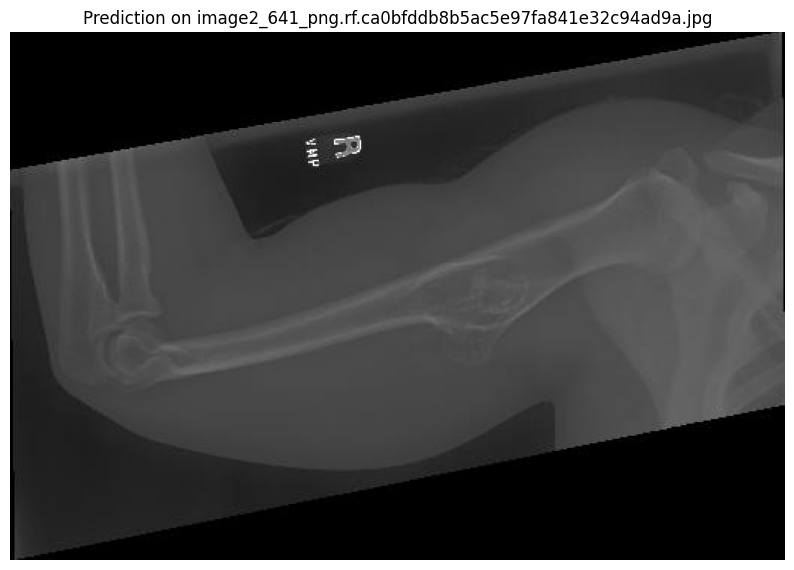


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/distal-humerus-fracture-1_jpg.rf.831cb137cfcbde1079f86abd5f5f2867.jpg: 224x96 (no detections), 10.8ms
Speed: 0.9ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 96)


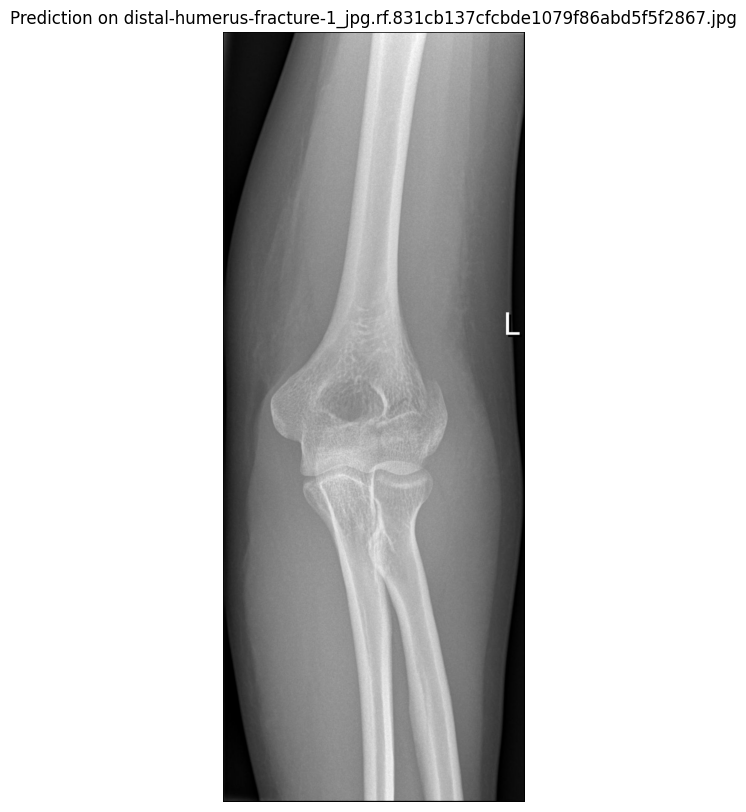


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_22_png.rf.bb53a5b5275a858894f501512908f07a.jpg: 224x128 (no detections), 16.3ms
Speed: 0.9ms preprocess, 16.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 128)


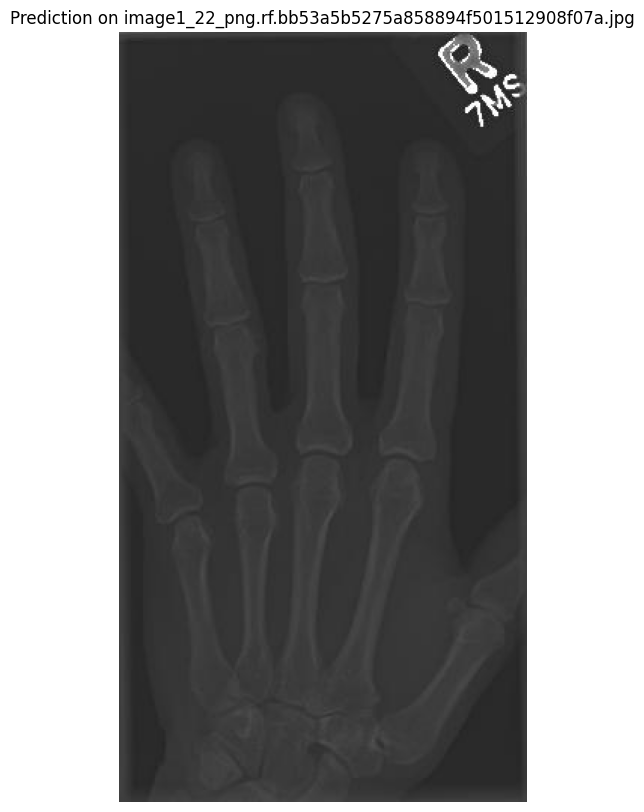


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4097_png.rf.5579812fd38a497fbfeabe584564ffaf.jpg: 224x192 1 fingers positive, 12.4ms
Speed: 1.0ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


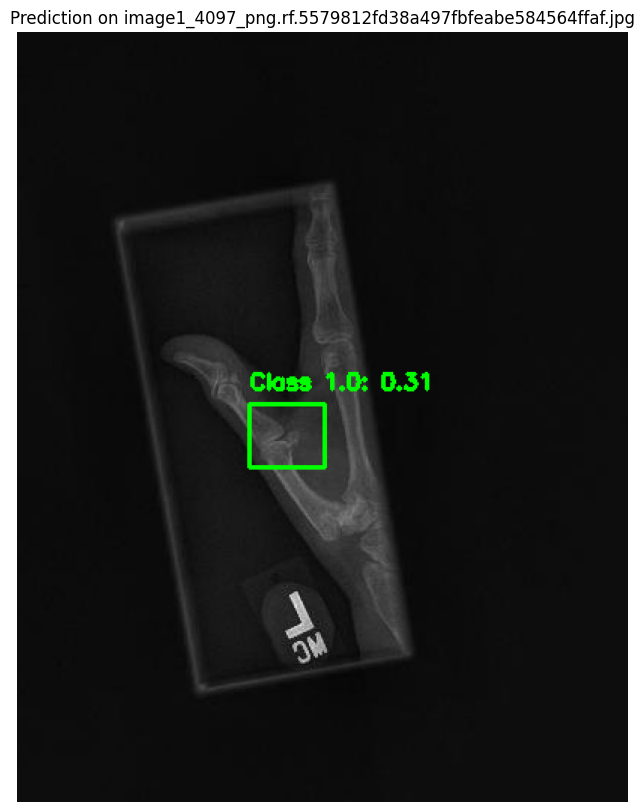


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_336_png.rf.f758673053df7ac6e05b8671c2563062.jpg: 192x224 1 shoulder fracture, 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 192, 224)


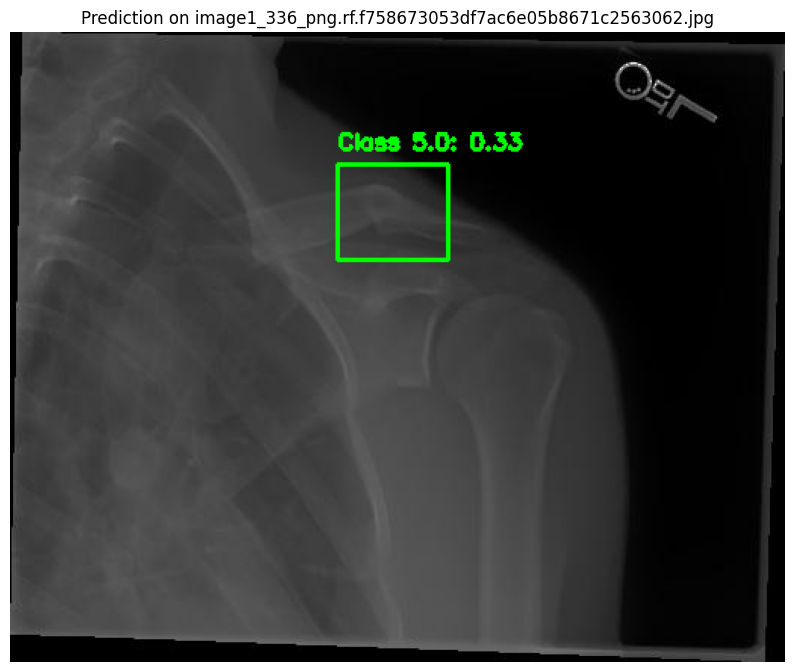


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_145_png.rf.a69d928d011a93d25a95b7b8380ea25d.jpg: 224x128 1 humerus, 11.7ms
Speed: 0.9ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 128)


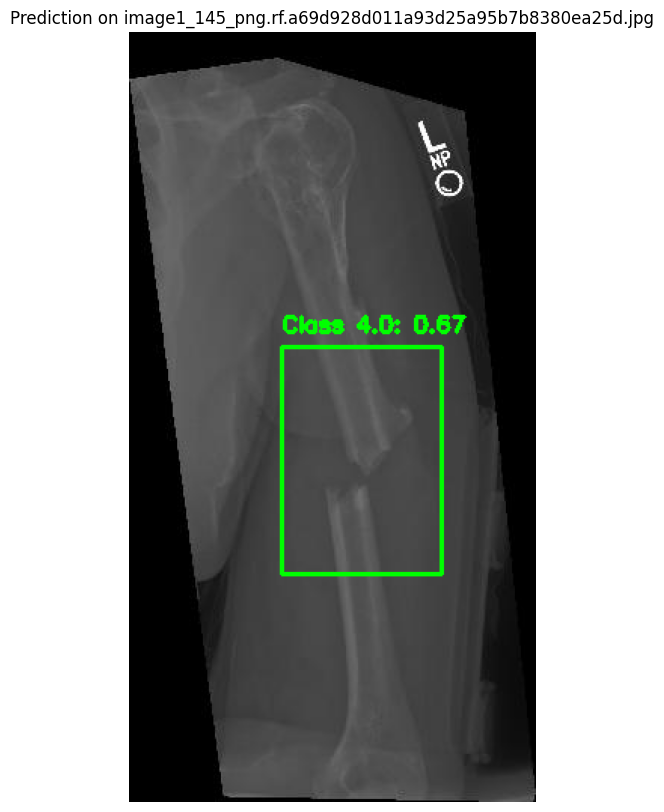


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_279_png.rf.b40ab0fc72a8fff98daa57979d24b206.jpg: 224x192 (no detections), 11.4ms
Speed: 1.1ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


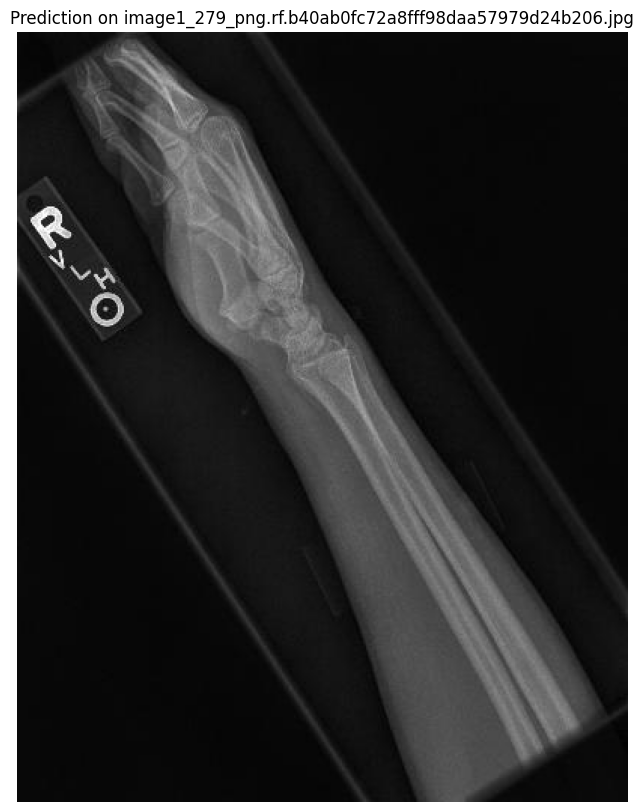


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1682_png.rf.8c3d0845adaa6d884f90b3a020573069.jpg: 224x224 (no detections), 11.3ms
Speed: 1.1ms preprocess, 11.3ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


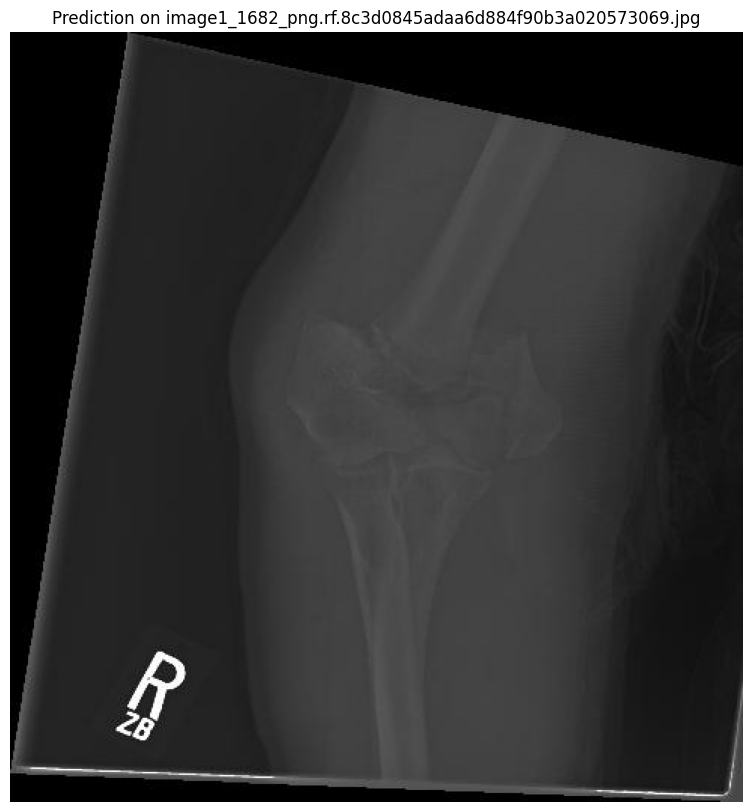


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_849_png.rf.761ec251e358a15e08cdad95fd41492a.jpg: 96x224 1 forearm fracture, 51.5ms
Speed: 3.9ms preprocess, 51.5ms inference, 2.0ms postprocess per image at shape (1, 3, 96, 224)


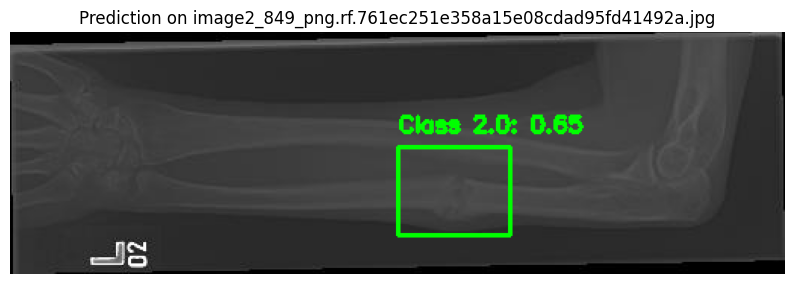


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_117_png.rf.e200e6b84f70bd27ba1e1123d052755e.jpg: 192x224 (no detections), 13.0ms
Speed: 1.0ms preprocess, 13.0ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


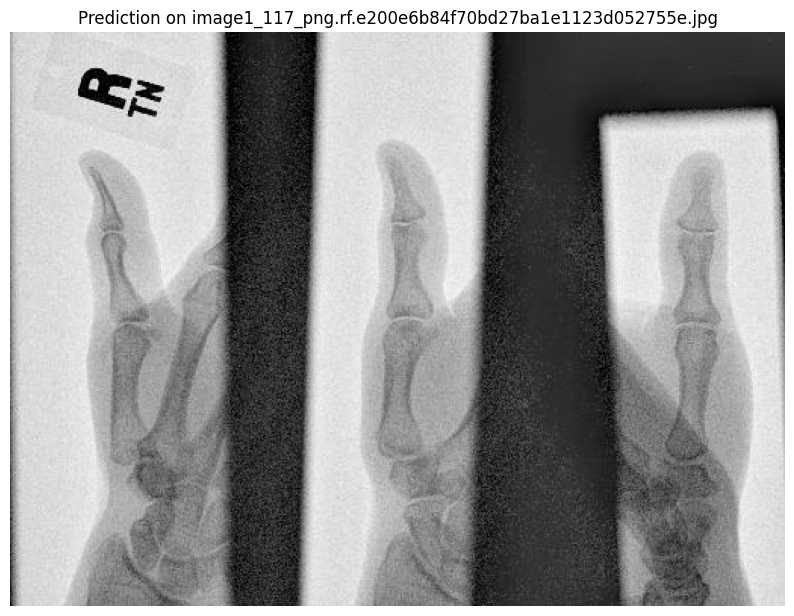


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_182_png.rf.c9539857a1608ea4850d37195ff767ce.jpg: 224x224 (no detections), 11.7ms
Speed: 1.3ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


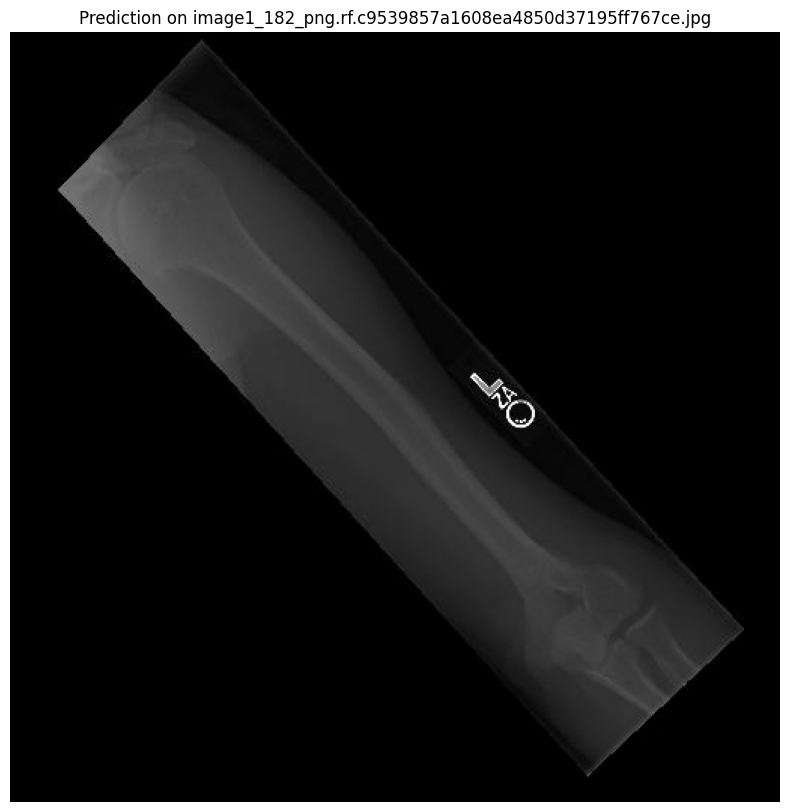


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3914_png.rf.d8e6ab2b78990092b7856255dd9726b7.jpg: 192x224 (no detections), 11.0ms
Speed: 1.1ms preprocess, 11.0ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


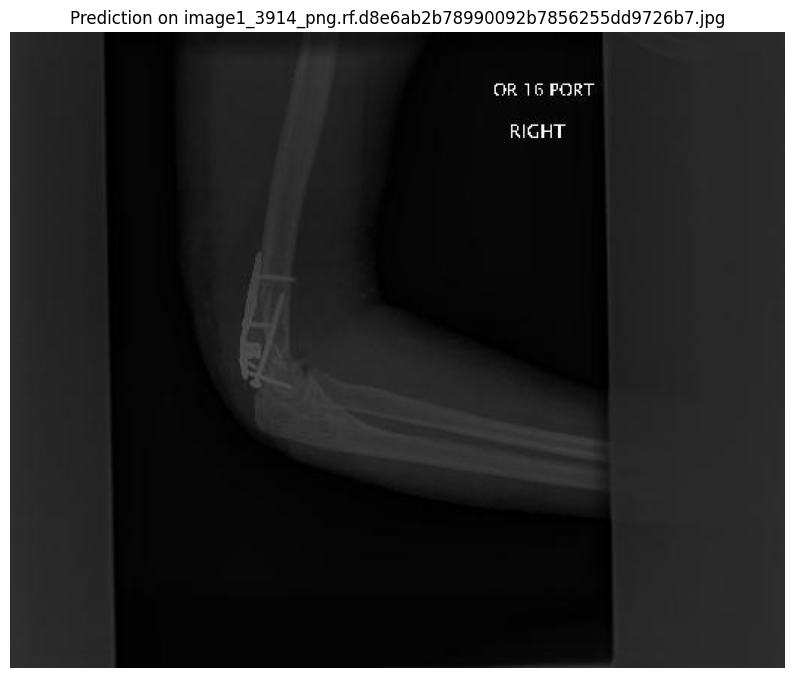


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_633_png.rf.9bd74183541bd851e79f94d3f07c50d6.jpg: 192x224 (no detections), 10.8ms
Speed: 1.0ms preprocess, 10.8ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


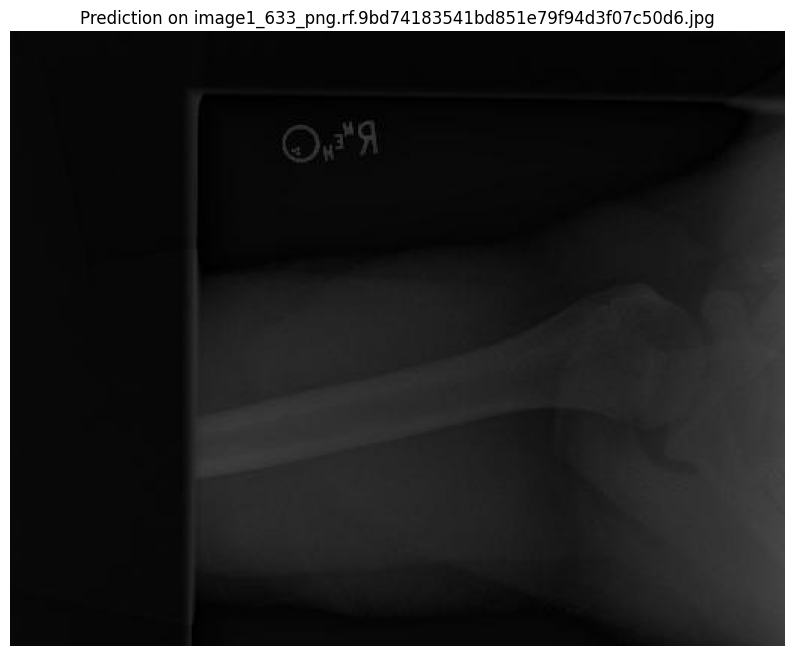


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_350_png.rf.32b20b275bdbf30afb13d8d585da2743.jpg: 224x192 (no detections), 11.4ms
Speed: 1.1ms preprocess, 11.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


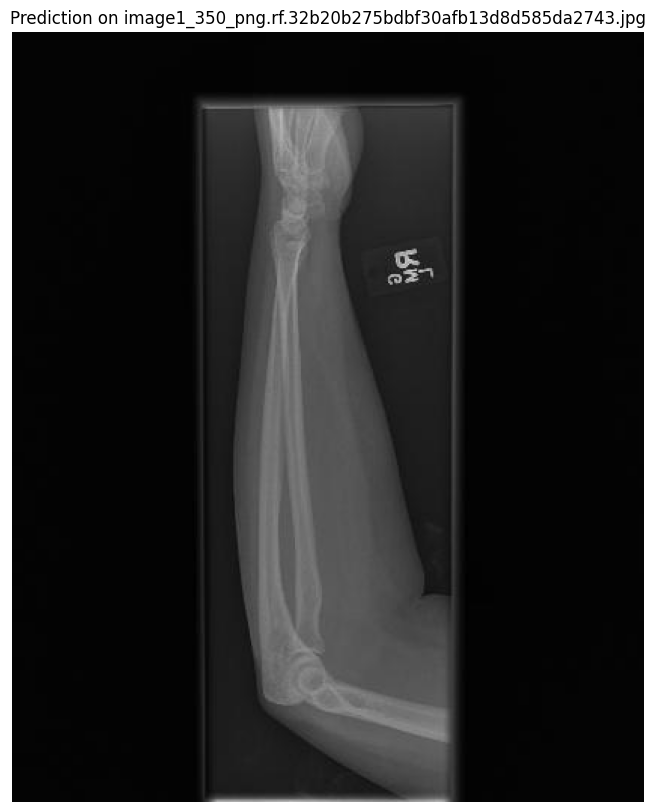


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_199_png.rf.111ecddb2bdc3542d7f953385d1bb03b.jpg: 224x192 1 humerus, 14.9ms
Speed: 1.0ms preprocess, 14.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


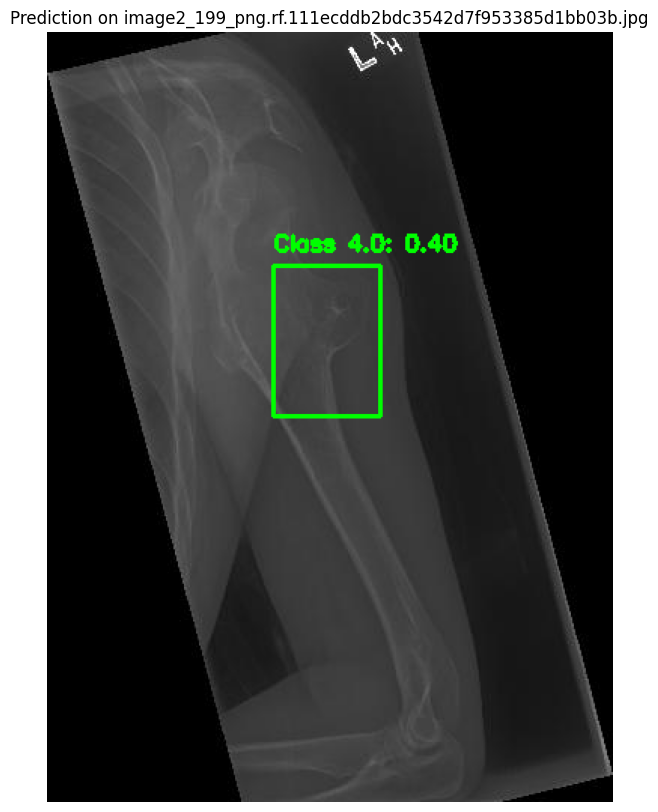


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_230_png.rf.f2a3605e418617cb313976daaec78e18.jpg: 224x192 (no detections), 13.6ms
Speed: 1.0ms preprocess, 13.6ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


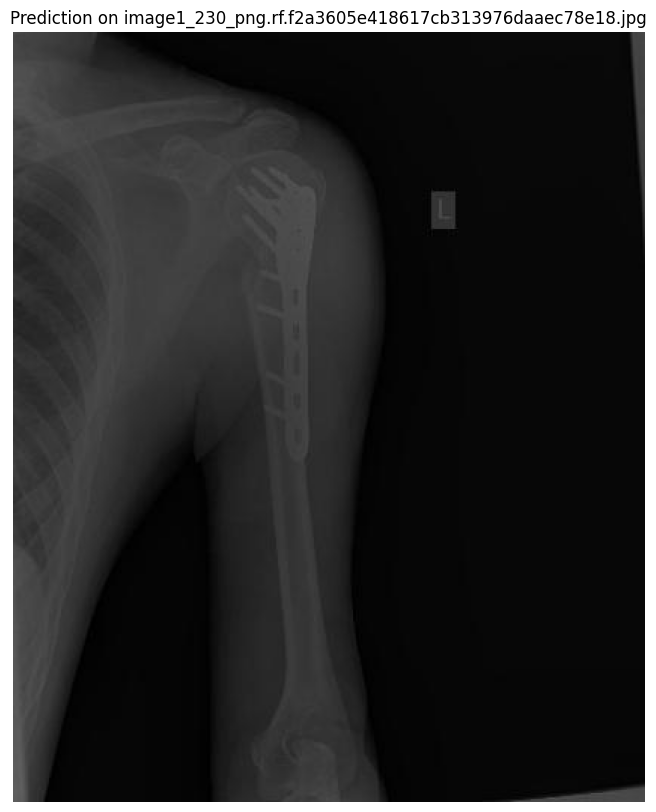


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_8002_png.rf.3b1d55e198fdcd09f808da01429ee7c7.jpg: 224x192 (no detections), 10.0ms
Speed: 1.0ms preprocess, 10.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


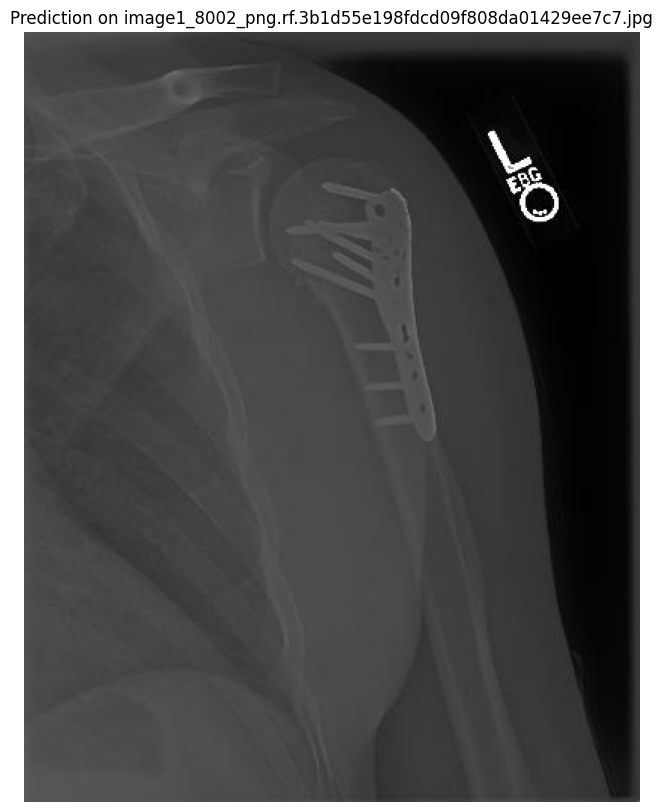


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4499_png.rf.8ed6bcadb4b1266886b392db6f1f1da2.jpg: 224x96 (no detections), 11.0ms
Speed: 0.7ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


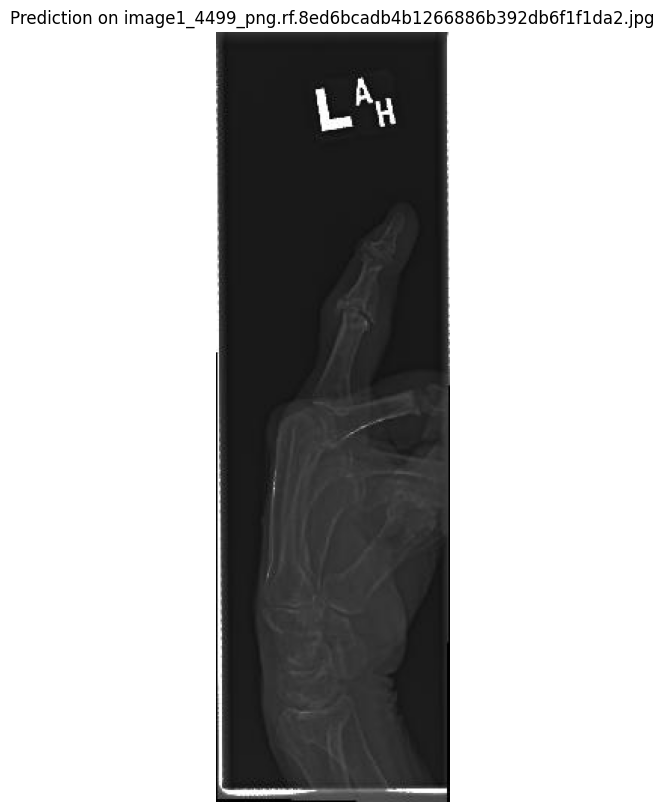


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1365_png.rf.588432cc594787268e4d4e7bdf4bb240.jpg: 224x192 (no detections), 10.4ms
Speed: 0.9ms preprocess, 10.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


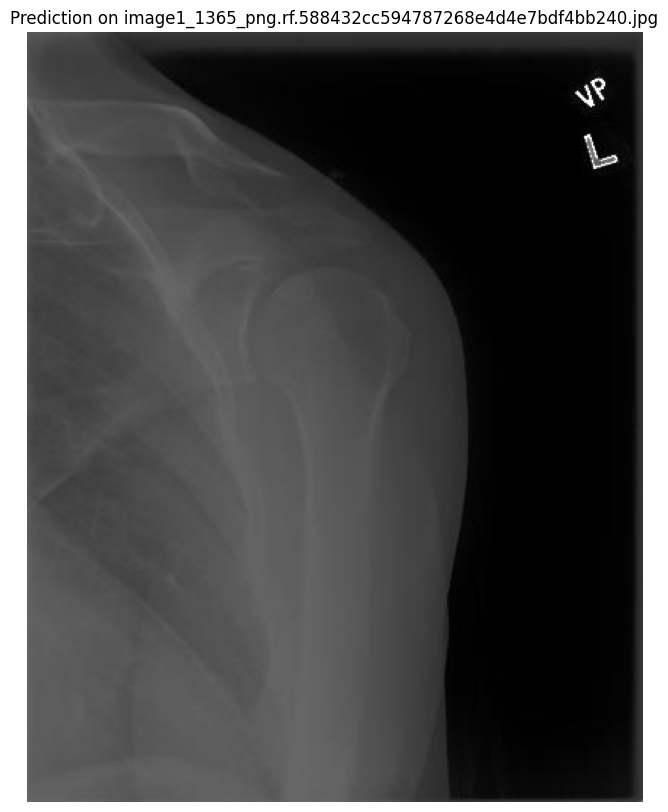


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1_png.rf.ff3f4a12a8e46a9a9aecace2ebf3869a.jpg: 224x192 (no detections), 11.1ms
Speed: 1.5ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


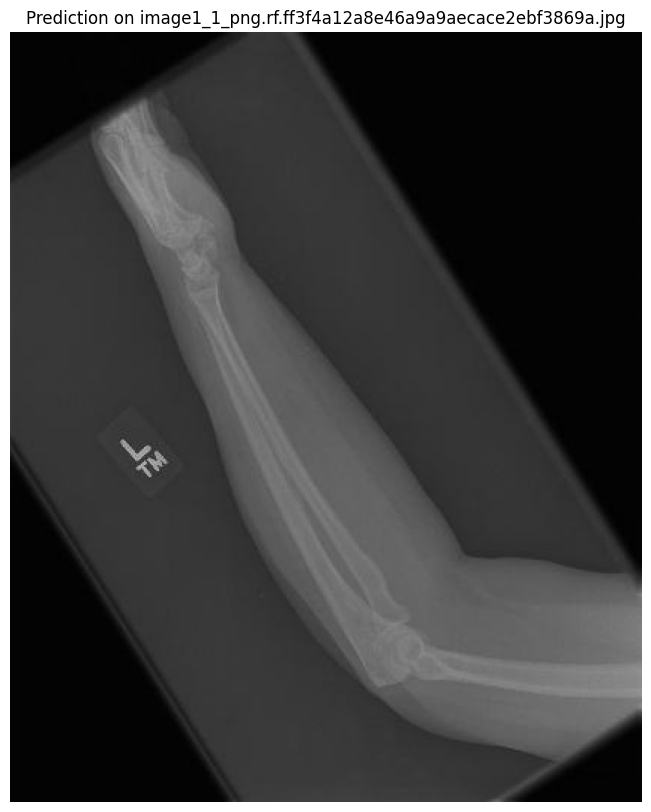


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1000_png.rf.a53c5e186c03961bf88075c6e3e94cf6.jpg: 192x224 1 shoulder fracture, 10.6ms
Speed: 1.0ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 192, 224)


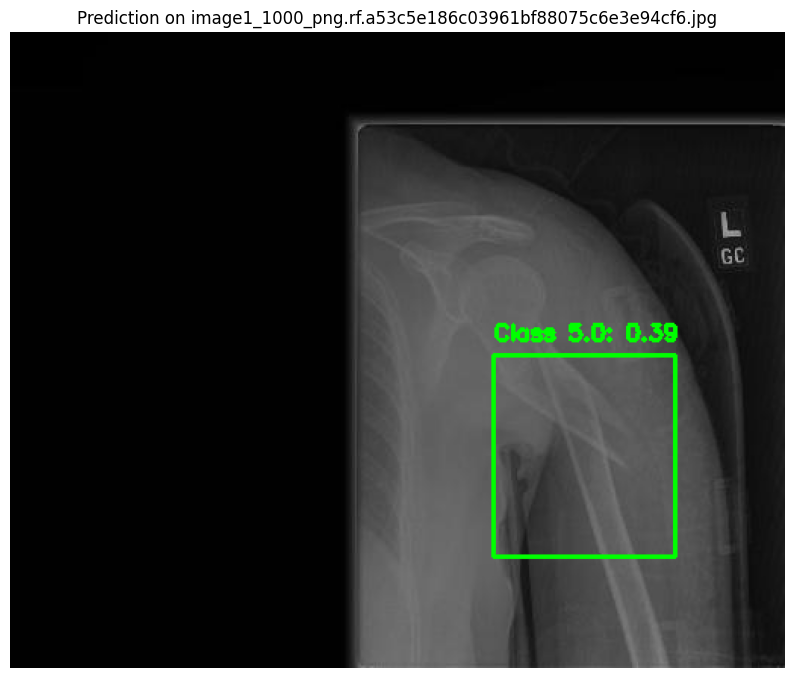


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_125_png.rf.0025d3a37097e5e1e913d6b36f38df9a.jpg: 224x224 (no detections), 10.4ms
Speed: 1.1ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 224)


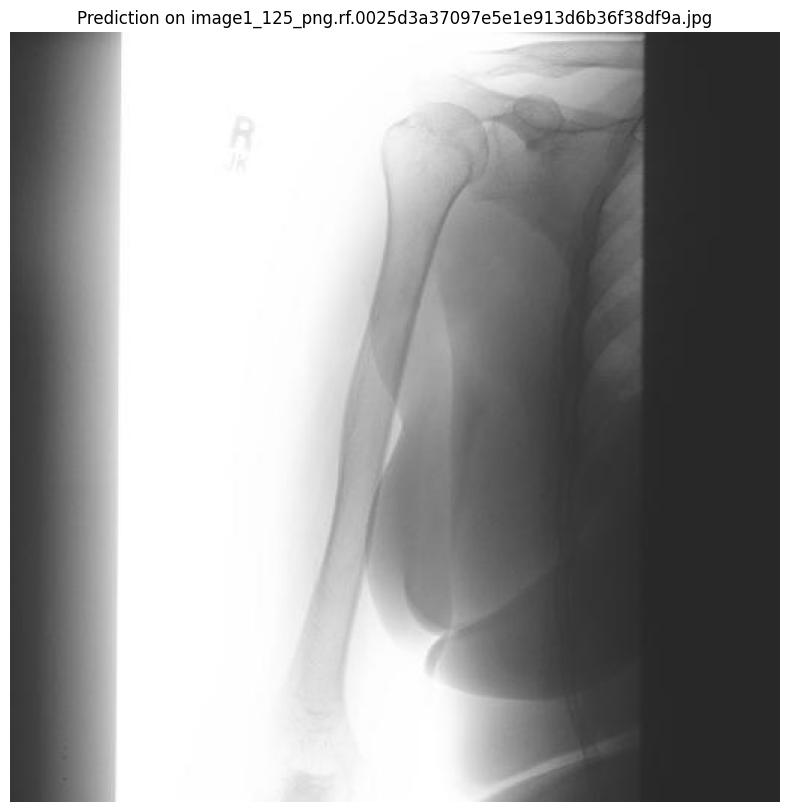


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_645_png.rf.402f6afd337e508ac75cc56d0ecf912c.jpg: 224x192 (no detections), 11.0ms
Speed: 1.1ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


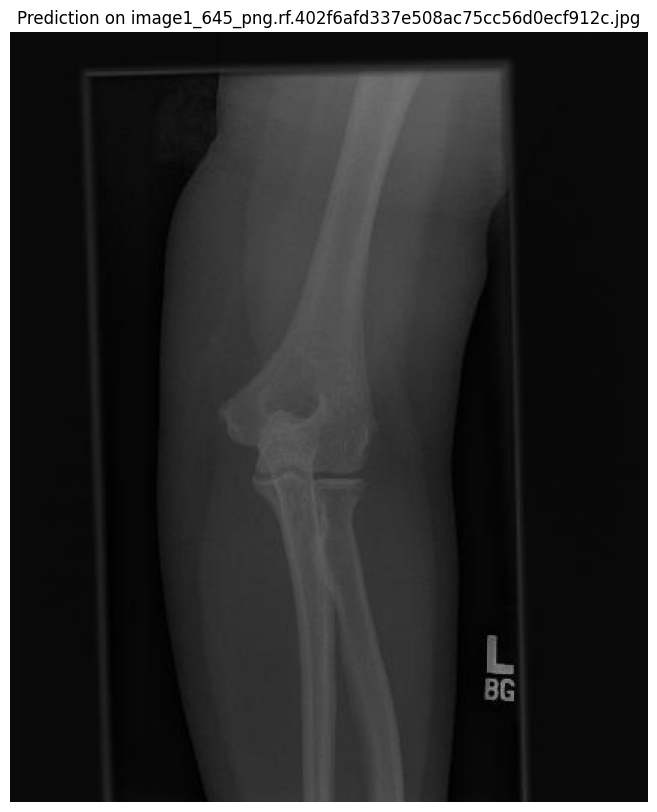


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_594_png.rf.08dd02caad7756ae235e1ff58a0205b6.jpg: 224x160 1 humerus, 10.7ms
Speed: 1.0ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 160)


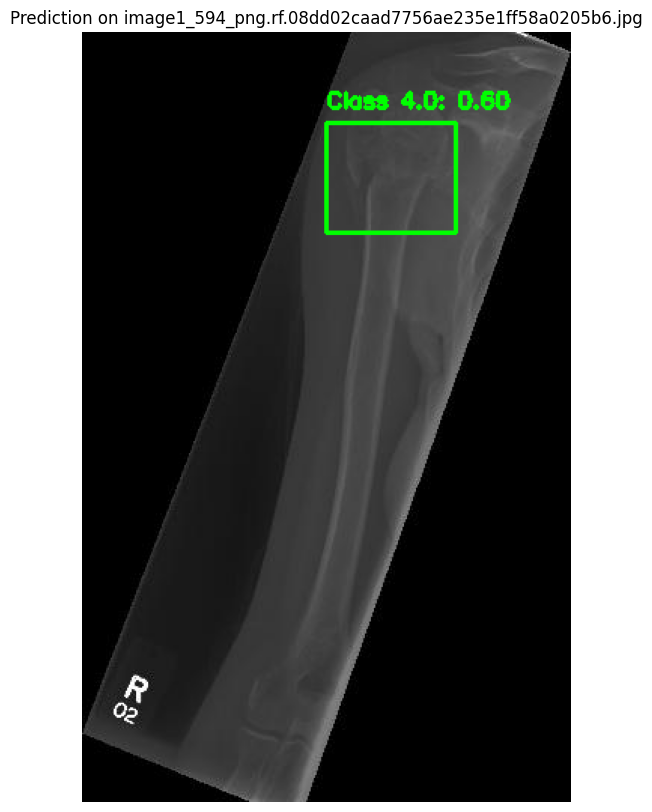


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_252_png.rf.81a8e63687d8630d28257570bd5fcd80.jpg: 224x192 (no detections), 11.6ms
Speed: 1.1ms preprocess, 11.6ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


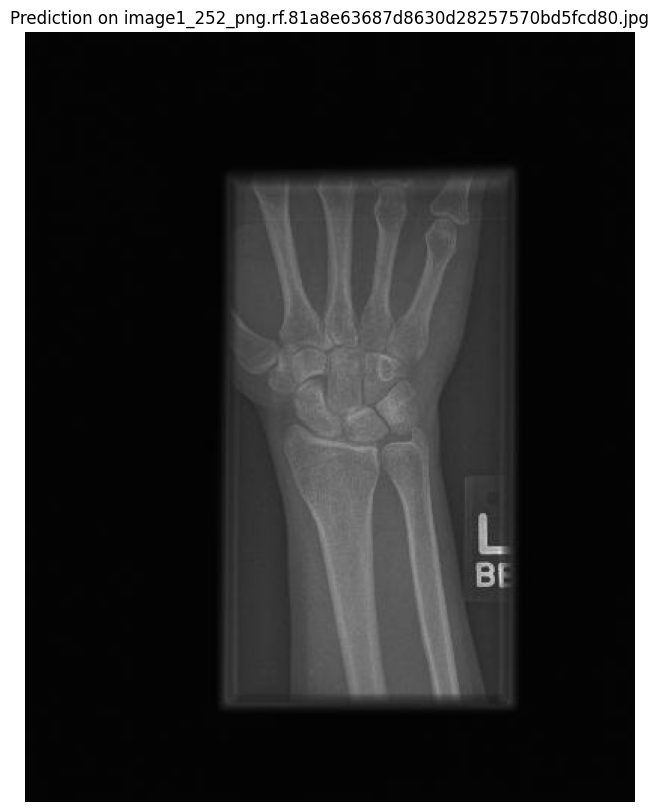


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_536_png.rf.20bf7f571e4badd6d76c3a8894575eb7.jpg: 224x192 1 humerus, 9.9ms
Speed: 1.0ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


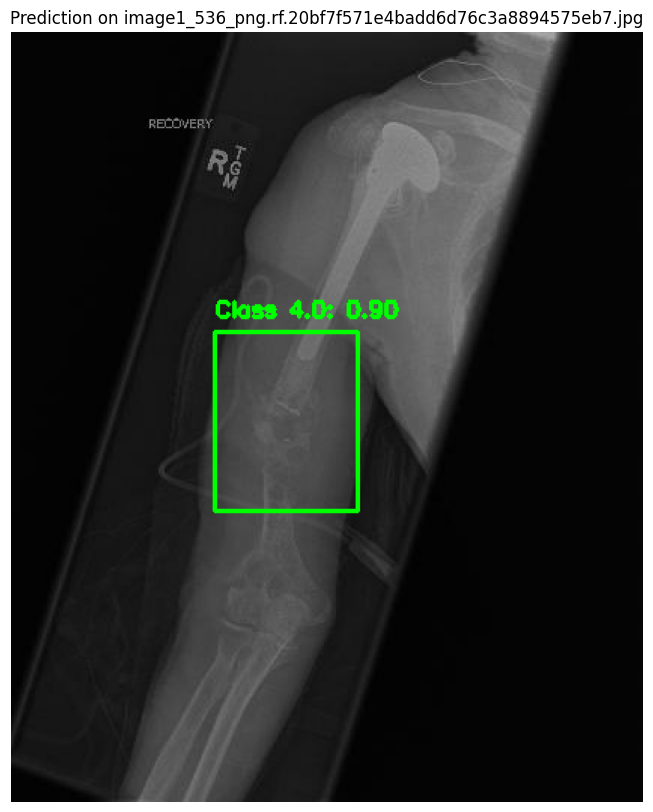


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1563_png.rf.4d5bc124b48e7d4d2636d2d6691e36f2.jpg: 192x224 (no detections), 11.0ms
Speed: 1.0ms preprocess, 11.0ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


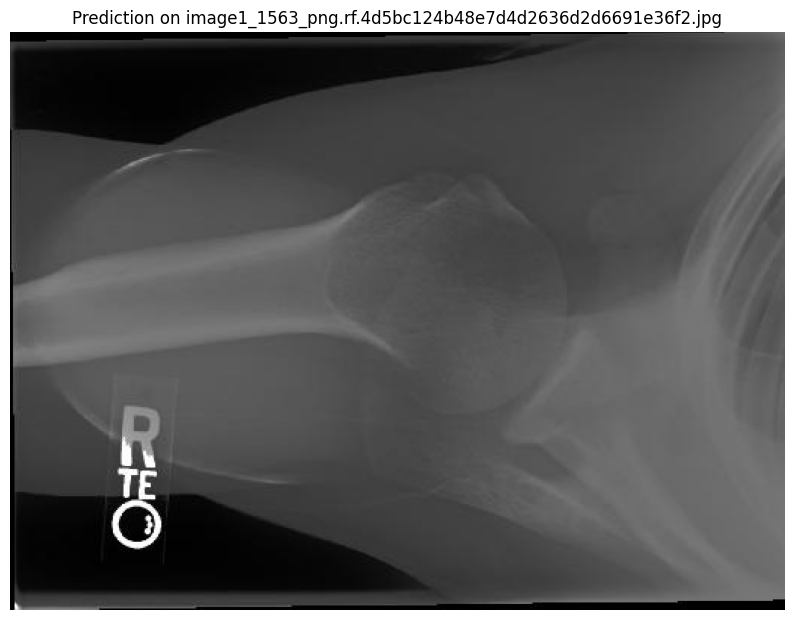


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_92_png.rf.108b5397d94ff8c3c87cc885247ef603.jpg: 224x96 (no detections), 10.2ms
Speed: 0.8ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


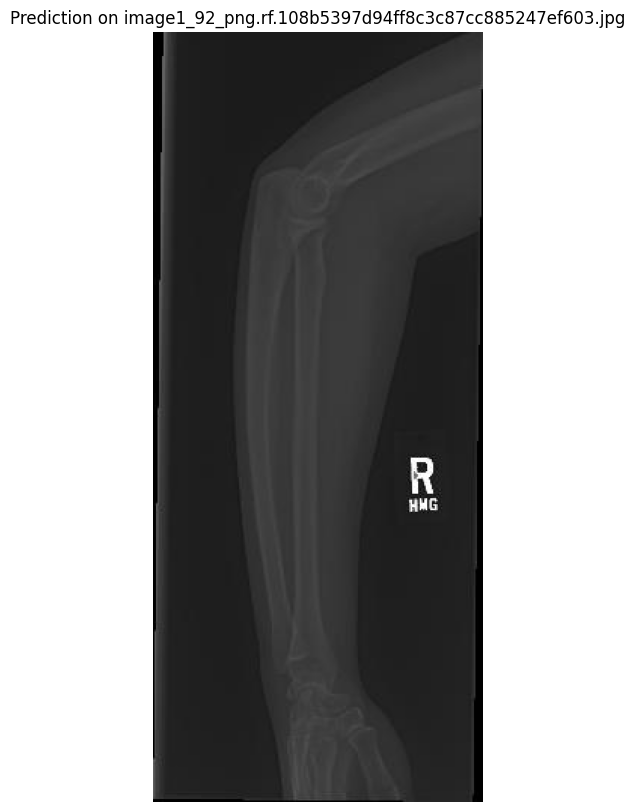


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1057_png.rf.dbd0e857728d8b149e5732cb2824d819.jpg: 224x192 (no detections), 10.4ms
Speed: 1.0ms preprocess, 10.4ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


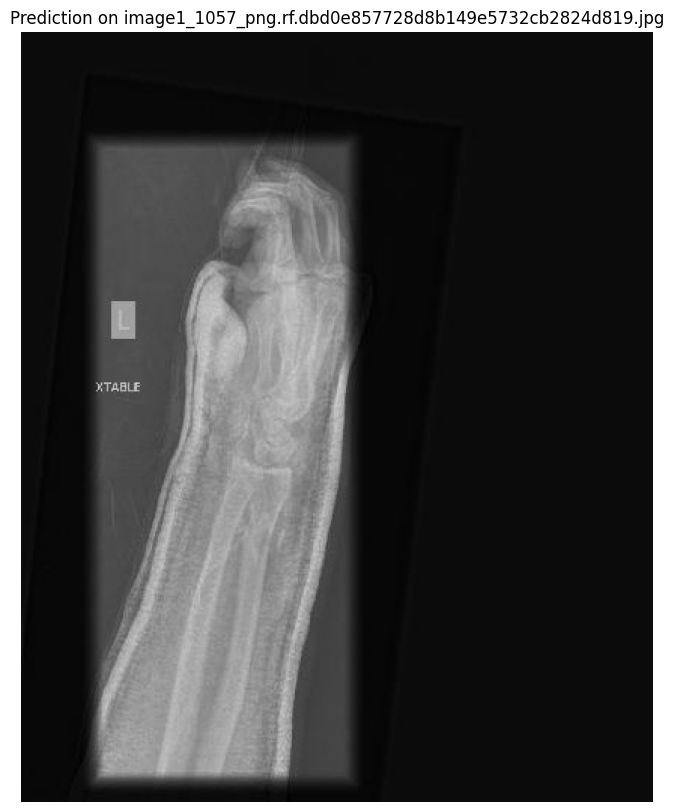


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_2336_png.rf.76087ca1e6263ce05700b7e1f92b9f02.jpg: 192x224 1 shoulder fracture, 13.3ms
Speed: 1.1ms preprocess, 13.3ms inference, 2.1ms postprocess per image at shape (1, 3, 192, 224)


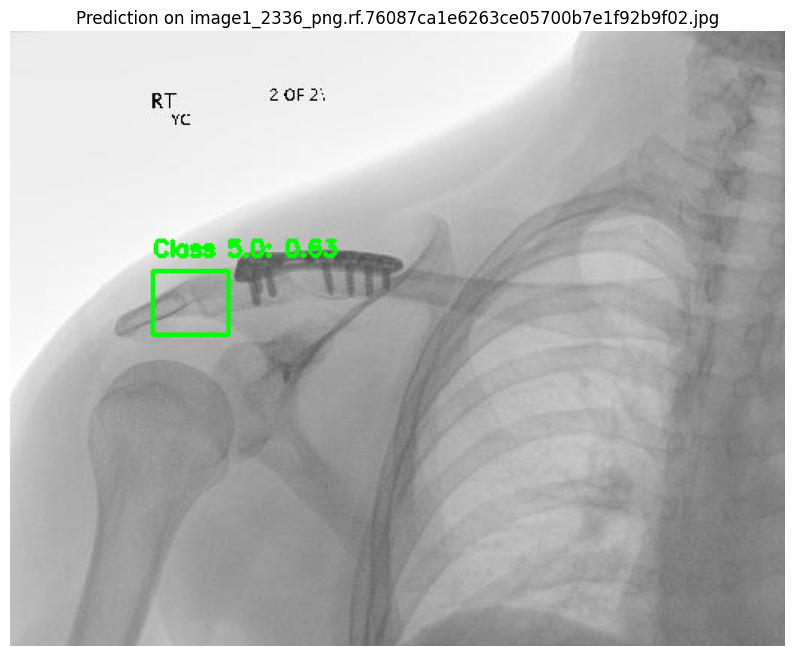


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_537_png.rf.06ee5106226a244e50fa61450224633b.jpg: 224x192 (no detections), 10.7ms
Speed: 1.2ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


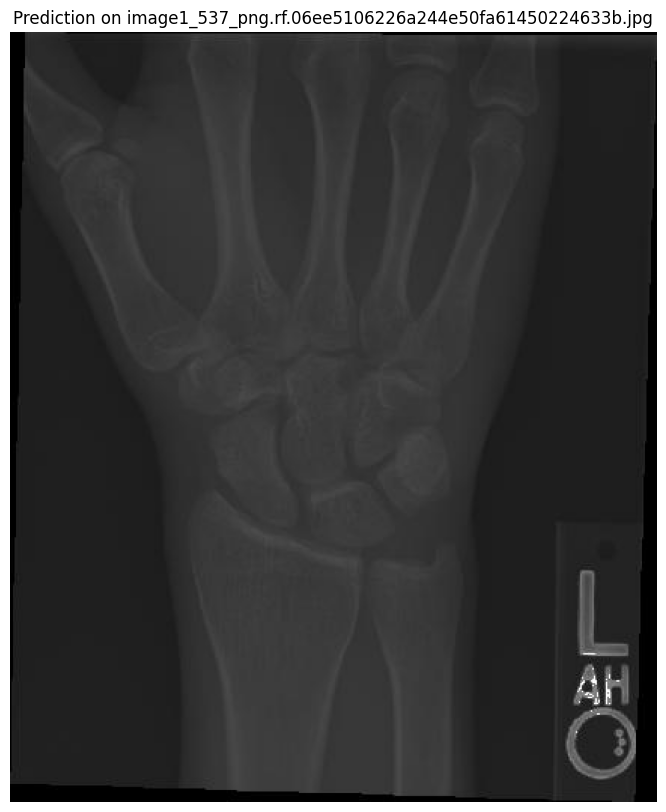


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_43_png.rf.9757e6d0c648b4544e9043ccc8fb31ca.jpg: 224x192 (no detections), 10.0ms
Speed: 1.0ms preprocess, 10.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


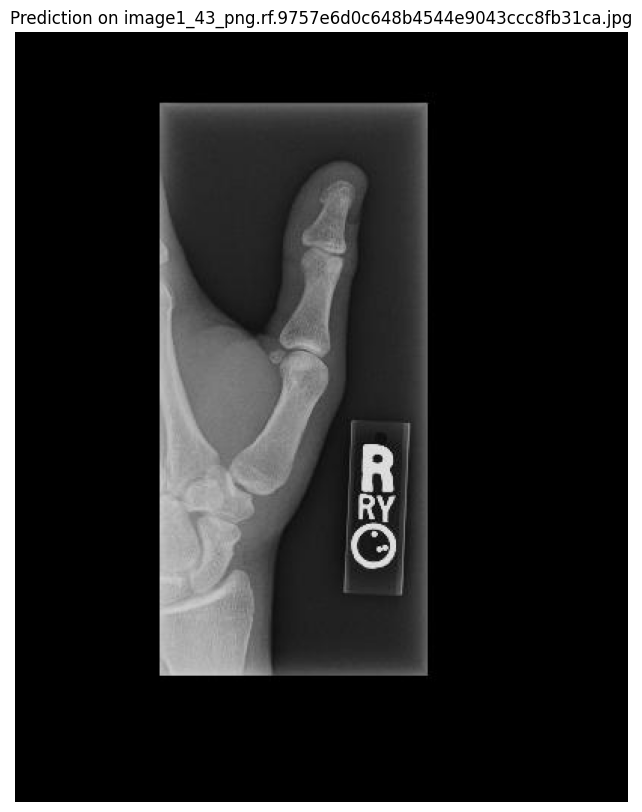


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_6973_png.rf.6a71f376e7ce54b8e8d484d17e699596.jpg: 224x192 2 shoulder fractures, 9.7ms
Speed: 1.0ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


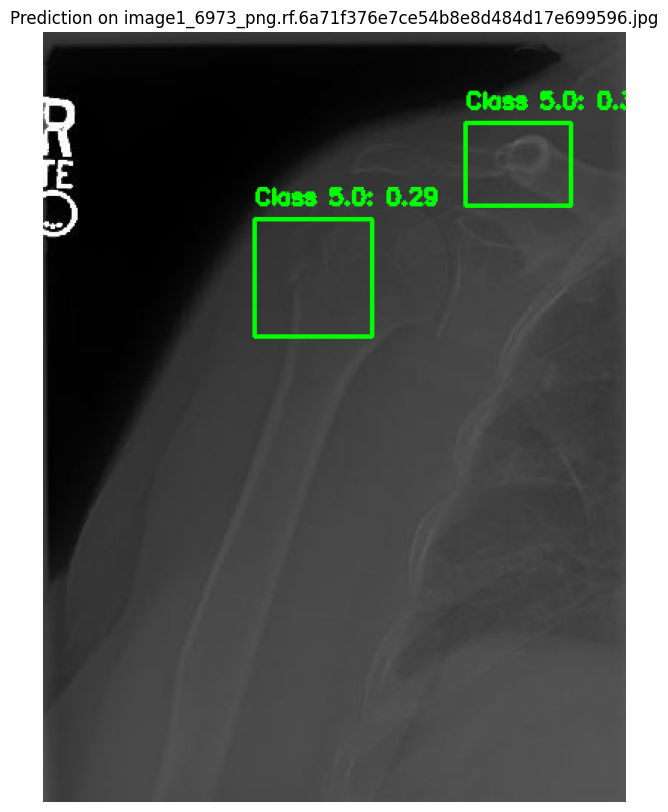


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3726_png.rf.2876d2f0108b5a9fb5c23e8fb95f4625.jpg: 224x96 (no detections), 10.2ms
Speed: 0.8ms preprocess, 10.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


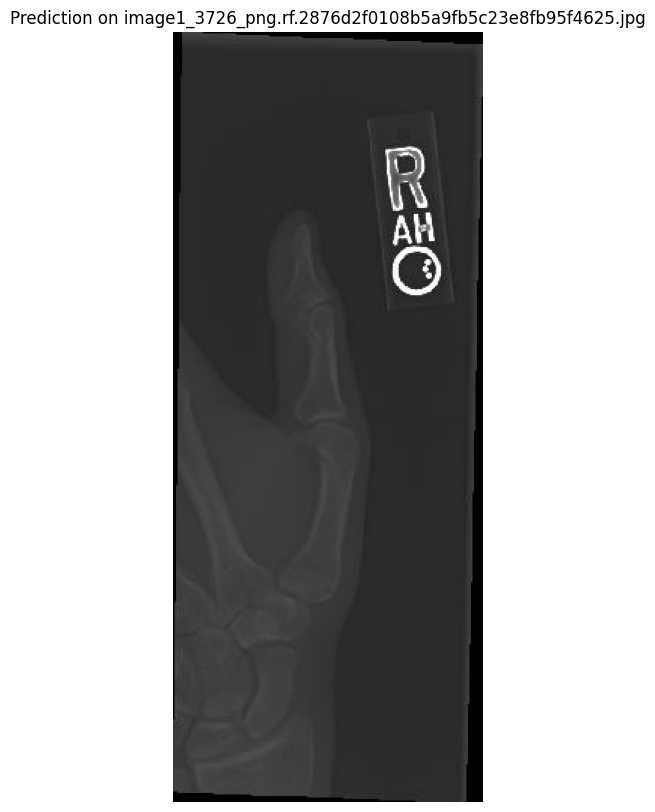


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_639_png.rf.915590376683dad767046b536acd3b19.jpg: 224x96 (no detections), 10.1ms
Speed: 0.8ms preprocess, 10.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


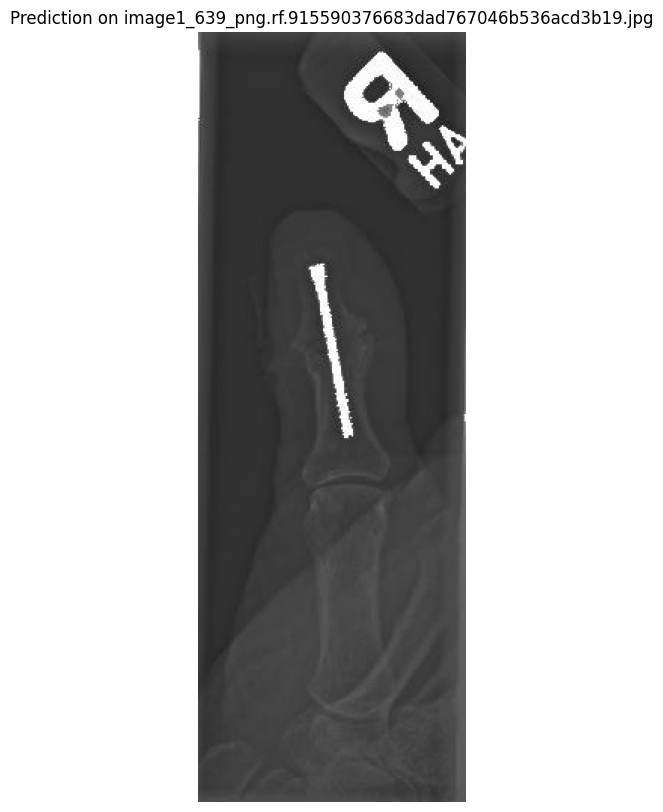


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_37_png.rf.bda84ad18e135a15c25ffd40bd55567f.jpg: 224x224 (no detections), 11.1ms
Speed: 1.2ms preprocess, 11.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 224)


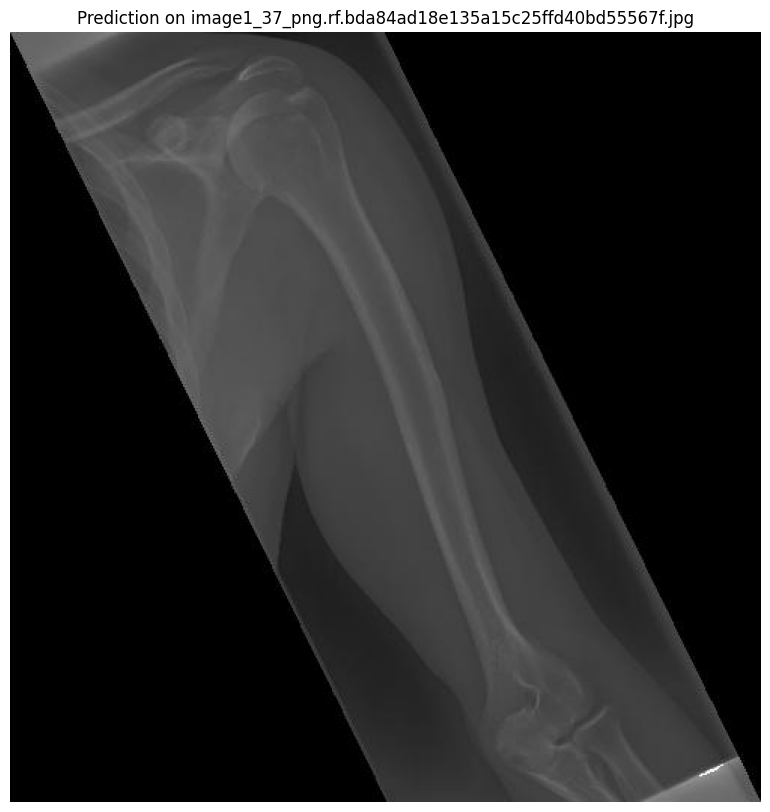


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1175_png.rf.aad108f3739e48313c773ad1392a8966.jpg: 224x224 1 humerus, 11.5ms
Speed: 1.2ms preprocess, 11.5ms inference, 2.8ms postprocess per image at shape (1, 3, 224, 224)


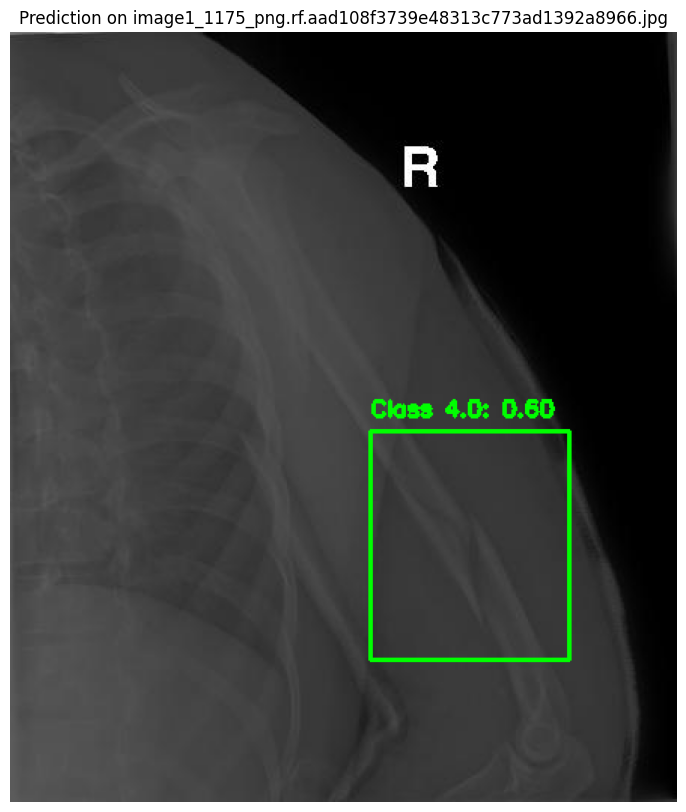


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_852_png.rf.b721589a516459f110ab073a190f3f0f.jpg: 128x224 (no detections), 50.3ms
Speed: 0.9ms preprocess, 50.3ms inference, 0.8ms postprocess per image at shape (1, 3, 128, 224)


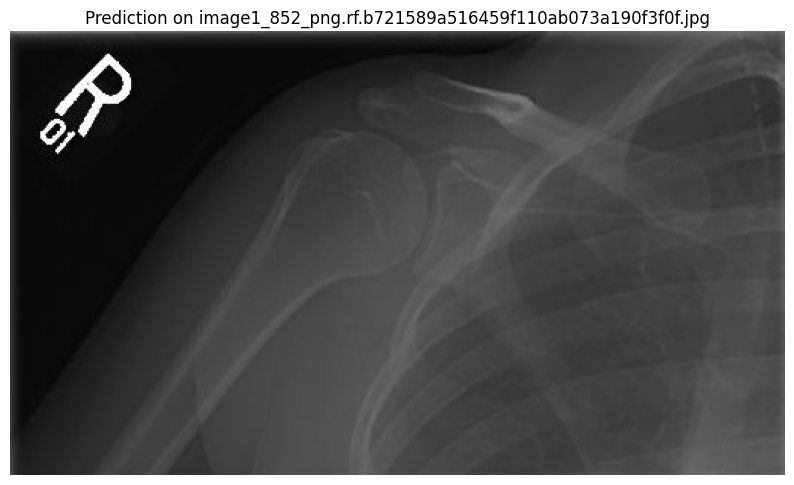


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_327_png.rf.f8494f574a1ebe492bf514a9504da0a1.jpg: 224x192 (no detections), 11.2ms
Speed: 1.0ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


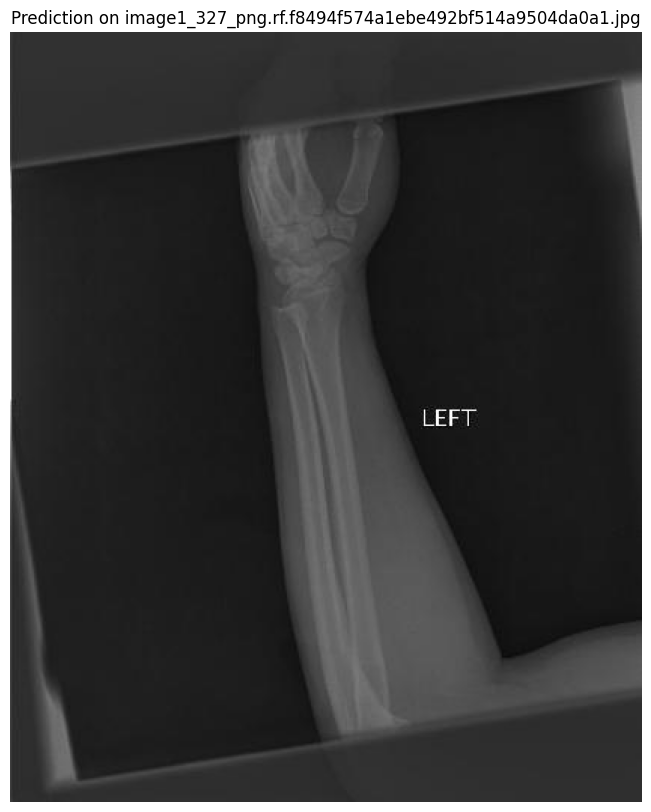


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_33_png.rf.c1c24340e753b63b6f4e5079b8ef474d.jpg: 224x192 1 fingers positive, 1 wrist positive, 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 224, 192)


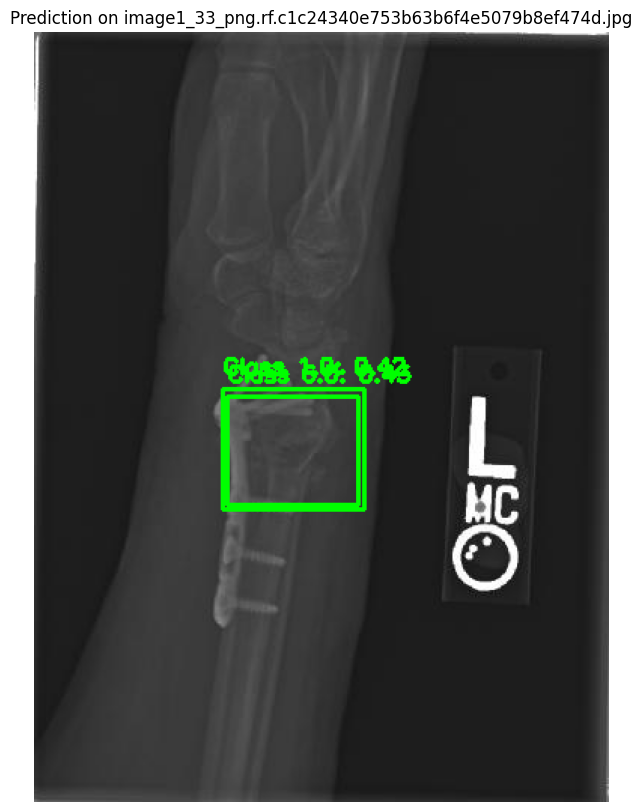


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_953_png.rf.97a41890b4badde45bfc390f9f5c9d12.jpg: 224x192 1 forearm fracture, 10.1ms
Speed: 1.1ms preprocess, 10.1ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 192)


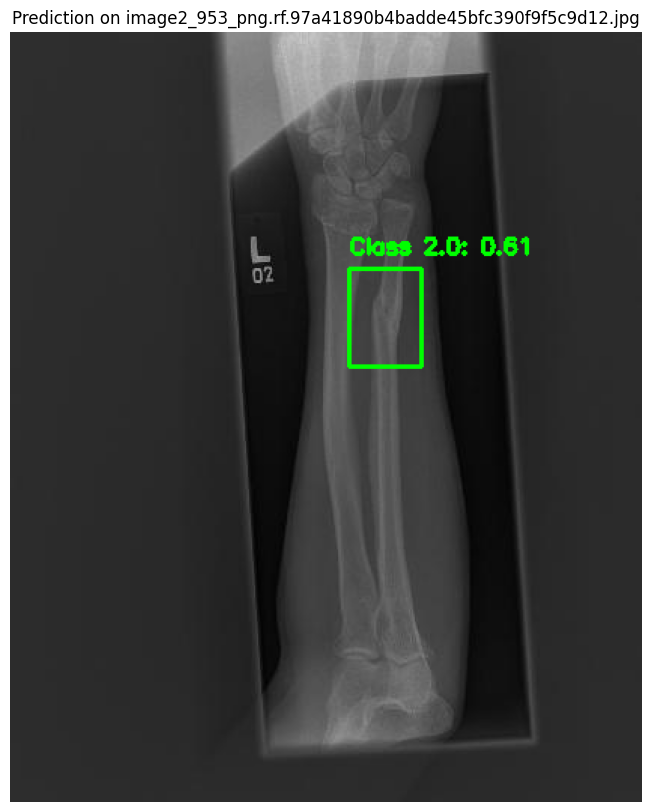


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1035_png.rf.d7493a5653bc3628f7a1b1ec0eb5de85.jpg: 224x192 (no detections), 9.0ms
Speed: 1.0ms preprocess, 9.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


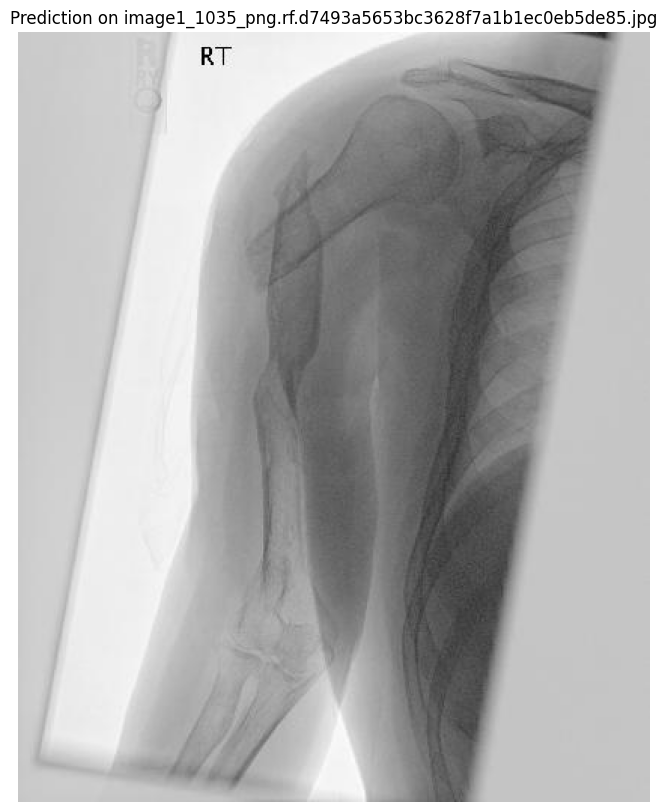


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1545_png.rf.cd2ce2cc69004944f0d920c4bda34592.jpg: 224x160 (no detections), 20.0ms
Speed: 1.0ms preprocess, 20.0ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 160)


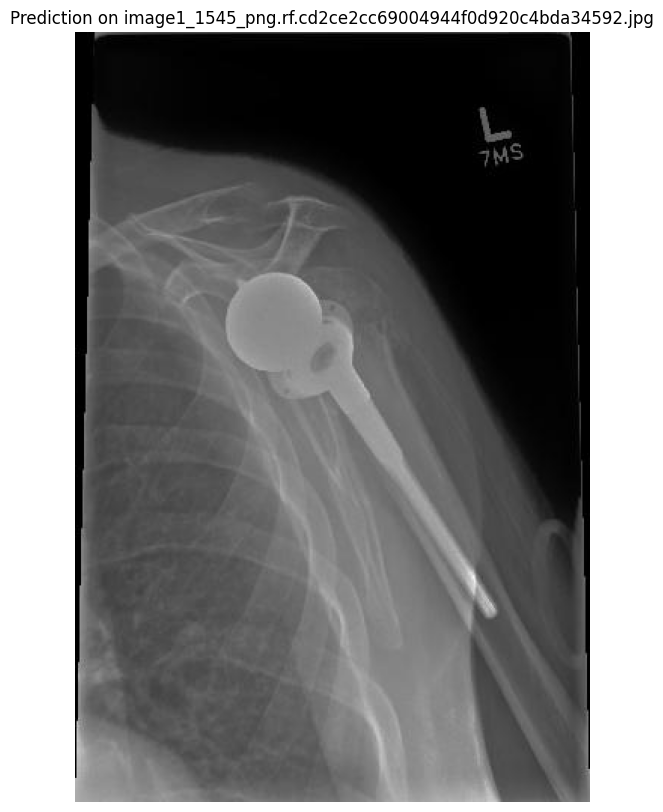


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1588_png.rf.aba29f401dee4db13fc5434f3c0186b4.jpg: 224x192 (no detections), 10.7ms
Speed: 1.2ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


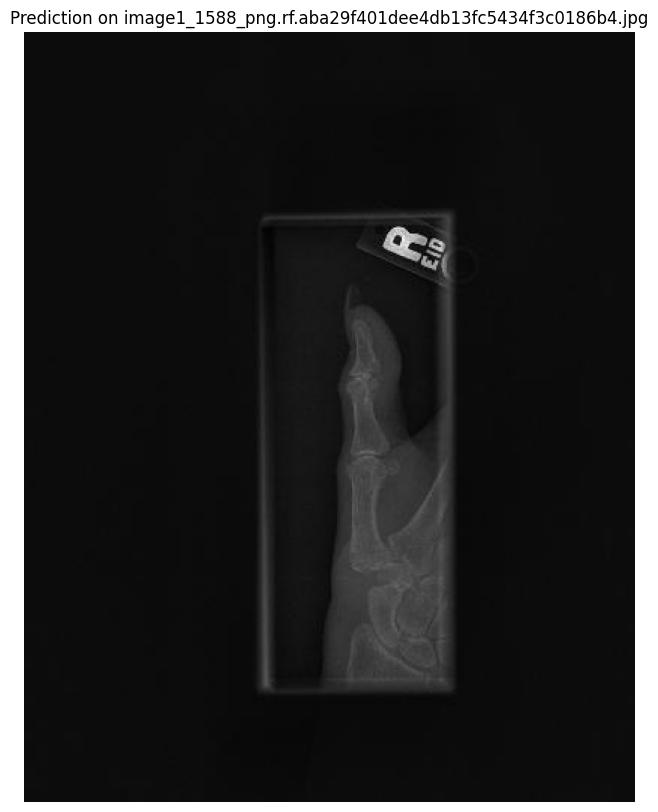


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_291_png.rf.c5a2f62a6316d1ebd9f91cb85ed65891.jpg: 192x224 (no detections), 11.2ms
Speed: 1.0ms preprocess, 11.2ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


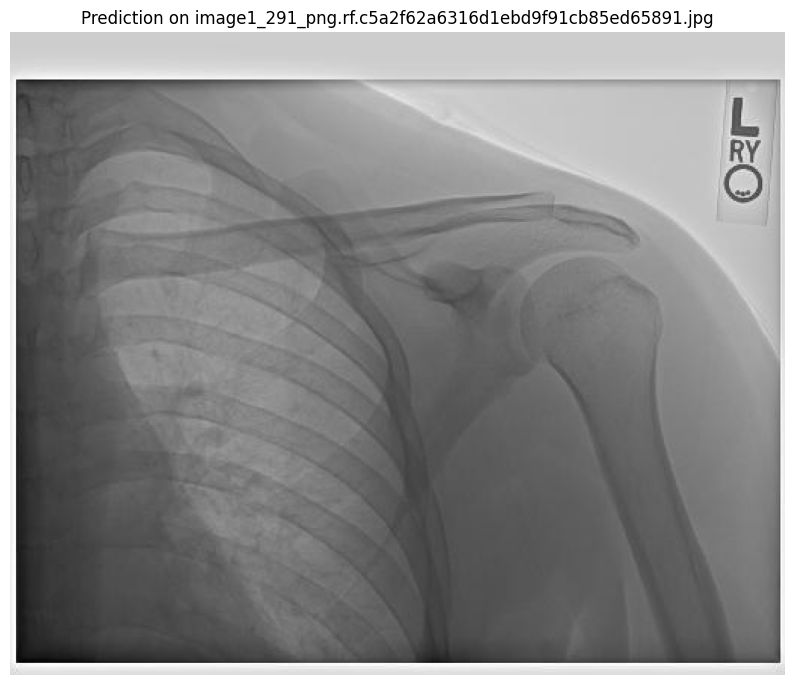


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_232_png.rf.66b26e2592f806b3b659538ae42a2e74.jpg: 224x224 (no detections), 11.7ms
Speed: 1.2ms preprocess, 11.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


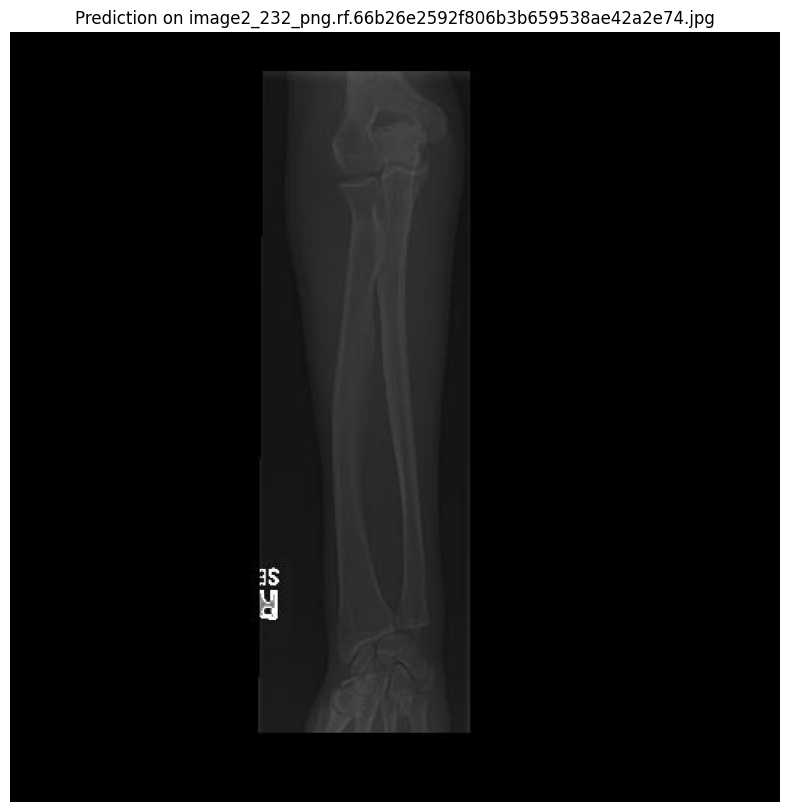


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1015_png.rf.3b7320c3c40771fa5532bf713a728b83.jpg: 192x224 (no detections), 10.5ms
Speed: 1.0ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


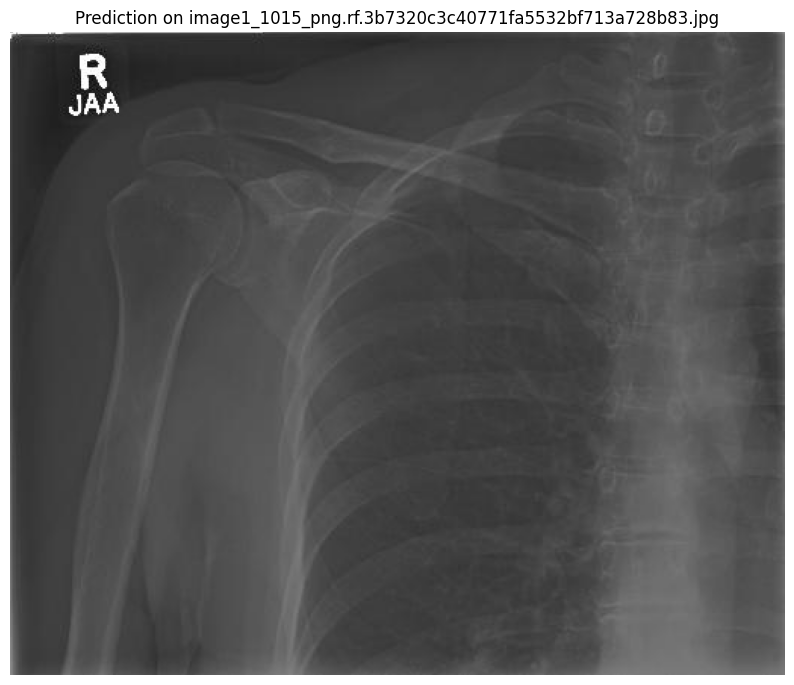


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3374_png.rf.c13f2204d119c696615bdfeb960e7748.jpg: 224x128 1 fingers positive, 1 wrist positive, 10.3ms
Speed: 0.9ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 128)


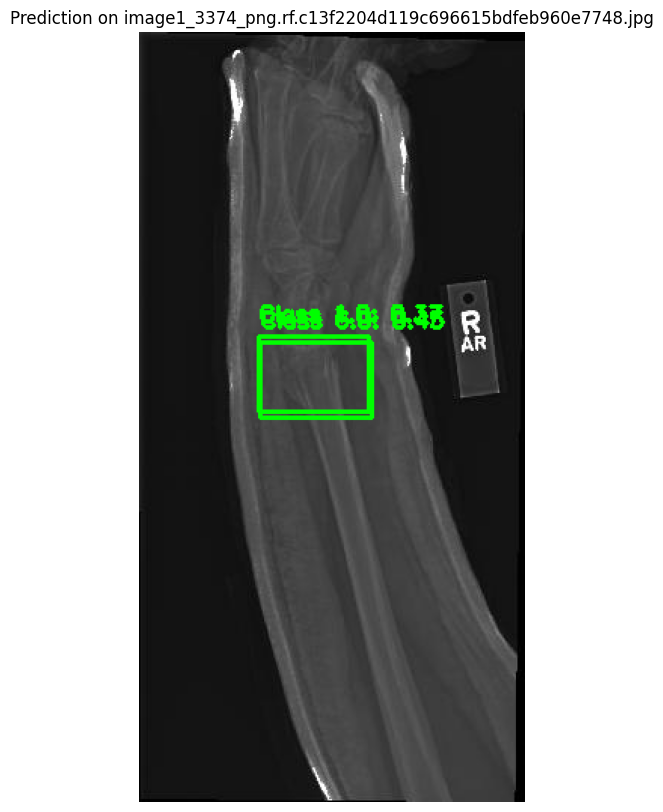


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_635_png.rf.87aa3f97aeaffa79004761ae1f895cac.jpg: 224x192 (no detections), 10.4ms
Speed: 1.0ms preprocess, 10.4ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


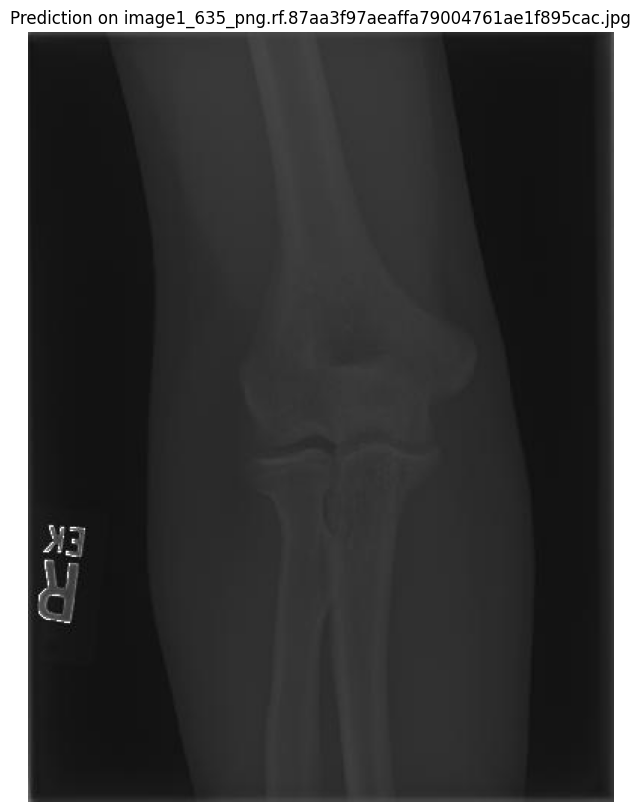


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_344_png.rf.d52b5bab514fb7cfb568da05594a6404.jpg: 224x96 (no detections), 18.1ms
Speed: 0.8ms preprocess, 18.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 96)


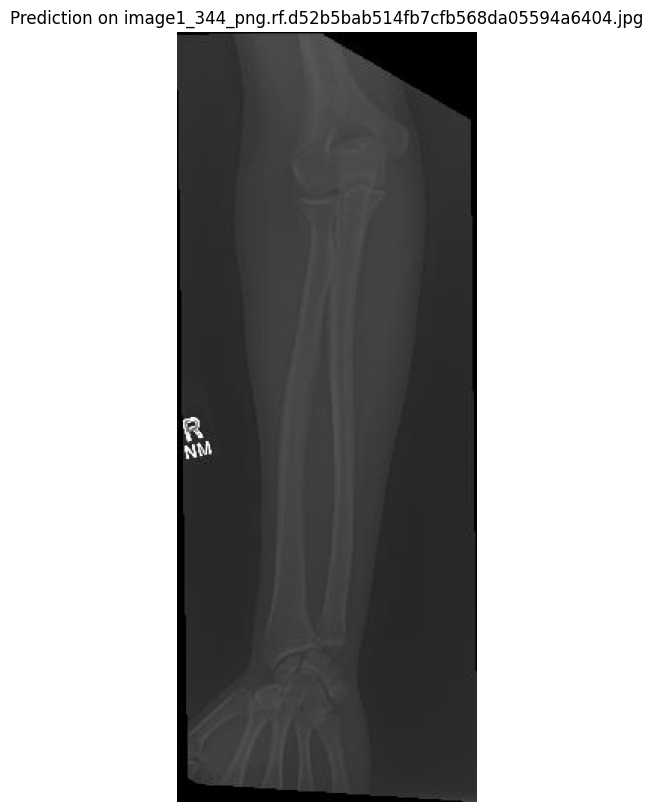


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_509_png.rf.4b918f154cece667f6fe4ec2e676eaf1.jpg: 192x224 (no detections), 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


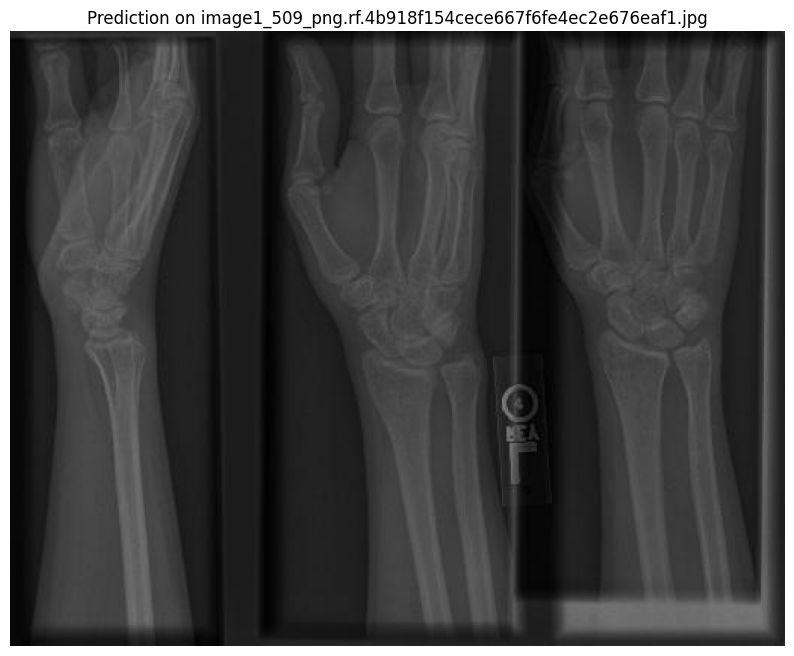


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_726_png.rf.d196dd48429681a19051d39b968f3fb0.jpg: 224x224 (no detections), 15.8ms
Speed: 1.1ms preprocess, 15.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


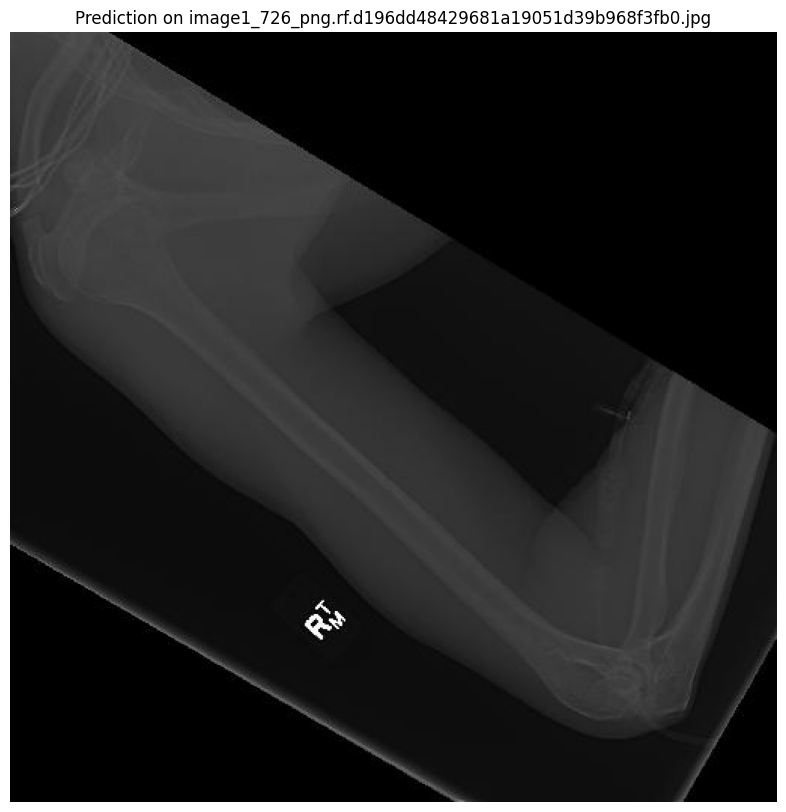


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_860_png.rf.37fd7f57d0b9ec38eafafceacdbd4f4c.jpg: 224x128 (no detections), 13.7ms
Speed: 1.1ms preprocess, 13.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 128)


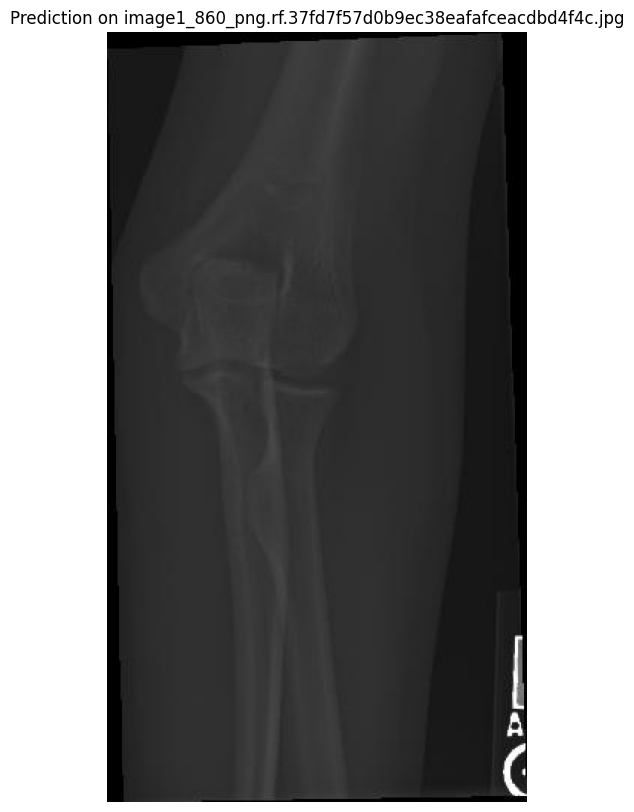


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3413_png.rf.d18ceb5ede7d864fef838167eae65120.jpg: 192x224 (no detections), 10.5ms
Speed: 1.0ms preprocess, 10.5ms inference, 0.7ms postprocess per image at shape (1, 3, 192, 224)


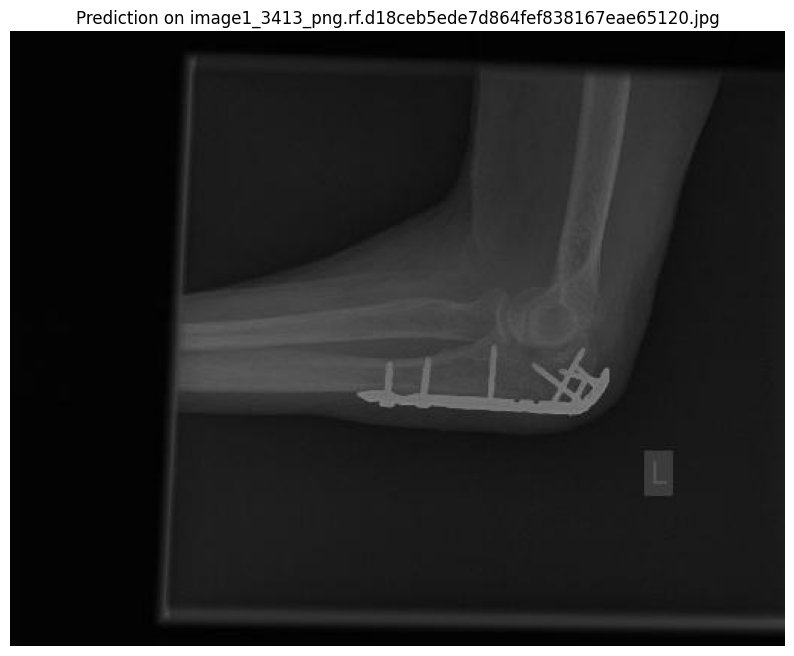


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1126_png.rf.66c21ce21ee255ed4bdc66164bac87c5.jpg: 192x224 1 forearm fracture, 13.5ms
Speed: 1.0ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 192, 224)


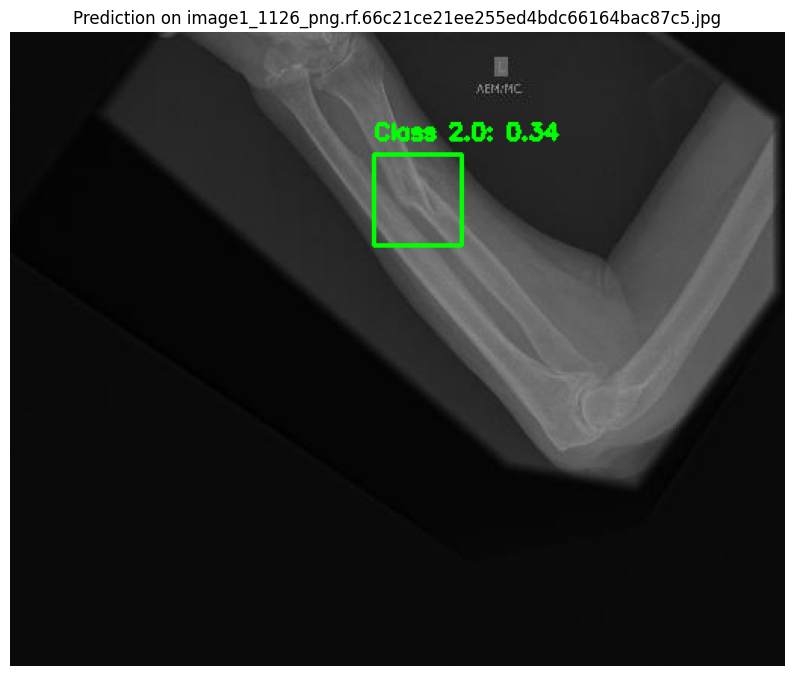


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_637_png.rf.750d1e44edbbb461c9505f1d9c0e4a02.jpg: 224x224 (no detections), 14.9ms
Speed: 1.1ms preprocess, 14.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 224)


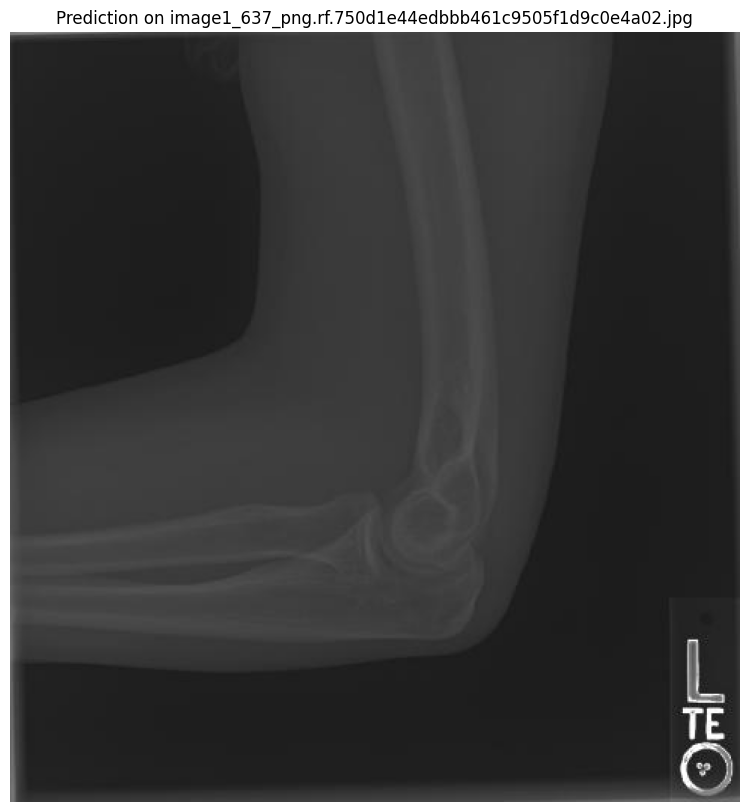


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_1758_png.rf.be01737bb3e65525d2fcac4a9814624f.jpg: 192x224 (no detections), 12.3ms
Speed: 1.1ms preprocess, 12.3ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


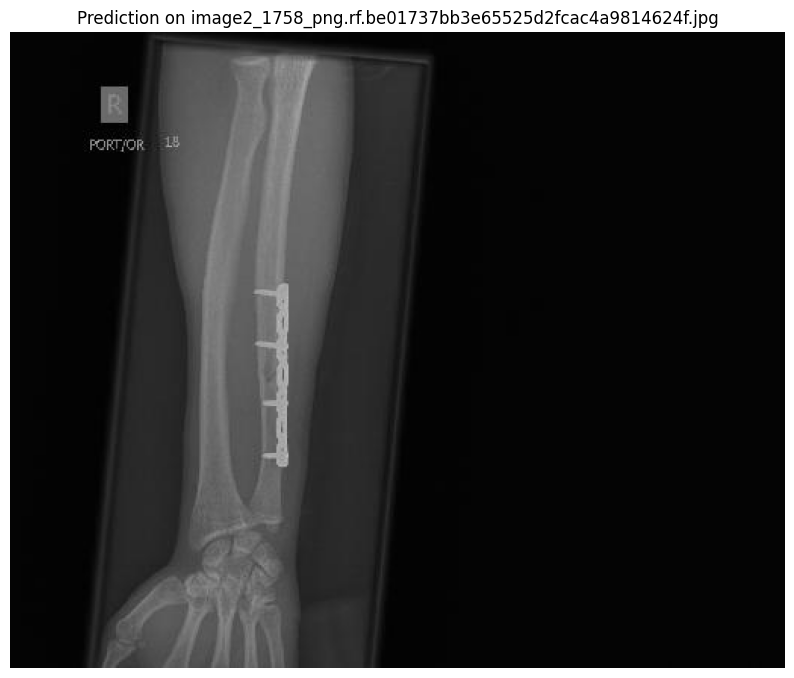


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_0_png.rf.99862308d714bff3f9c410adf5ca93ac.jpg: 192x224 (no detections), 10.1ms
Speed: 1.5ms preprocess, 10.1ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


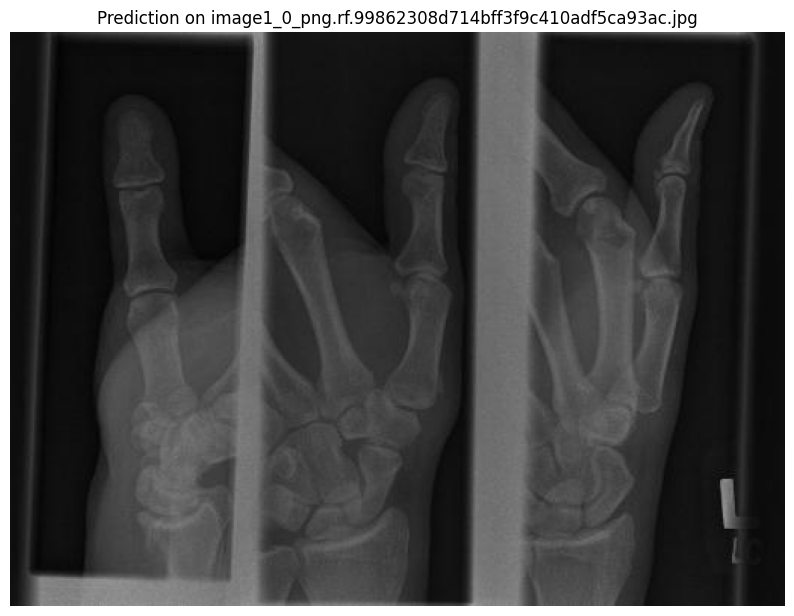


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1284_png.rf.45c8239cf68c001ba91d7d002729eec7.jpg: 224x192 (no detections), 16.9ms
Speed: 1.1ms preprocess, 16.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


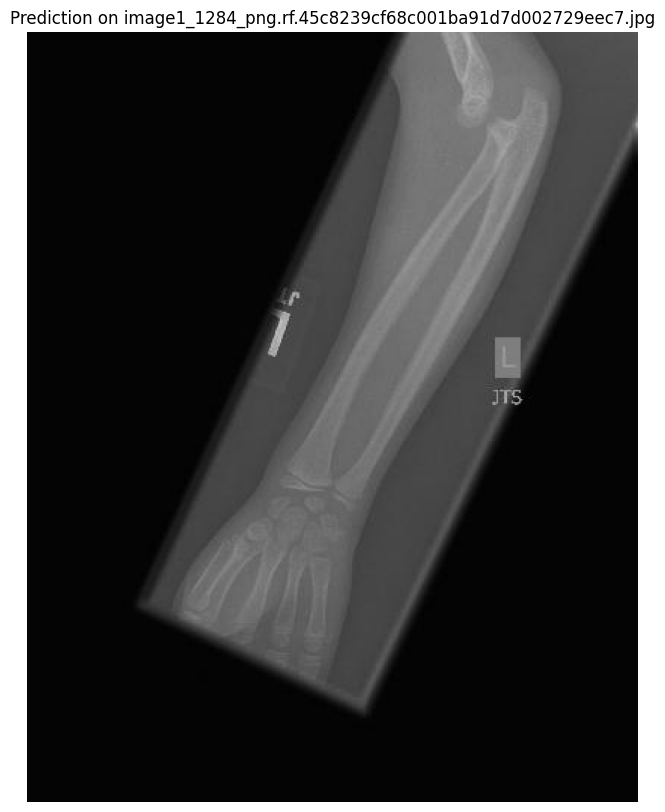


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_674_png.rf.9c85436fb6b27fc193107ee487555959.jpg: 224x192 (no detections), 12.1ms
Speed: 1.1ms preprocess, 12.1ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


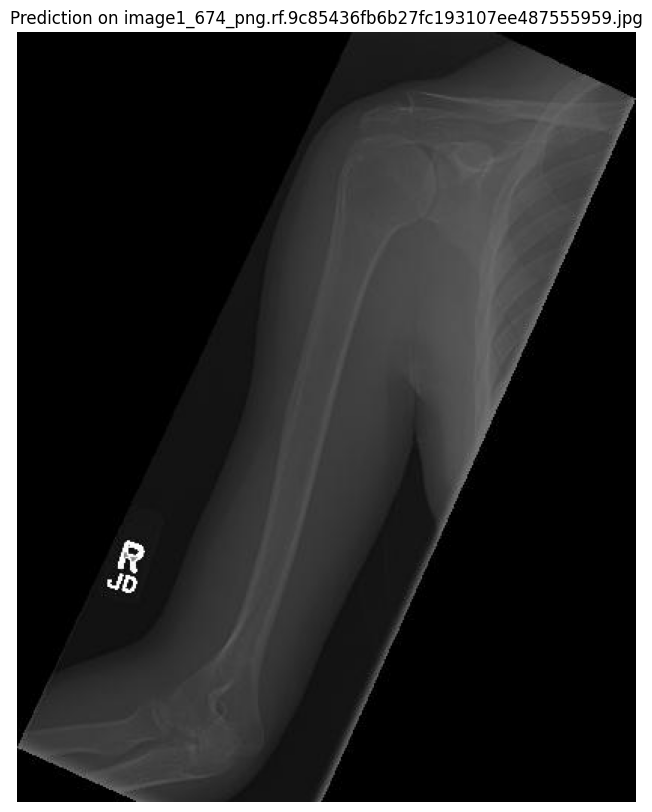


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1101_png.rf.76b621303ad7da308e79a2e39d860675.jpg: 224x192 (no detections), 17.4ms
Speed: 0.9ms preprocess, 17.4ms inference, 3.0ms postprocess per image at shape (1, 3, 224, 192)


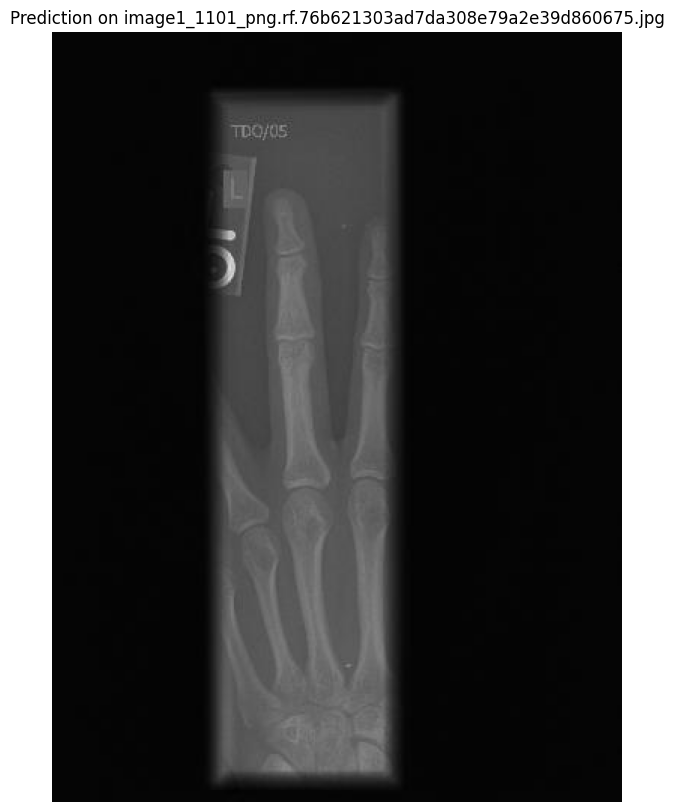


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_2600_png.rf.01b17c4166e1ea6a863191eebfff35ae.jpg: 224x192 (no detections), 13.8ms
Speed: 1.1ms preprocess, 13.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


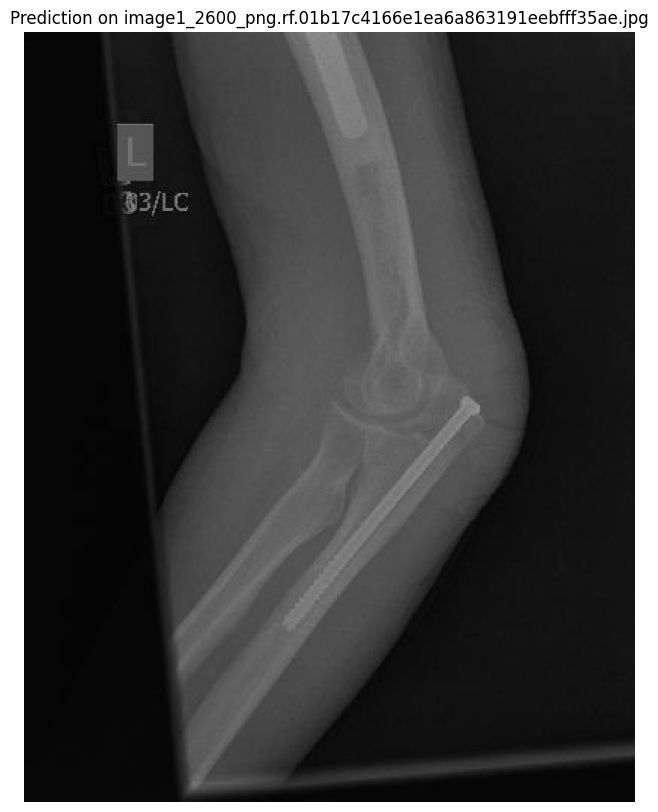


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_211_png.rf.e1fd0ca40a197d13f9ecae59c4074d43.jpg: 224x192 (no detections), 13.2ms
Speed: 1.1ms preprocess, 13.2ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


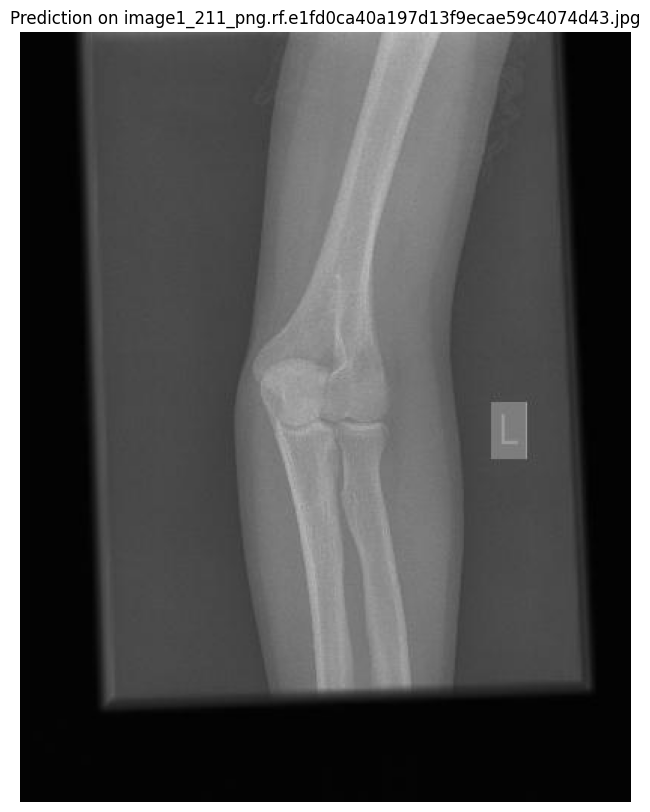


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_314_png.rf.870abcb0b0922e63bd5ba9389a1efd74.jpg: 224x192 (no detections), 12.9ms
Speed: 1.1ms preprocess, 12.9ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 192)


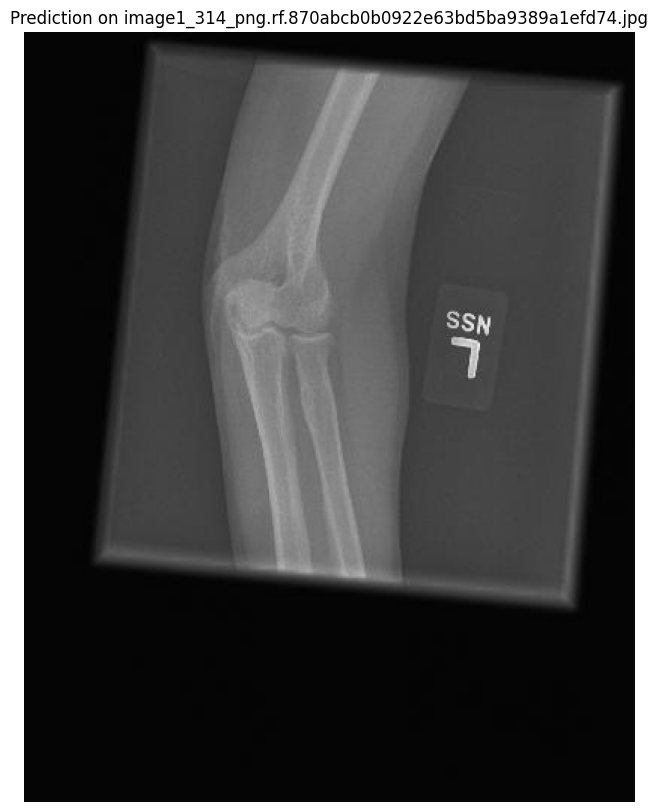


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_152_png.rf.f6e7109e7499a7a20e4fc8c0940603d3.jpg: 224x160 (no detections), 12.8ms
Speed: 1.0ms preprocess, 12.8ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 160)


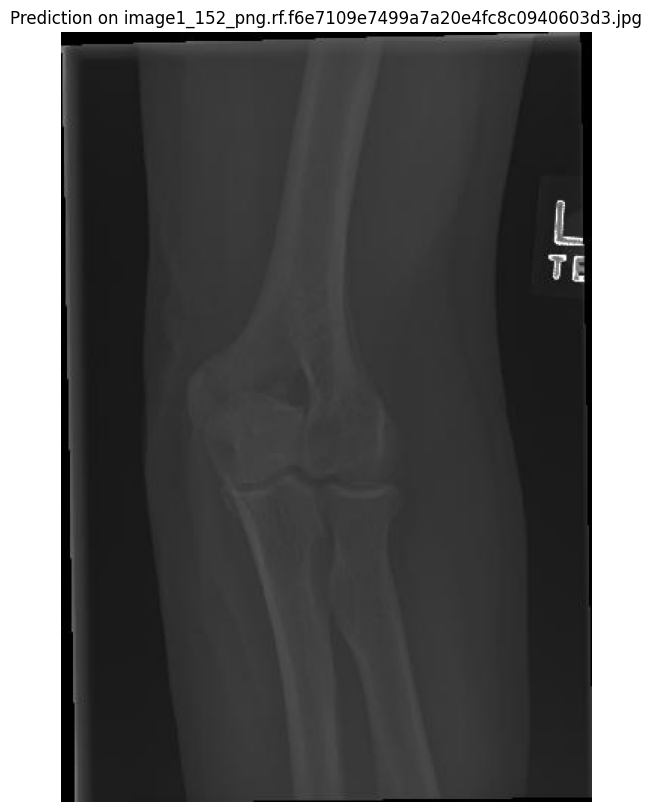


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_273_png.rf.b2d75c97ef473f97c7077eb114856b2a.jpg: 224x192 1 shoulder fracture, 14.8ms
Speed: 1.0ms preprocess, 14.8ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


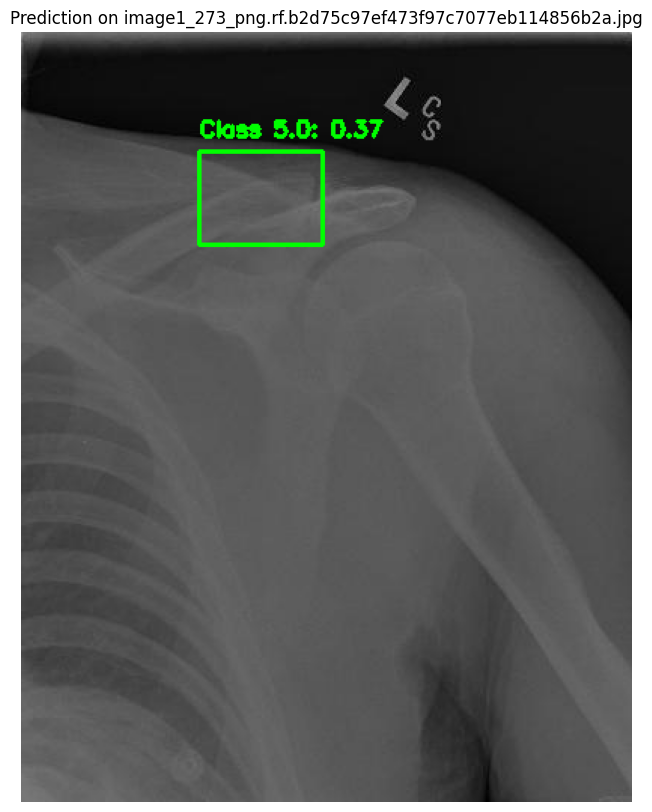


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1326_png.rf.6019c7e15df84d9d6286932d03e687b6.jpg: 128x224 (no detections), 15.3ms
Speed: 0.9ms preprocess, 15.3ms inference, 0.8ms postprocess per image at shape (1, 3, 128, 224)


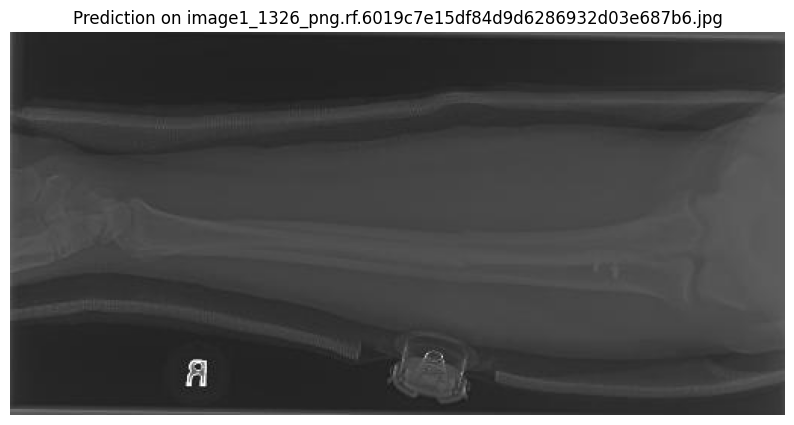


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_704_png.rf.e3668d404753b933e1fd9500e697ca8c.jpg: 192x224 (no detections), 14.4ms
Speed: 1.0ms preprocess, 14.4ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


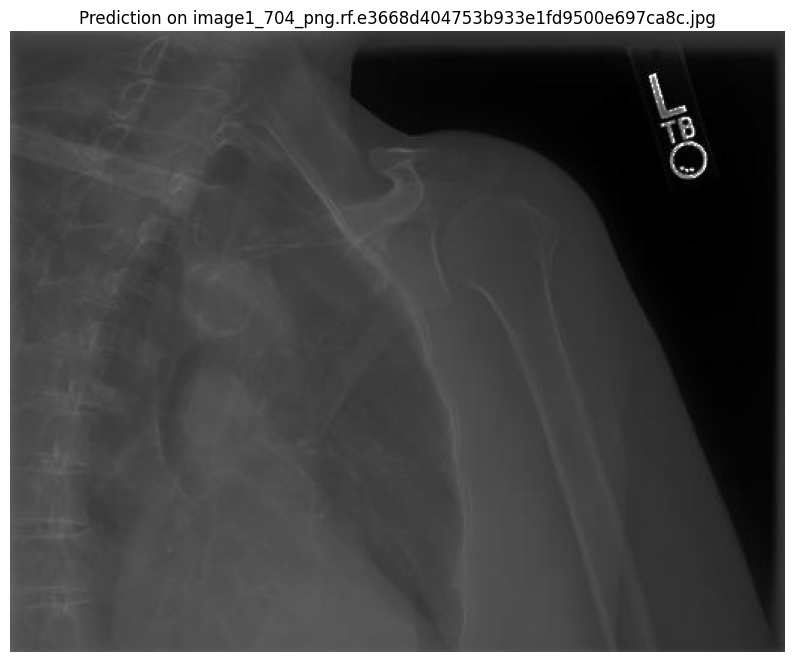


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_40_png.rf.3404b7671f39e7295097dd6dabb28a97.jpg: 224x224 (no detections), 10.7ms
Speed: 1.2ms preprocess, 10.7ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 224)


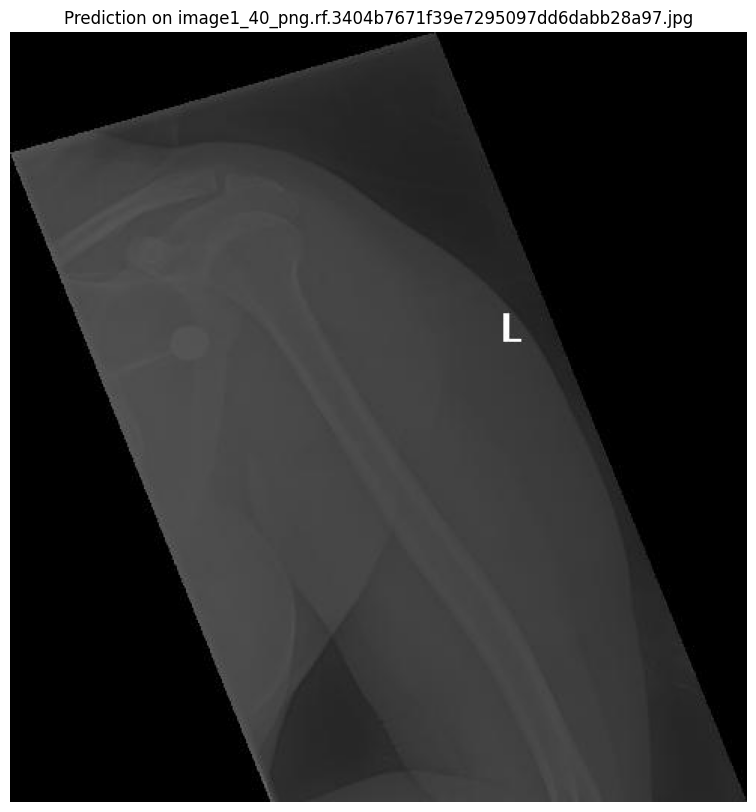


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_258_png.rf.7d64b6239897f6838c97b4d18d6ed0c9.jpg: 224x128 (no detections), 15.1ms
Speed: 0.9ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 128)


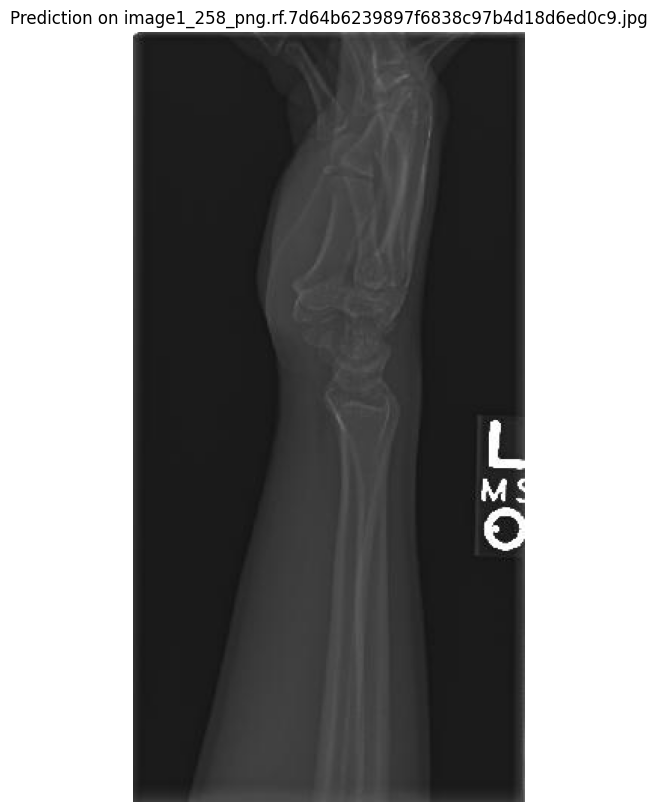


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_4498_png.rf.36adec7c0d9bacf95faf5c87d28dfbe7.jpg: 224x224 (no detections), 15.7ms
Speed: 1.1ms preprocess, 15.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 224)


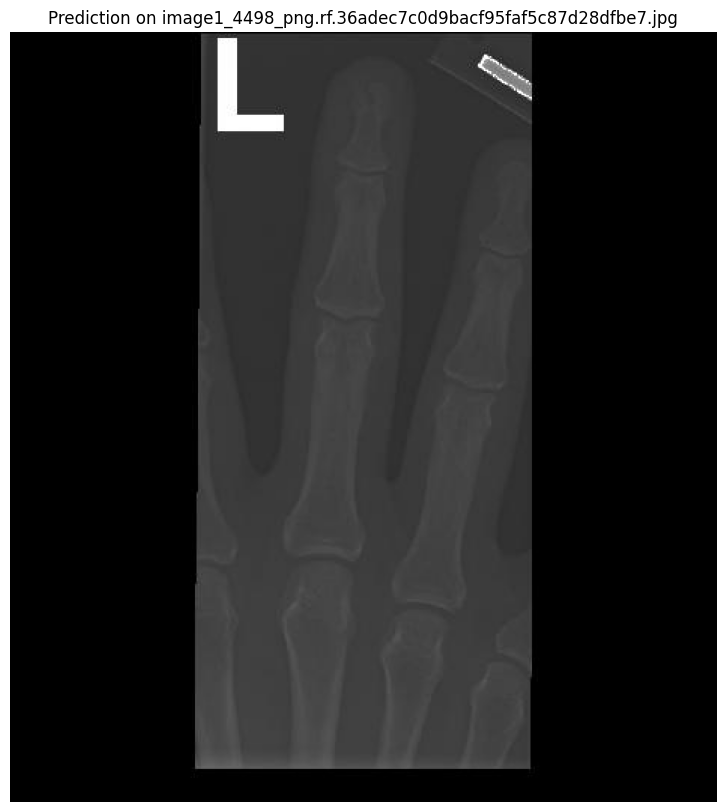


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_508_png.rf.63f80ba9eca75737d7435b9122d70288.jpg: 224x192 (no detections), 15.9ms
Speed: 2.5ms preprocess, 15.9ms inference, 0.8ms postprocess per image at shape (1, 3, 224, 192)


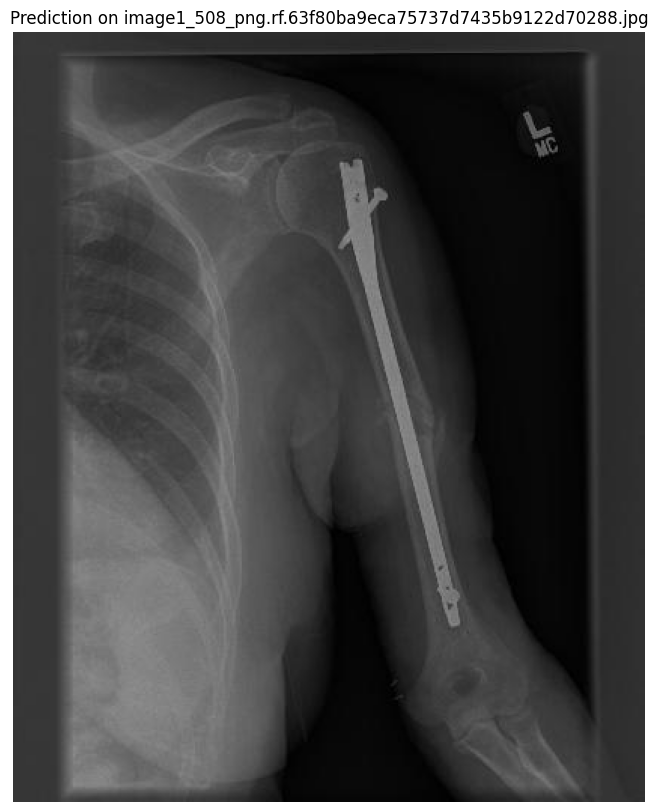


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_283_png.rf.f41cf5bd6aa70a2216bb701856df9e03.jpg: 192x224 (no detections), 14.2ms
Speed: 1.1ms preprocess, 14.2ms inference, 0.8ms postprocess per image at shape (1, 3, 192, 224)


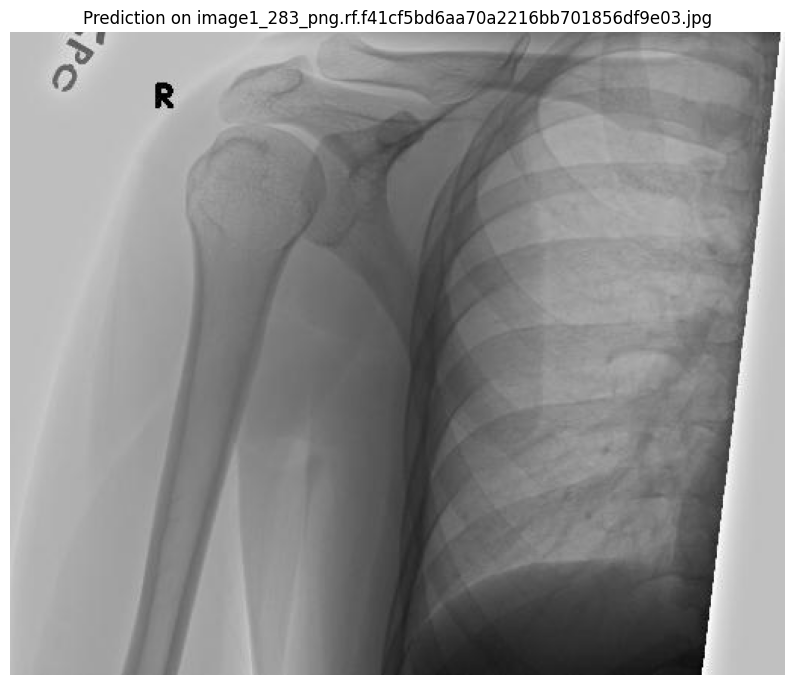


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image2_176_png.rf.87231f93e98596a5a1b52ef2fd5a7871.jpg: 224x192 1 humerus, 14.3ms
Speed: 1.0ms preprocess, 14.3ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


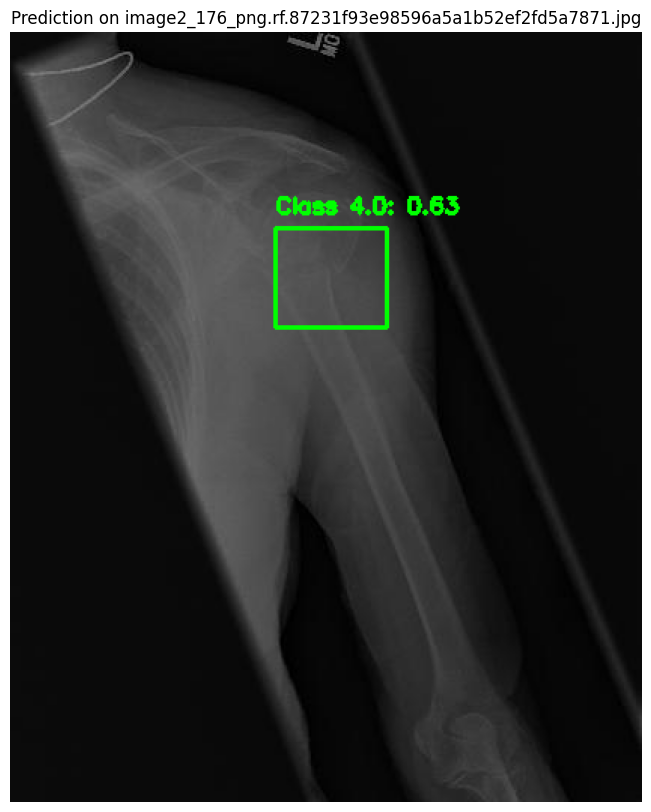


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_467_png.rf.b1cc6164190c9fbf10f622b0f06fc115.jpg: 224x192 (no detections), 14.3ms
Speed: 1.0ms preprocess, 14.3ms inference, 0.9ms postprocess per image at shape (1, 3, 224, 192)


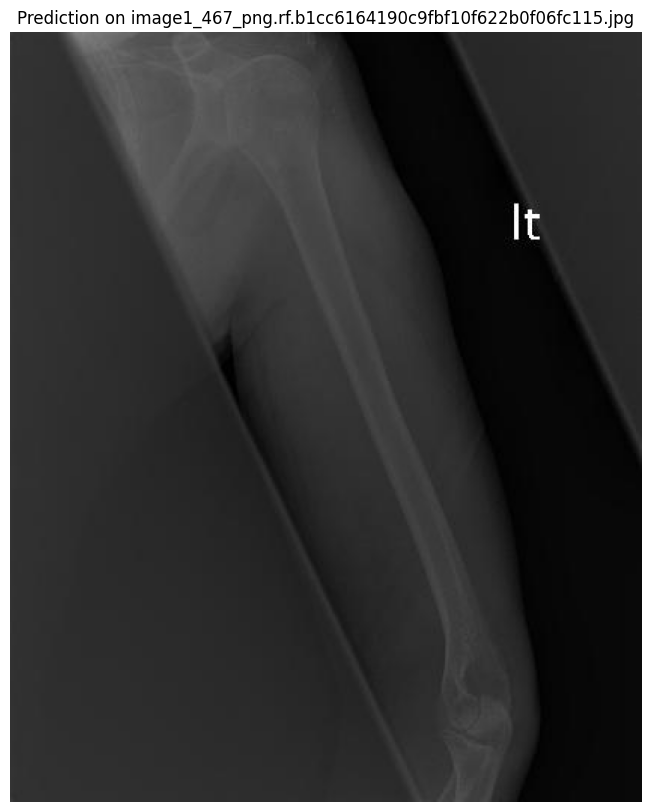


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_3221_png.rf.5fb071486cc85c923cd8350b22ad6ee7.jpg: 224x128 (no detections), 14.2ms
Speed: 2.0ms preprocess, 14.2ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 128)


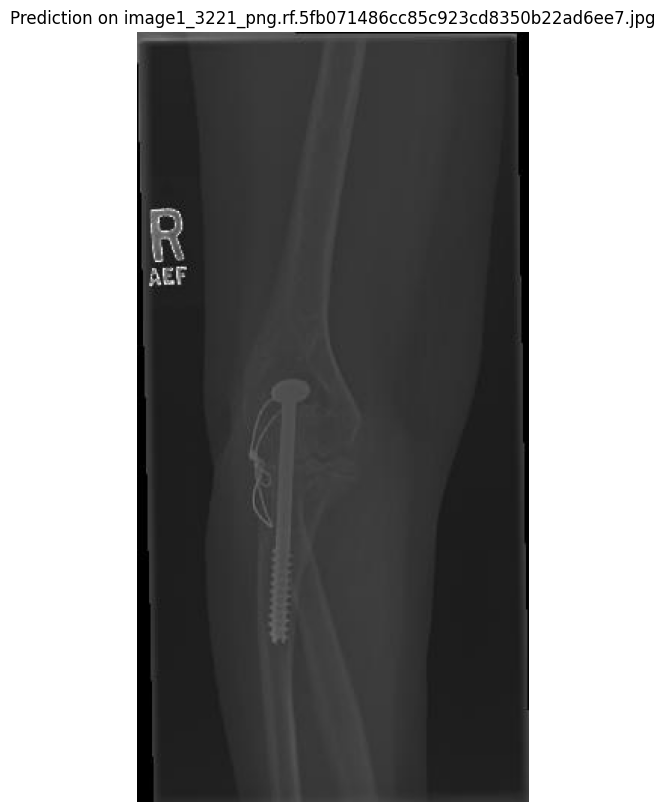


image 1/1 /root/.cache/kagglehub/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/versions/2/BoneFractureYolo8/test/images/image1_1134_png.rf.642f46a1f0f794f24f5aa3edcf58bdcf.jpg: 224x128 (no detections), 10.7ms
Speed: 0.8ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 224, 128)


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Path to your test images
test_images_path = os.path.join(subdirectory_path, 'test', 'images')
# Get all image files in the test folder (assuming they are in a common format like .jpg or .png)
test_images = [f for f in os.listdir(test_images_path) if f.endswith(('.jpg', '.png'))]

# Iterate through test images and make predictions
for img_name in test_images:
    # Read the image using OpenCV
    img_path = os.path.join(test_images_path, img_name)
    image = cv2.imread(img_path)

    # Perform prediction
    results = model(img_path)

    # The results contain the predicted boxes, class IDs, and scores
    predictions = results[0].boxes

    # Draw the predicted boxes on the image
    for pred in predictions:
        # Extract the bounding box coordinates (x1, y1, x2, y2)
        x1, y1, x2, y2 = map(int, pred.xyxy[0].tolist())

        # Draw the bounding box
        color = (0, 255, 0)  # Green color for the box
        thickness = 2
        image = cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)

        # Optional: You can add labels, like class names, if needed
        label = f"Class {pred.cls[0]}: {pred.conf[0]:.2f}"  # Class and confidence score
        cv2.putText(image, label, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Convert BGR image to RGB for plotting
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.title(f"Prediction on {img_name}")
    plt.axis("off")
    plt.show()
